# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX

#### Detecting the Encoding for the original dataset

In [4]:
import chardet

with open("electricty.csv", "rb") as f:
    raw_data = f.read()
    result = chardet.detect(raw_data)

print(result['encoding'])

UTF-16


In [5]:
electricity_df=pd.read_csv("electricty.csv", encoding="utf-16",  sep="\t")
electricity_df.head(25)

,Year of Period,Month of Period,Unit,Coal,Combust. Renew.,Hydro,Natural Gas,Oil,Other,Peat & BM,Solar Farms,Wastes,Wind
0,2024,January,GWh,99,13,132,"1,323",28,1,39,17,56,"1,142"
1,2024,February,GWh,86,12,114,992,11,1,54,20,50,"1,197"
2,2024,March,GWh,87,14,117,"1,020",6,1,49,35,23,"1,331"
3,2024,April,GWh,83,12,89,"1,072",5,1,52,65,39,929
4,2024,May,GWh,25,12,35,"1,350",25,1,59,94,56,560
5,2024,June,GWh,72,11,15,"1,045",3,1,49,101,55,640
6,2024,July,GWh,127,12,11,"1,166",13,1,31,115,52,587
7,2024,August,GWh,69,12,31,964,3,1,1,98,56,948
8,2024,September,GWh,85,11,23,"1,167",49,1,1,74,53,795
9,2024,October,GWh,87,13,48,"1,216",15,1,40,54,56,"1,032"


### Checking the Datatype

In [7]:
electricity_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Year of Period   180 non-null    int64 
 1   Month of Period  180 non-null    object
 2   Unit             180 non-null    object
 3   Coal             180 non-null    int64 
 4   Combust. Renew.  180 non-null    int64 
 5   Hydro            180 non-null    int64 
 6   Natural Gas      180 non-null    object
 7   Oil              180 non-null    int64 
 8   Other            180 non-null    int64 
 9   Peat & BM        180 non-null    int64 
 10  Solar Farms      180 non-null    int64 
 11  Wastes           180 non-null    int64 
 12  Wind             180 non-null    object
dtypes: int64(9), object(4)
memory usage: 18.4+ KB


The above dataset shows the generation of electricity in Ireland from various different sources for the period from January 2010 until Dec 2024.
The natural gas and wind consumption was the most used source in Ireland.

The column names has characters like spaces, dots and &, and that needs to be changed.
The numbers in the column Natural gas and wind has commas and they are stored as object, and that needs to be changed.

### Changing the Column names (Removing the spaces, &, dots)

In [10]:
electricity_df.columns = electricity_df.columns.str.replace(r"[.& ]", "_", regex=True)
electricity_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Year_of_Period   180 non-null    int64 
 1   Month_of_Period  180 non-null    object
 2   Unit             180 non-null    object
 3   Coal             180 non-null    int64 
 4   Combust__Renew_  180 non-null    int64 
 5   Hydro            180 non-null    int64 
 6   Natural_Gas      180 non-null    object
 7   Oil              180 non-null    int64 
 8   Other            180 non-null    int64 
 9   Peat___BM        180 non-null    int64 
 10  Solar_Farms      180 non-null    int64 
 11  Wastes           180 non-null    int64 
 12  Wind             180 non-null    object
dtypes: int64(9), object(4)
memory usage: 18.4+ KB


### Replacing the Comma's in the Natural gas and Wind values

In [12]:
electricity_df[["Natural_Gas", "Wind"]] = electricity_df[["Natural_Gas", "Wind"]].replace(",", "", regex=True)
electricity_df.head()

,Year_of_Period,Month_of_Period,Unit,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind
0,2024,January,GWh,99,13,132,1323,28,1,39,17,56,1142
1,2024,February,GWh,86,12,114,992,11,1,54,20,50,1197
2,2024,March,GWh,87,14,117,1020,6,1,49,35,23,1331
3,2024,April,GWh,83,12,89,1072,5,1,52,65,39,929
4,2024,May,GWh,25,12,35,1350,25,1,59,94,56,560


### Creating "Period" by combining the Month and Year of Period as single column and set as index for time series analysis

In [14]:
# Converting the Year to string to combine the two columns
electricity_df["Year_of_Period"]=electricity_df["Year_of_Period"].astype(str)

#Combining the two columns
electricity_df["Period"] = electricity_df["Month_of_Period"] + " " + electricity_df["Year_of_Period"]

# converting to datatime format
electricity_df["Period"] = pd.to_datetime(electricity_df["Period"], format= '%B %Y')

# Dropping the existing columns
electricity_df.drop(columns=["Year_of_Period", "Month_of_Period"], inplace=True)

electricity_df.sort_values(by=["Period"], ascending=True, inplace=True)

# Set "Period" as the index of the dataset
electricity_df = electricity_df.set_index("Period")

### Converting the columns "Natural_Gas" and "Wind" into integer (from object)

In [16]:
electricity_df[["Natural_Gas", "Wind"]] = electricity_df[["Natural_Gas", "Wind"]].astype("int64")

In [17]:
electricity_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 180 entries, 2010-01-01 to 2024-12-01
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Unit             180 non-null    object
 1   Coal             180 non-null    int64 
 2   Combust__Renew_  180 non-null    int64 
 3   Hydro            180 non-null    int64 
 4   Natural_Gas      180 non-null    int64 
 5   Oil              180 non-null    int64 
 6   Other            180 non-null    int64 
 7   Peat___BM        180 non-null    int64 
 8   Solar_Farms      180 non-null    int64 
 9   Wastes           180 non-null    int64 
 10  Wind             180 non-null    int64 
dtypes: int64(10), object(1)
memory usage: 16.9+ KB


## Creating a new column "Total_Generation" - summing all the other methods of generation:

1. It helps to analyse the overall eectricity production in Ireland across various sources.

2. Identifying Trends: It helps us to understand how Ireland’s total electricity generation has changed over time.

3. Forecasting: This helps in building forecasting models (e.g., ARIMA/SARIMA) to predict future electricity demands in Ireland.

4. Seasonality & Impact Analysis: It is useful in studying how factors like weather, policy changes, and demand shifts affect total electricity generation.

In [19]:
electricity_df["Total_Generation"] = electricity_df.iloc[:, 1:].sum(axis=1)

In [20]:
electricity_df.head(24)

,Unit,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind,Total_Generation
Period,,,,,,,,,,,,
2010-01-01,GWh,400,0,97,1474,77,20,195,0,0,248,2511
2010-02-01,GWh,407,0,60,1395,29,22,190,0,0,151,2254
2010-03-01,GWh,308,0,29,1592,16,22,172,0,0,251,2390
2010-04-01,GWh,233,0,74,1368,14,23,213,0,0,186,2111
2010-05-01,GWh,272,0,13,1354,7,19,177,0,0,169,2011
2010-06-01,GWh,167,0,3,1456,34,17,141,0,0,155,1973
2010-07-01,GWh,243,0,18,1420,1,19,94,0,0,268,2063
2010-08-01,GWh,226,0,14,1413,16,20,89,0,0,207,1985
2010-09-01,GWh,220,0,51,1376,7,22,164,0,0,289,2129


### Null Values

In [22]:
electricity_df.isnull().sum()

Unit                0
Coal                0
Combust__Renew_     0
Hydro               0
Natural_Gas         0
Oil                 0
Other               0
Peat___BM           0
Solar_Farms         0
Wastes              0
Wind                0
Total_Generation    0
dtype: int64

### Checking for any Regex characters

In [24]:
import re

regex_pattern = r"[.*^$+?{}|()\\[\]]" 

# Function to check if a value contains any regex special characters
def contains_regex(value):
    return bool(re.search(regex_pattern, str(value)))

# Apply the check to the entire DataFrame
if electricity_df.applymap(contains_regex).any().any():
    print("Regex special characters found!")
else:
    print("No regex special characters found.")

No regex special characters found.


# Descriptive Statistics

In [26]:
electricity_df.describe()

,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind,Total_Generation
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,245.816667,9.566667,61.316667,1172.516667,17.733333,5.911111,147.961111,6.305556,27.361111,637.688889,2332.177778
std,144.233419,7.001277,38.360751,192.906684,33.962122,7.685355,75.430412,19.715320,21.226042,326.350692,275.835595
min,0.000000,0.000000,1.000000,765.000000,0.000000,0.000000,0.000000,0.000000,0.000000,140.000000,1702.000000
25%,106.000000,0.000000,27.000000,1024.000000,1.000000,0.000000,63.750000,0.000000,10.000000,371.750000,2146.250000
50%,262.000000,13.000000,54.500000,1160.000000,5.500000,1.000000,176.500000,0.000000,13.000000,576.000000,2316.000000
75%,358.500000,15.000000,94.000000,1314.000000,16.250000,14.000000,213.250000,0.000000,49.250000,849.250000,2515.250000
max,525.000000,27.000000,142.000000,1673.000000,184.000000,23.000000,246.000000,115.000000,58.000000,1537.000000,3018.000000


##### Coal:
1. Mean = 245.8, Median = 262 → Slight left skew (mean < median).
2. Std Dev = 144 → High variability (CV ≈ 58.6%).
3. Min = 0, Q1 = 106, Q3 = 359, Max = 525 → The skew is likely due to lower values (min & Q1) being much smaller than the upper quartiles.

##### Combustible Renewables:
1. Mean = 9.5, Median = 13, Std Dev = 7 → Likely left skew.
2. Min = 0, Q1 = 0, Q3 = 15, Max = 27 → High variability (CV ≈ 73.7%). A high lower values and few higher values (above Q3) are likely contributing to this skewness.

##### Hydro:
1. Mean = 61, Median = 56 → Slight right skew (mean > median).
2. Std Dev = 38 → Moderate variability (CV ≈ 62.3%).
3. Max = 142, Q3 = 94 → The high max value could be influencing the skew.

##### Natural Gas:
1. Mean ≈ Median → Symmetrical distribution (no strong skew).
2. Std Dev = 193 → Moderate variability (CV ≈ 31%).
3. Min to Max → Shows gradual progression without extreme outliers.

##### Oil:
1. Mean = 18, Median = 6 → Right skew (mean > median).
2. Max = 184, Q3 = 16 → The high max value contributes to the skew.
    3. Std Dev = 1  Low variability.

##### Other:
1. Mean = 6, Median < Mean → Right skew.
2. Q3 = 14, Max = 23 → Higher quartile values indicate a long tail.

##### Peat:
1. Mean = 148, Median = 177 → Left skew (mean < median).
2. Min = 0, Std Dev = 75 → High variability (CV ≈ 50.7%).

##### Solar Farms:
1. Median = 0, Mean = 6 → Extreme right skew (many zero values).
2. Q1 to Q3 = 0, Max = 115 → Skew is due to occasional high peaks.

##### Wastes:
1. Mean = 27, Median = 13 → Right skew.
2. Std Dev = 21 → High variability (CV ≈ 77.8%).

##### Wind:
1. Mean = 637, Median = 576 → Mild right skew (due to extreme values).
2. Max = 1537, Std Dev = 326 → High variability (CV ≈ 51.2%).

##### Total Generation:
1. Mean = 2332, Median = 2316 → Symmetrical distribution.
2. Std Dev = 276 → Low to moderate variability (CV ≈ 11.8%).
3. Gradual quartile progression (Min = 1702, Max = 3018) → Suggests a stable distribution.

### Conclusion:
Coal, Peat, Wastes, Wind → High Variability. Hydro, Natural Gas → Moderate Variability.  Solar, Oil → Extreme Skewness.  Total Generation → Stable & Low Variability

# Exploratory data analysis:
## Distribution of the features - Univariate analysis

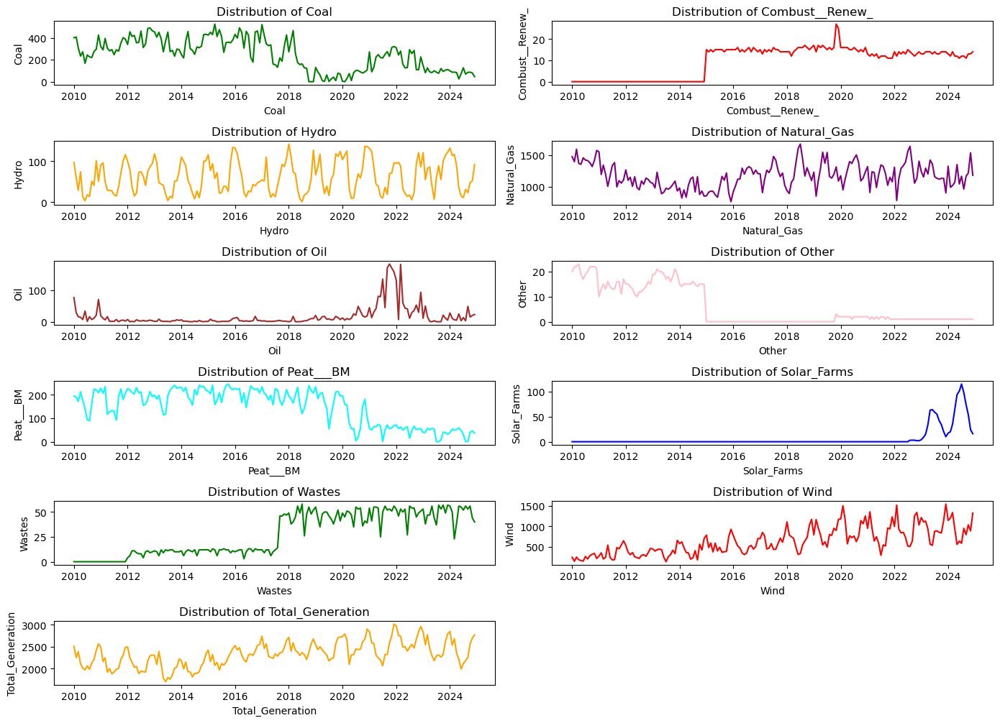

In [29]:
# List of colors for each plot 
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink', 'cyan']

numerical_features = electricity_df.iloc[:, 1:]

plt.figure(figsize=(14, 150))

for i, col in enumerate(numerical_features, 1):
    color = colors[i % len(colors)]  # Cycle through the color list
    plt.subplot(len(numerical_features)//2, 2, i)
    sns.lineplot(data=electricity_df, x=electricity_df.index, y=col, color=color)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)

plt.tight_layout()
plt.show()

##### Coal:
High usage from 2010 to 2018, followed by a decline.  Slight increase in 2022, but dropped again afterward.

##### Combustible Renewables:
Stable usage (~12-15) from 2015 onwards. Sharp peak in 2020, then returned to normal levels.

##### Hydro:
Present from 2010, the range of usage is between 0-150, displaying U-shaped cyclical patterns frequently.

##### Natural Gas:
Declined from 2010 to 2014, then stabilized.  Frequent peaks and troughs, showing variability.

##### Oil:
Consistently low, except for brief spikes in 2021-2022.  Usage returned to low levels after 2022.

##### Other:
Continuously low since 2015, with no major fluctuations.

##### Peat:
High usage until 2022, then a sharp decline.

##### Solar:
Minimal usage until 2023.  Significant increase in 2023-2024, showing cyclical growth.

##### Wastes:
High usage since 2018, following frequent cycles.

##### Wind:
Steady growth from 2010 to 2024, with frequent peaks and troughs. Maximum usage ~1500.

##### Total Generation:
1. Electricity production was below 2500 until 2017. 
2. Post-2017: Increased and fluctuated between 2500-3000, with peaks and troughs.
3. Dominant sources: Natural Gas & Wind.
4. Minor contributors: Solar (0-100), Hydro (0-100), Wastes (~50), Combustible Renewables (~15).

### Bivariate analysis:

<Figure size 1400x700 with 0 Axes>

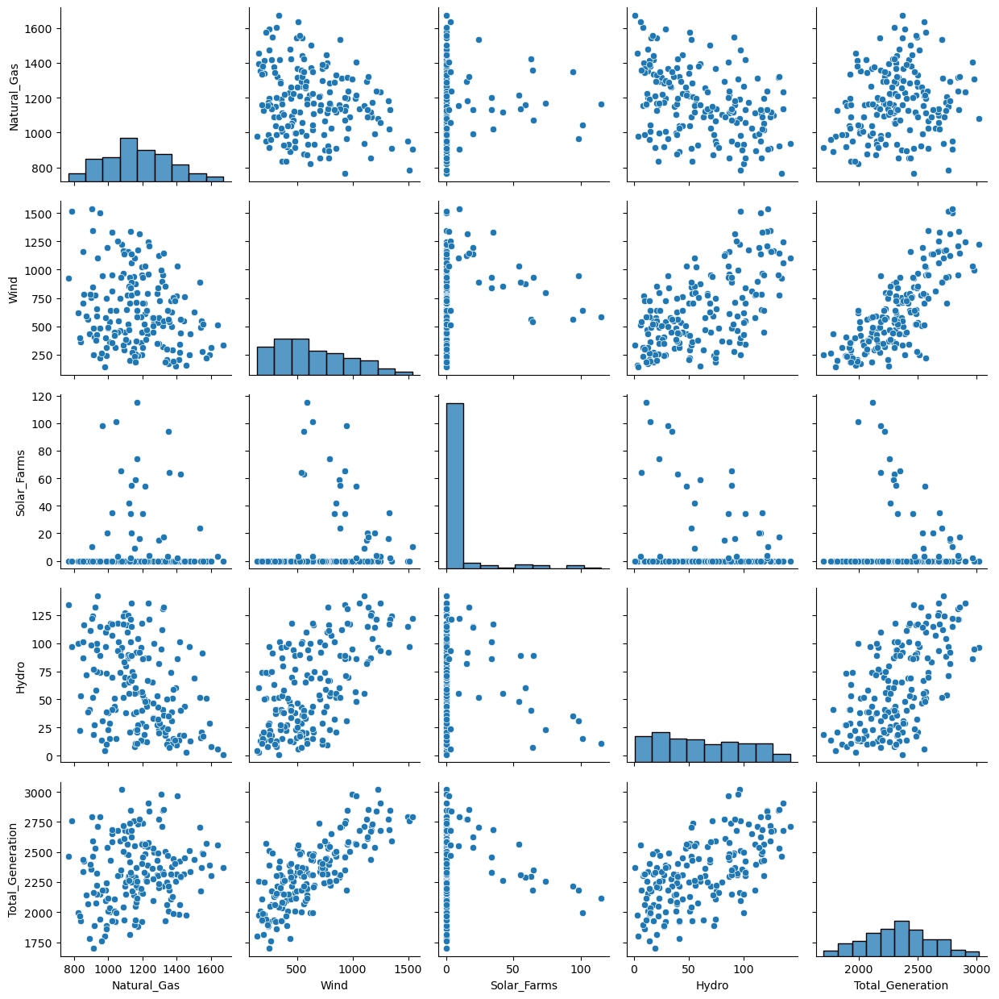

In [32]:
plt.figure(figsize=(14,7))
sns.pairplot(electricity_df[["Natural_Gas", "Wind", "Solar_Farms", "Hydro", "Total_Generation"]])
plt.xlabel("Major Irish Electricity Generation sources")
plt.ylabel("Major Irish Electricity Generation sources")

plt.tight_layout()
plt.show()

Wind and Hydro exhibit a positive linear relationship with Total Generation, meaning their growth contributes directly to the overall electricity production.
Solar Farms, however, show a negative linear relationship with Total Generation, suggesting that as total generation increases, solar’s contribution remains relatively lower or decreases in proportion.
Additionally, Wind and Solar display negative linearity, indicating that an increase in wind generation might correspond with a decrease in solar generation or vice versa.

### Distribution of features with the "Total_Generation"

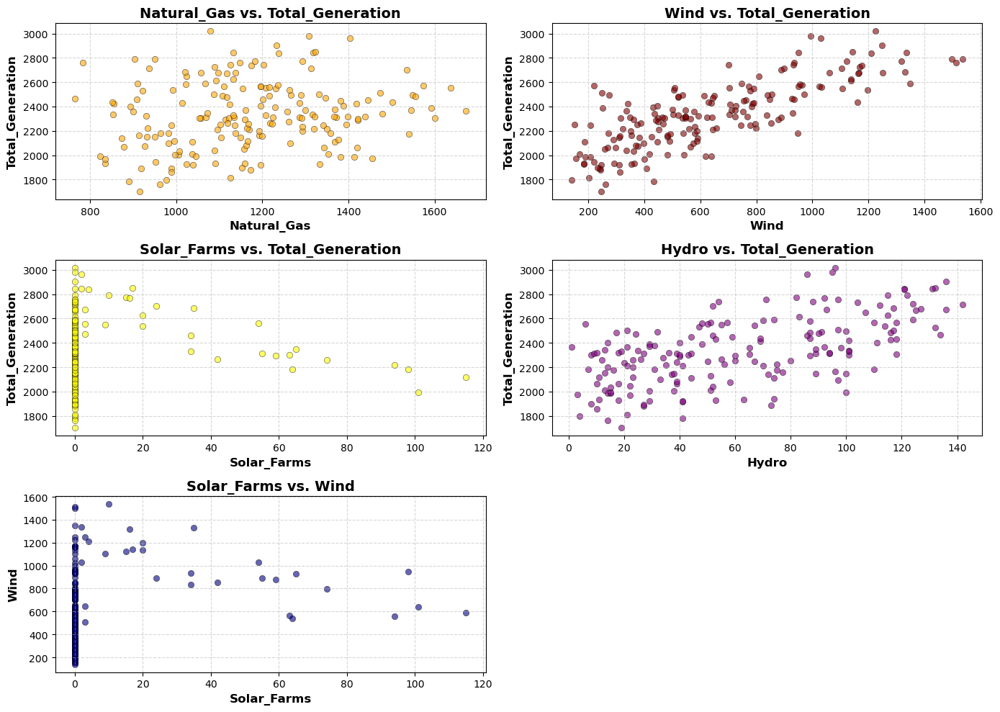

In [34]:
correlation_pairs = [
    ('Natural_Gas', 'Total_Generation'),  # Positive
    ('Wind', 'Total_Generation'),  # Positive
    ('Solar_Farms', 'Total_Generation'),  # Positive
    ('Hydro', 'Total_Generation'),  # Negative
    ('Solar_Farms', 'Wind'),

]
colors = ["orange", "maroon", "yellow", "purple", "navy"]

plt.figure(figsize=(14, 10))

for i, (x, y) in enumerate(correlation_pairs, 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(x=x, y=y, data=electricity_df, alpha=0.6, edgecolor='k', color=colors[i - 1])
    plt.title(f'{x} vs. {y}', fontsize=14, weight="bold")
    plt.xlabel(x, fontsize=12, weight="bold")
    plt.ylabel(y, fontsize=12, weight="bold")
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

From the above plot, it can be seen that the wind and Hydro are linear with the Total generation. Solar farms have a negative linear relationship with the total generation.


### Correlation between the features:

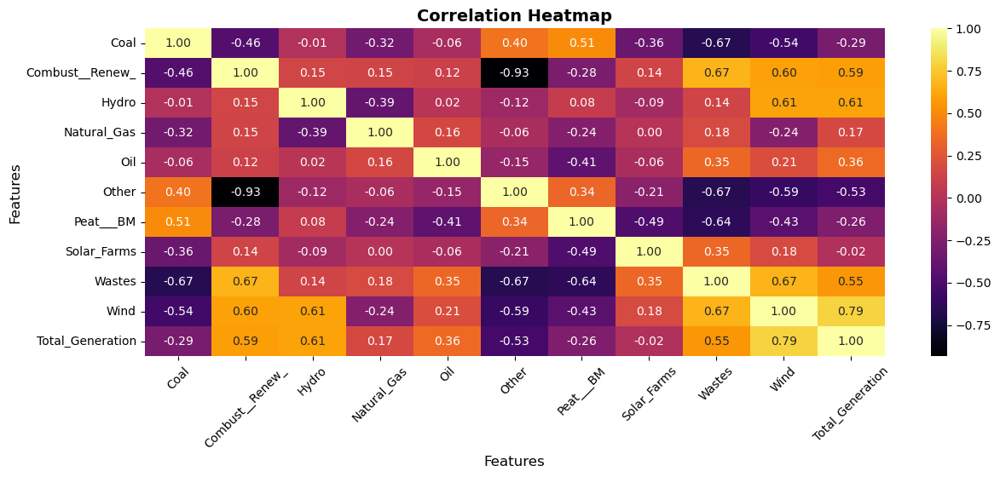

In [37]:
plt.figure(figsize=(14, 5))
correlation = electricity_df.iloc[:, 1:]
sns.heatmap(correlation.corr(), annot=True, cmap="inferno", fmt=".2f", cbar=True)
plt.title("Correlation Heatmap", fontsize=14, weight="bold")
plt.xlabel("Features", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(rotation=45)
plt.show()


The Total_Generation has moderate to high correlation with wind, hydro and combust_renew. Negative correlation with coal, peat.

### Distribution of "Total_Generation"

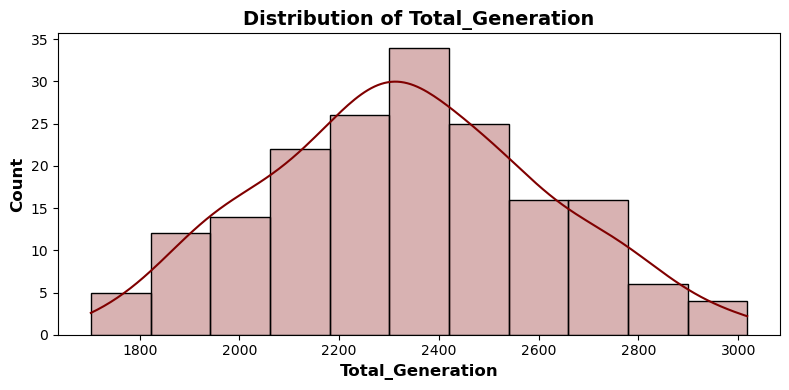

In [39]:
plt.figure(figsize=(8, 4))

# Correct subplot indexing: (rows, columns, index)

sns.histplot(
    electricity_df, 
    x="Total_Generation", 
    label="Total_Generation", 
    color="maroon", 
    alpha=0.3, 
    kde=True
)
plt.xlabel("Total_Generation", fontsize=12, weight="bold")
plt.ylabel("Count", fontsize=12, weight="bold")
plt.title("Distribution of Total_Generation", fontsize=14, weight="bold")
plt.tight_layout()
plt.show()

The distribution of total generaion is symmetrical, as the mean and median are close to each other and the standard deviation is low.

### Outliers:

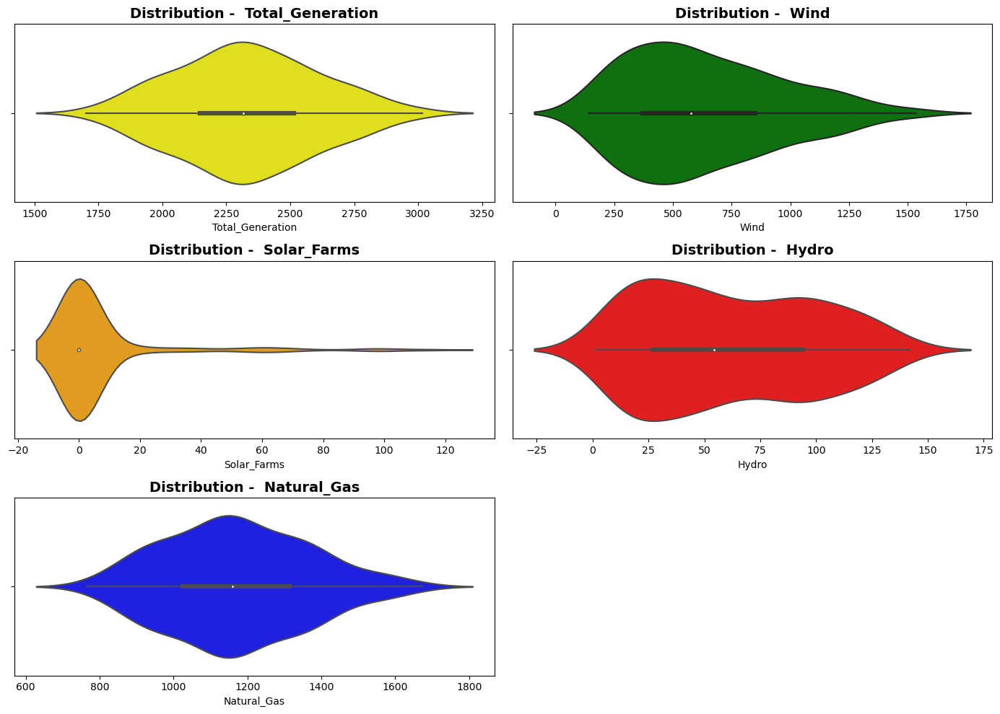

In [41]:
columns = ["Total_Generation", "Wind", "Solar_Farms", "Hydro", "Natural_Gas"]
colors = ["yellow", "green", "orange", "red", "blue"]
plt.figure(figsize=(14, 10))
for i, col in enumerate(columns, 1):
    plt.subplot(3, 2, i)
    sns.violinplot(electricity_df, x=col, color=colors[i-1])
    plt.xlabel(f"{col}", fontsize=10)
    plt.title(f"Distribution -  {col}", fontsize=14, weight="bold")

plt.tight_layout()
plt.show()

The distribution of Natural gas and Total generation is close to symmetry and does not have skewness while the solar and wind have right skewness and Hydr is bi-modal.

#### Next steps: Visualising features using Q-Q Plot:

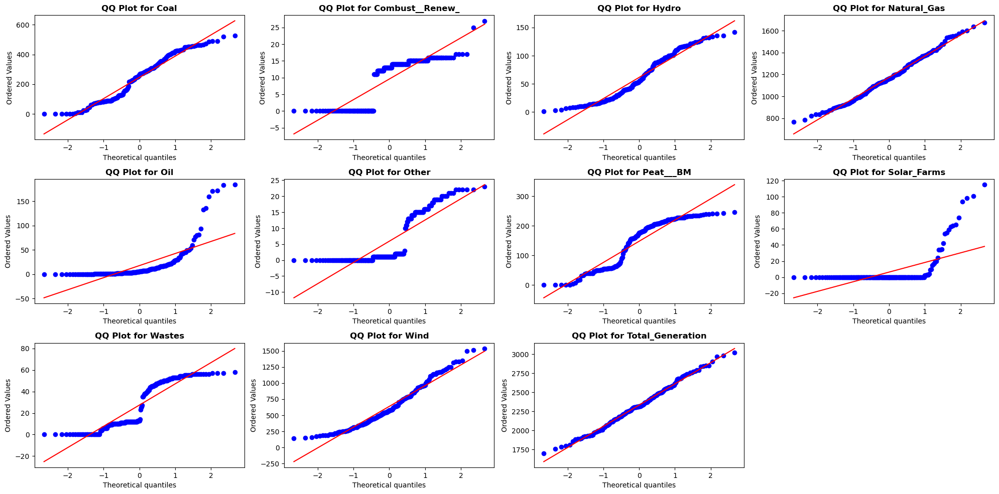

In [43]:
from scipy.stats import probplot
plt.figure(figsize=(20, 150))
for i, feature in enumerate (numerical_features, 1):
    plt.subplot(len(numerical_features) // 4 +1, 4, i)
    probplot(electricity_df[feature], dist="norm", plot=plt)
    plt.title(f"QQ Plot for {feature}", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

From the QQ Plot, it can be seen that total generation, natural gas, wind are somewhat close to the normal red line with minor deviations. While other sources are deviating significantly from the normal line.

## Next Steps: Anomaly detection using Isolation Forest

In [45]:
anomalies_df = electricity_df.copy()
anomalies_df = numerical_features

In [46]:
anomalies_df.head(3)

,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind,Total_Generation
Period,,,,,,,,,,,
2010-01-01,400,0,97,1474,77,20,195,0,0,248,2511
2010-02-01,407,0,60,1395,29,22,190,0,0,151,2254
2010-03-01,308,0,29,1592,16,22,172,0,0,251,2390


In [47]:
X_anomaly = anomalies_df.iloc[:, :]


In [48]:
# training the model
from sklearn.ensemble import IsolationForest
anomaly_detector = IsolationForest(random_state=0)

In [49]:
#training the data
anomaly_detector.fit(X_anomaly)


IsolationForest(random_state=0)

In [50]:
anomaly_scores = anomaly_detector.decision_function(X_anomaly)
anomalies_df["Anomaly_Score"] = anomaly_scores

In [51]:
#setting the anomaly standard and we set a threshhold for the scores

threshold  = anomaly_scores.mean() - 1.5 * anomaly_scores.std()
anomalies_df["Anomaly"] = anomalies_df["Anomaly_Score"] <  threshold

In [52]:
#displaying the results

anomaly_results = anomalies_df[anomalies_df["Anomaly"]== True]

In [53]:
anomalies_df[anomalies_df["Anomaly"]== True].shape

(14, 13)

In [54]:
anomalies_df[anomalies_df["Anomaly"]== True]

,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind,Total_Generation,Anomaly_Score,Anomaly
Period,,,,,,,,,,,,,
2010-01-01,400,0,97,1474,77,20,195,0,0,248,2511,-0.077925,True
2010-06-01,167,0,3,1456,34,17,141,0,0,155,1973,-0.068286,True
2010-12-01,425,0,51,1573,71,21,209,0,0,219,2569,-0.093836,True
2019-11-01,78,27,112,1313,13,3,215,0,52,898,2711,-0.048222,True
2020-02-01,0,16,115,951,5,2,160,0,45,1498,2792,-0.030079,True
2021-07-01,215,12,10,1343,136,2,1,0,50,296,2065,-0.057276,True
2021-10-01,230,11,70,1023,184,2,55,0,53,956,2584,-0.043825,True
2021-11-01,311,11,71,1148,171,1,59,0,51,936,2759,-0.029121,True
2021-12-01,321,11,96,1079,159,1,69,0,56,1226,3018,-0.070425,True


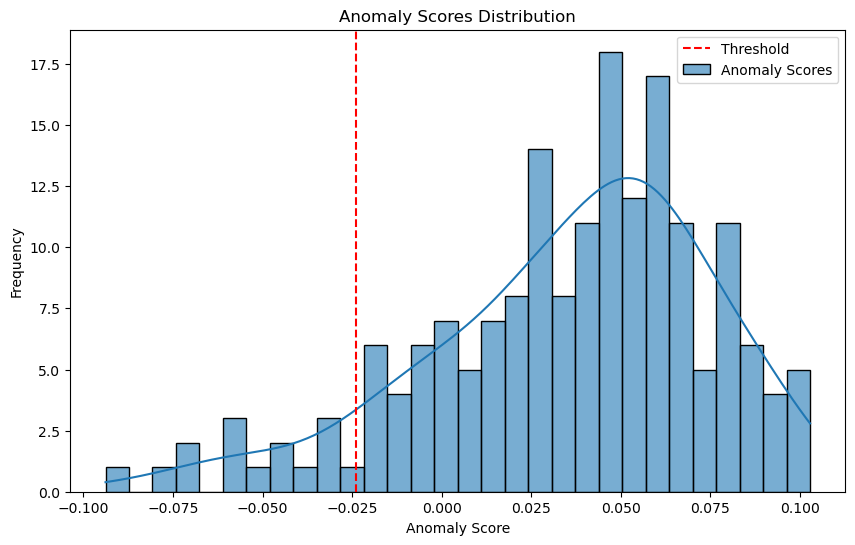

In [55]:
plt.figure(figsize=(10, 6))
sns.histplot(anomalies_df["Anomaly_Score"], kde=True, label="Anomaly Scores", bins=30, alpha=0.6)
plt.axvline(x=threshold, color='red', linestyle='--', label="Threshold")
plt.title("Anomaly Scores Distribution")
plt.xlabel("Anomaly Score")
plt.ylabel("Frequency")
plt.legend()
plt.show()

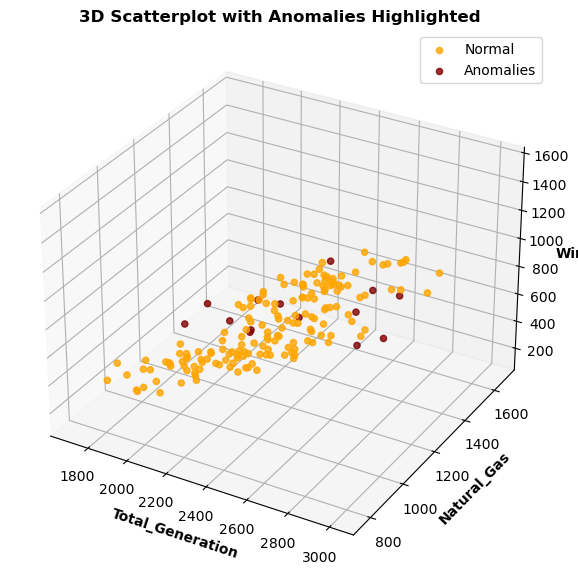

In [56]:
from mpl_toolkits.mplot3d import Axes3D

# Assuming anomalies_df contains the anomaly labels
normal_data = anomalies_df[~anomalies_df["Anomaly"]]
anomalous_data = anomalies_df[anomalies_df["Anomaly"]]

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(normal_data["Total_Generation"], normal_data["Natural_Gas"], normal_data["Wind"], label="Normal", color='orange', alpha=0.8)
ax.scatter(anomalous_data["Total_Generation"], anomalous_data["Natural_Gas"], anomalous_data["Wind"], color='maroon', label="Anomalies", alpha=0.8)

ax.set_xlabel("Total_Generation", weight="bold")
ax.set_ylabel("Natural_Gas", weight="bold")
ax.set_zlabel("Wind", weight="bold")
plt.legend()
plt.title("3D Scatterplot with Anomalies Highlighted", fontsize=12, weight="bold")
plt.show()

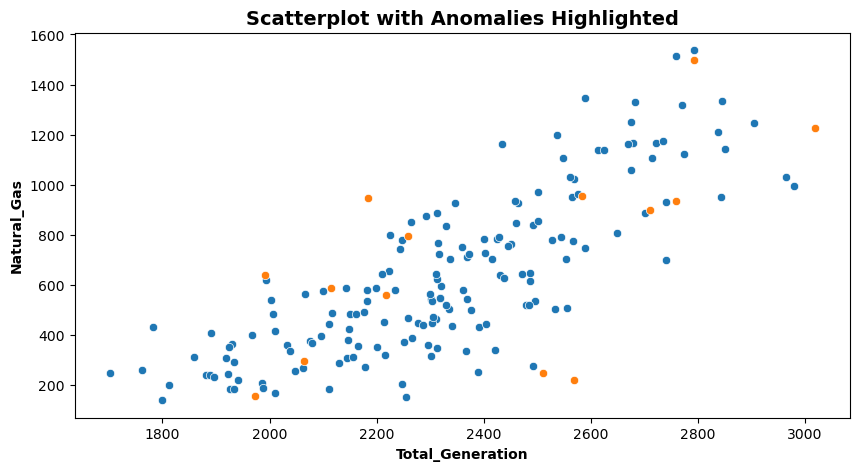

In [57]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=anomalies_df, x=normal_data["Total_Generation"], y=normal_data["Wind"])
sns.scatterplot(data=anomalies_df, x=anomalous_data["Total_Generation"], y=anomalous_data["Wind"])

plt.xlabel("Total_Generation", weight="bold")
plt.ylabel("Natural_Gas", weight="bold")

plt.title("Scatterplot with Anomalies Highlighted", fontsize=14, weight="bold")
plt.show()

In [58]:
electricity_df.head()

,Unit,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind,Total_Generation
Period,,,,,,,,,,,,
2010-01-01,GWh,400,0,97,1474,77,20,195,0,0,248,2511
2010-02-01,GWh,407,0,60,1395,29,22,190,0,0,151,2254
2010-03-01,GWh,308,0,29,1592,16,22,172,0,0,251,2390
2010-04-01,GWh,233,0,74,1368,14,23,213,0,0,186,2111
2010-05-01,GWh,272,0,13,1354,7,19,177,0,0,169,2011


#### Percentage of anomalies


In [60]:

percentage_anomalies = (14/180)*100
percentage_anomalies

7.777777777777778

## Conclusion:

There is 7.8% anomalies in the dataset. Observing the anomalies in the dataframe and visualizations, it can be seen that the detected anomalies primarily occur at extreme high or low values of Total_Generation. However, these fluctuations may be a result of:

Seasonal patterns (e.g., higher generation during winter due to increased demand).

Cyclical variations (e.g., fluctuations due to economic factors, policy changes, or supply-demand shifts).

Since these variations are inherent to time series data, removing these anomalies could lead to the loss of important seasonal and cyclical information. 

Therefore, instead of deleting them, it is crucial to retain these data points to preserve the integrity of the time series analysis.

## Electricity Dashboard


In [62]:
import panel as pn
import panel.widgets as pmw
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import holoviews as hv
import hvplot.pandas  # Required for hvplot
from holoviews import streams

pn.extension()

In [63]:
# PointerX stream to track hover position
tap = streams.PointerX(x=electricity_df.index.min())

# Outlier Detection Function
def find_outliers(variable="Total_Generation", window=30, sigma=5):
    avg = electricity_df[variable].rolling(window=window, min_periods=1).mean()
    residual = electricity_df[variable] - avg
    std = residual.rolling(window=window, min_periods=1).std()
    outliers = (np.abs(residual) > std * sigma)
    
    return avg, avg[outliers]

# HoloViews Plot Function
def hvplot2(variable, window, sigma):
    avg, highlight = find_outliers(variable, window, sigma)
    
    line = avg.hvplot(height=500, width=1000, label="Rolling Avg", color="blue", line_width=2)
    outliers = highlight.hvplot.scatter(color="red", size=100, label="Outliers", padding=0.1)
    
    tap.source = line
    return (line * outliers).opts(legend_position="top_right")

# Table Function to Show Data at Hovered Point
@pn.depends(tap.param.x)
def table(x):
    index = np.abs((electricity_df.index - x).astype('int64')).argmin()
    selected_data = electricity_df.iloc[index]
    return pn.pane.Markdown(f"### Hovered Data\n**Date:** {electricity_df.index[index].date()}  \n**Generation:** {selected_data['Total_Generation']}")

# Widgets
variable = pn.widgets.RadioButtonGroup(name="Variable", value="Total_Generation", options=list(electricity_df.columns))
window = pn.widgets.IntSlider(name="Smoothing Window", value=10, start=1, end=60)
sigma = pn.widgets.IntSlider(name="Outlier Threshold (σ)", value=5, start=1, end=20)

# Interactive Bind
reactive_plot = pn.bind(hvplot2, variable, window, sigma)

# **Final Dashboard Layout**
dashboard = pn.Column(
    "## Electricity Dashboard\nHover over the plot for more information.",
    pn.Row(
        pn.Column("### Controls", variable, window, sigma, width=250),  # Sidebar with widgets
        pn.Spacer(width=500)  # Space between widgets and plot
          # Plot and data table
    ), pn.Column(pn.panel(reactive_plot), table)
)

dashboard.servable()

Column
    [0] Markdown(str)
    [1] Row
        [0] Column(width=250)
            [0] Markdown(str)
            [1] RadioButtonGroup(name='Variable', options=['Unit', 'Coal', ...], value='Total_Generation')
            [2] IntSlider(end=60, name='Smoothing Window', start=1, value=10)
            [3] IntSlider(end=20, name='Outlier Threshold (σ)', start=1, value=5)
        [1] Spacer(width=500)
    [2] Column
        [0] ParamFunction(function, _pane=HoloViews)
        [1] ParamFunction(function, _pane=Markdown)


# Next steps: Checking Normality


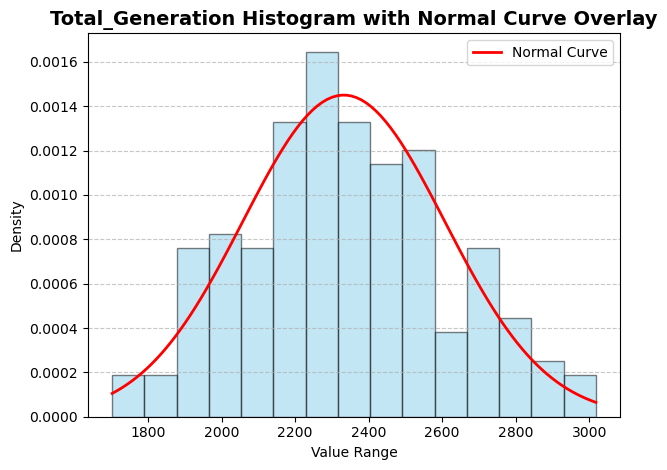

In [65]:
from scipy import stats
plt.hist(electricity_df["Total_Generation"], bins=15, density=True, color='skyblue', edgecolor='black', alpha=0.5)

    # Fit a normal distribution to the data
mu, std = stats.norm.fit(electricity_df["Total_Generation"].dropna())  # Handle NaN values if any
    
    # Create a range of x values for the normal curve
x = np.linspace(electricity_df["Total_Generation"].min(), electricity_df["Total_Generation"].max(), 100)
    
    # Create the normal distribution curve
p = stats.norm.pdf(x, mu, std)
    
    # Plot the normal curve
plt.plot(x, p, 'r-', linewidth=2, label='Normal Curve')
    
    # Add labels, title, and grid
plt.xlabel('Value Range')
plt.ylabel('Density')
plt.title(f'{feature} Histogram with Normal Curve Overlay', fontsize=14, weight="bold")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

(NormalityTest_Solutions.ipynb, Dr. Cristiani Eccher)

The above histogram shows that the Total_Generation is normally distributed.
## Next steps: Shapiro-Wilk Test

In [68]:
from scipy.stats import shapiro

stat, p_value = shapiro(electricity_df["Total_Generation"])
shapiro_results = {"Test Statistic": stat, "p-value": p_value}
if p_value < 0.05:
    print(f"p-value for {feature} is less than the significance level, so reject the null hypothesis and data shows non-normality.")
else:
    print(f"p-value for {feature} is higher than the significance level, so fail to reject the null hypothesis and data shows normality.")

shapiro_results

p-value for Total_Generation is higher than the significance level, so fail to reject the null hypothesis and data shows normality.


{'Test Statistic': 0.9921640157699585, 'p-value': 0.4411560595035553}

### Conclusion:
The Shapiro test result proved that the Total_Generation is normally distributed.
### Next Step:   Lineplot - Visualisation of the TRend in the total generation over the years


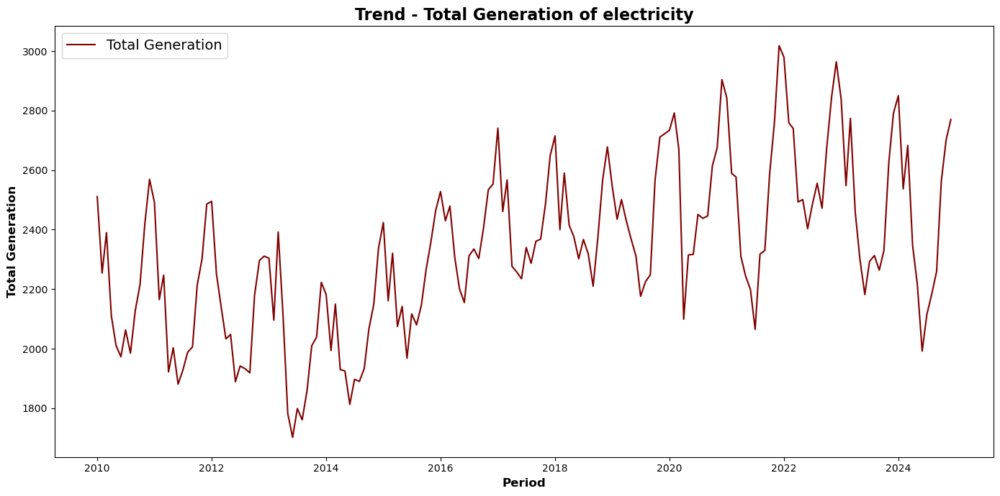

In [70]:
plt.figure(figsize=(14,7))

sns.lineplot(data=electricity_df, x="Period", y="Total_Generation", label="Total Generation", color="maroon")

plt.xlabel("Period", fontsize=12, weight="bold")
plt.ylabel("Total Generation", fontsize=12, weight="bold")
plt.title("Trend - Total Generation of electricity", fontsize=16, weight="bold")
plt.legend(fontsize=14, loc="upper left")
plt.tight_layout()
plt.show()

From the plot, it is evident that electricity generation in Ireland exhibits both a trend and seasonality over the years. The highest levels of generation were recorded in 2022, followed by 2023 and 2021, with these years showing a significantly higher range compared to earlier periods.

Overall, the trend has been increasing compared to previous years, though fluctuations exist. Since 2020, both peak and trough levels have been more pronounced, though they remain higher than earlier years. This trend may be influenced by factors such as population growth, increased energy demand, and changes in work patterns due to COVID-19, including remote and office-based work.

# Next Step: Seasonal Decomposition
Visualising the trend and the seasonality patterns with the "Trend_Generation"

In [72]:

from statsmodels.tsa.seasonal import seasonal_decompose

### Seasonal Decomposition

In [74]:
decompose_plot = seasonal_decompose(electricity_df["Total_Generation"], model="additive", period=12)

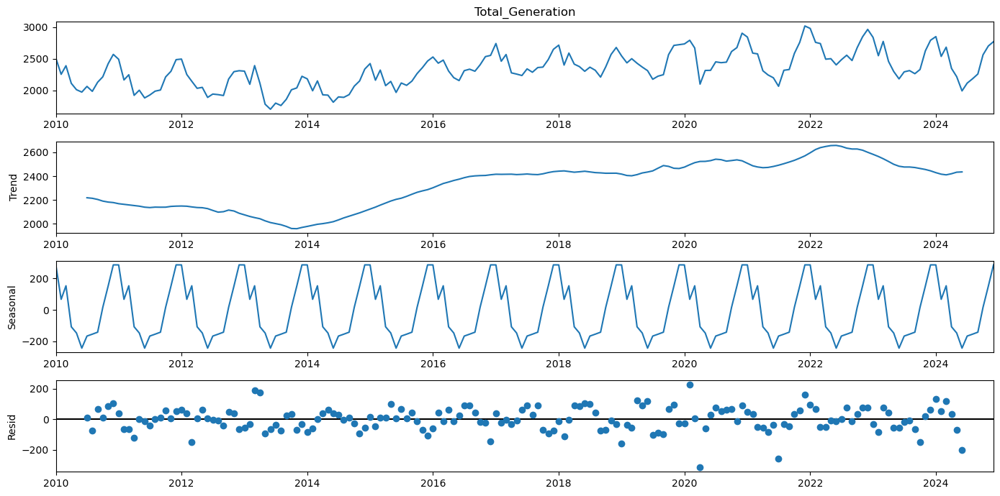

In [75]:
plt.rcParams.update({'figure.figsize': (14, 7)})  # Set global figure size

fig = decompose_plot.plot()  # This already creates a figure
fig.set_size_inches(14, 7)  # Manually adjust figure size

plt.tight_layout()  # Adjust layout
plt.show()


From the decomposition plot, it is evident that electricity generation in Ireland has followed an increasing trend since 2016, with a more pronounced rise from 2019 onwards. The period between 2022 and 2023 shows the highest levels, after which the trend appears to stabilize.

Seasonality is consistently present across all years, indicating a recurring pattern in electricity generation. The residual component mostly fluctuates around zero, suggesting that most variations are captured by the trend and seasonal components. However, a few deviations are notable: one around early 2020, another in 2021, and a third in 2024, where residuals drop close to -400.

To further analyze the residuals, their distribution, mean, variance, and correlation must be examined to determine if any underlying patterns remain.

## Next Steps: Residuals Analysis:
1. If Normally distributed (Histogram, ProbPlot)
2. Mean =0
3. Variance is constant (Homoscedasticity - Breusch Pagan Test (BP))
4. No autocorrelation (Ljungbox Test)


In [77]:
from scipy.stats import shapiro, kstest, probplot
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.diagnostic import het_breuschpagan


In [78]:
# residuals from seasonal decomposition
residuals = decompose_plot.resid.dropna()  # Drop NaNs

#### 1. Plot histogram & Q-Q Plot Residuals


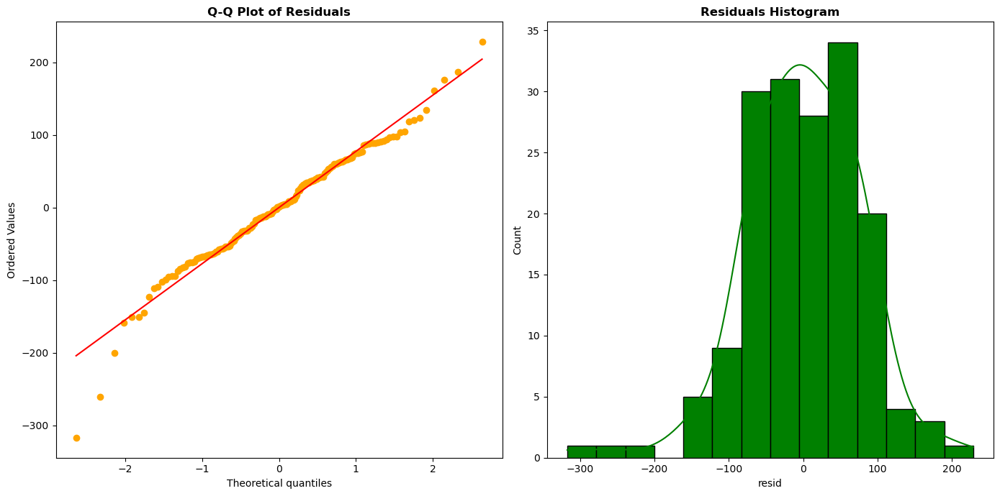

In [80]:

#  Q-Q plot
plt.subplot(1, 2, 1)
probplot(residuals, dist="norm", plot=plt)
plt.gca().get_lines()[0].set_color("orange")  # Change the color of the Q-Q plot line to green
plt.title("Q-Q Plot of Residuals", fontsize=12, weight="bold")


# Histogram
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True, color="green", alpha=1)
plt.title("Residuals Histogram", fontsize=12, weight="bold")

plt.tight_layout()
plt.show()


From the above plot, it is evident that the residuals are mostly normally distributed, with some minor deviations observed at both tails, particularly with a slightly more pronounced outlier further away from the main cluster of points. 

The histogram also reveals a mild skew caused by a single value, while the majority of the residuals follow a normal distribution. These observations suggest that while the residuals generally align with the assumption of normality, there may be a small influence of outliers that could slightly affect the overall distribution.

#### 2. Normality Tests - Residuals

In [83]:
shapiro_test = shapiro(residuals)

print(f"Shapiro-Wilk Test: p-value = {shapiro_test.pvalue}")

if shapiro_test.pvalue >0.05:
    print("p_value > 0.05, Residuals are Normally distributed")
else:
    print("p_value < 0.05, Residuals are not normally distributed")

Shapiro-Wilk Test: p-value = 0.005190124735236168
p_value < 0.05, Residuals are not normally distributed


### 3. Mean & Variance - Residuals

In [85]:

print(f"Residuals Mean: {residuals.mean()}, Residuals Variance: {residuals.var()}, Residuals Std Dev: {residuals.std()}")

Residuals Mean: 0.08060515873026983, Residuals Variance: 6028.3241901613455, Residuals Std Dev: 77.64228351975066


#### Mean of Residuals:
The mean close to zero is a good sign that the model is unbiased.
#### Variance of Residuals:
The high variance and standard deviation could indicate that there are still patterns in the data that the model is not capturing well. Further model improvements or the use of more sophisticated models could help reduce this spread and capture more of the data's variability.

### 4. Autocorrelation Check - Residuals

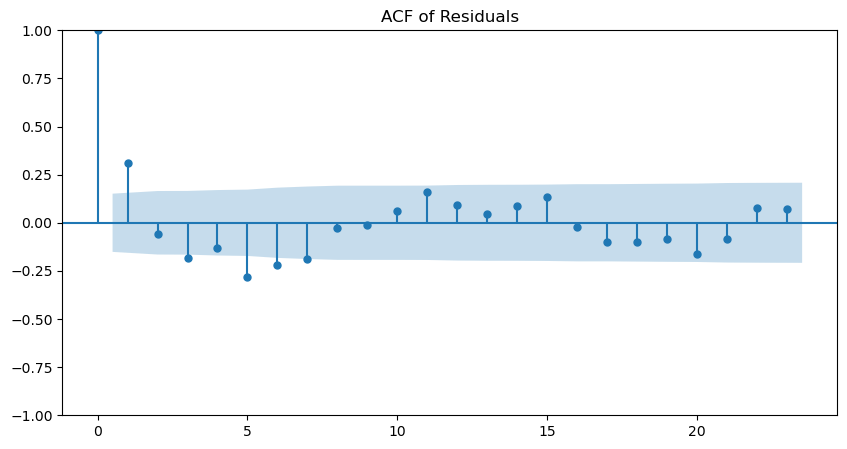

In [88]:
fig=plot_acf(residuals)
fig.set_size_inches(10,5)
plt.title("ACF of Residuals")
plt.show()

Model Misspecification: The significant autocorrelation at lag 1 and the negative autocorrelation at lag 4 and 5 suggest that there might be some residual structure in the data that current model has not captured.

Seasonality or Cyclic Behavior: The significant autocorrelation at few lags, it could indicate that the data exhibits some form of seasonality or cyclic patterns that the current model is not accounting for.

Model Refinement: These results suggest the need to refine the model further (perhaps by adding more lags, using seasonal differencing, or using other time series techniques like SARIMA) to account for these correlations.

### 5. Ljung-Box Test (White Noise Test)

##### H0: No significant Autocorrelation
##### H1: Significant Autocorrelation

In [91]:
# Perform the Ljung-Box test for residuals
ljung_box_results = acorr_ljungbox(residuals) 
ljung_box_results

,lb_stat,lb_pvalue
1,16.274805,5.478763e-05
2,16.894452,2.144946e-04
3,22.699244,4.665209e-05
4,25.627203,3.762101e-05
5,39.461521,1.917341e-07
6,47.874491,1.251847e-08
7,54.310601,2.041573e-09
8,54.443593,5.662366e-09
9,54.472858,1.534692e-08
10,55.111472,3.010204e-08


Ljung-Box Test Statistics (lb_stat): These are the test statistics for each lag. Higher values typically indicate more significant autocorrelation at that particular lag.

p-values (lb_pvalue): These values indicate whether there is significant autocorrelation at each lag. A p-value below 0.05 means that the null hypothesis (which states that there is no autocorrelation at that lag) is rejected, suggesting that there is significant autocorrelation at that lag.

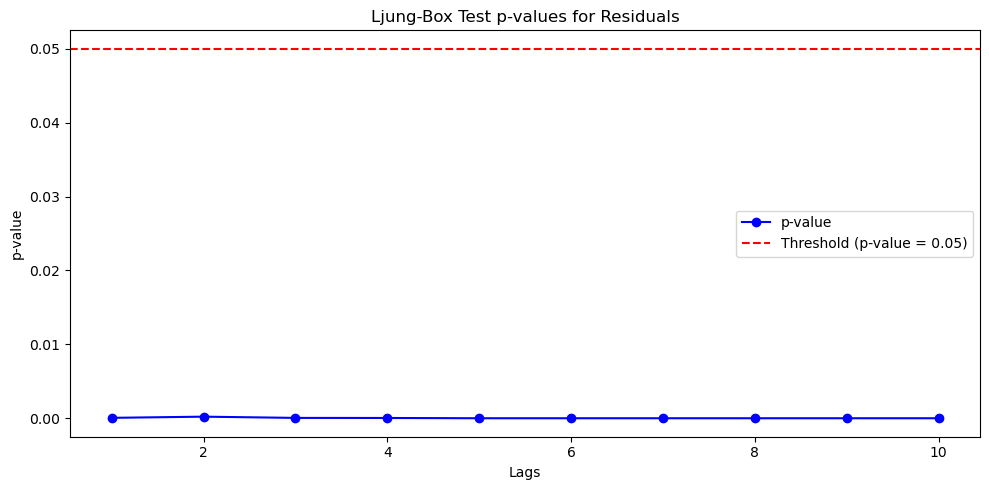

In [93]:
p_values = ljung_box_results['lb_pvalue']

# Plot the Ljung-Box test p-values for different lags
plt.figure(figsize=(10,5))
plt.plot(p_values, marker='o', linestyle='-', color='b', label='p-value')
plt.axhline(y=0.05, color='r', linestyle='--', label='Threshold (p-value = 0.05)')
plt.title('Ljung-Box Test p-values for Residuals')
plt.xlabel('Lags')
plt.ylabel('p-value')
plt.legend()
plt.tight_layout()
plt.show()

### 6. Heteroscedasticity Test - Residuals
##### Null Hypothesis (H0): The residuals have constant variance (homoscedasticity).
##### Alternative Hypothesis (H1): The residuals have non-constant variance (heteroscedasticity).

In [95]:

import statsmodels.api as sm

# Ensure residuals are in the correct format
residuals = residuals.values if hasattr(residuals, 'values') else residuals

# Use time as an explanatory variable for heteroscedasticity test
time = np.arange(len(residuals))

# Add a constant term to the predictor
exog = sm.add_constant(time)

# Perform Breusch-Pagan Test
bp_test = het_breuschpagan(residuals, exog)

# Extract and print p-value
print(f"Breusch-Pagan Test p-value: {bp_test[1]}")

Breusch-Pagan Test p-value: 0.06153096072899303


Your Breusch-Pagan Test p-value = 0.06 suggests that there is no significant heteroscedasticity in the residuals.

Since p-value > 0.05, we fail to reject the null hypothesis, which means the variance of residuals is constant (homoscedasticity).

Homoscedasticity is a good sign because it implies that the residuals of the model have a stable variance. This is an important assumption for many time series models, such as ARIMA/SARIMA, as these models assume that the variance of the residuals is constant over time.
A stable variance means that the model's errors are consistent across different time periods, which helps ensure that the model's forecasts are reliable.

### Conclusion:

Normality: The residuals does not appear to follow a mostly normal distribution. This suggests the model is not generally fitting well.

Stationarity: The autocorrelations in the residuals indicate that there is still some structure or time-dependency that hasn't been fully captured by the model. This suggests that the residuals are not yet "white noise," and further model adjustments (e.g., SARIMA or tuning p, d, or q parameters in ARIMA/SARIMA) might be needed.

Homoscedasticity: The residuals exhibit constant variance (homoscedasticity), which is a positive sign for the validity of the model. It indicates that the error variance does not change over time, which is an important assumption in time series modeling.

Model Improvement: The presence of autocorrelation in the residuals, as shown by the ACF plot and the Ljung-Box test, suggests that the current model hasn't fully captured all the time series patterns. This implies a need for model refinement. 

# Next steps:

Using advanced models such as SARIMA (which accounts for seasonality) or ARIMA / SARIMA with additional AR/MA terms.

#### Autocorrelation plot

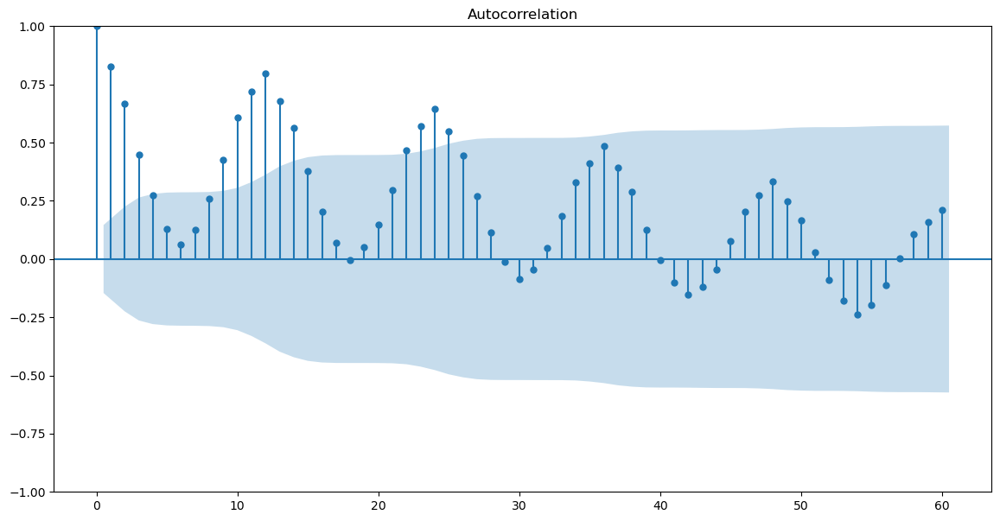

In [99]:
fig = plot_acf(electricity_df["Total_Generation"], lags=60)
fig.figsize=(6,4)
plt.show()

#### Observations from the ACF Plot:
The plot shows exponential slow decay and exhibits trend and seasonality at 12, 24 etc.. Upto lags 25, multiple lags have significant correleation with the current value. But after that, the lags are not significant
1. Exponential slow decay → Indicates that past values still influence the current values, meaning the series is non-stationary (trend present).
2. Significant spikes at lag 12, 9-14, 22, 23 → Suggests seasonality in the data, likely with a 12-month seasonal pattern (common in monthly time series).
3. Differencing is needed → To remove trend and seasonality:

First-order differencing (to remove trend) and Seasonal differencing (to remove seasonality, if required)

#### PACF Plot

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


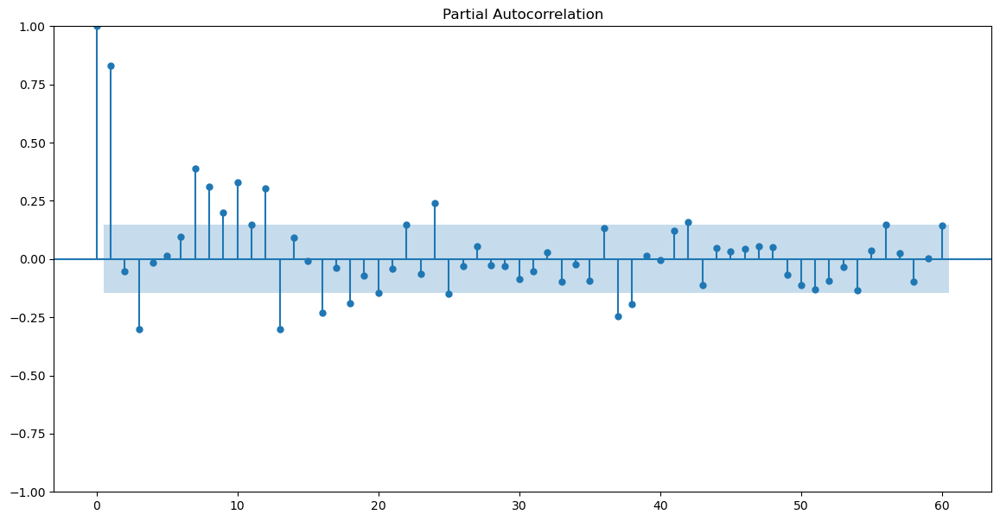

In [102]:
fig = plot_pacf(electricity_df["Total_Generation"], lags=60)
fig.figsize=(6,4)
plt.show()

Even after the removal of indirect effects, multiple lags show significant correlations. 

1️. PACF shows a significant spike at lag 1 → Suggests AR(1) (Autoregressive model of order 1).

2️. ACF shows exponential decay → Confirms that an AR process is present.

3️. PACF has significant spikes at lags 3, 7, 8, 9, 10, 12 etc. → Indicates that past values at certain lags direct influence the current value.

4️. Possible MA terms → The spikes in PACF suggest that MA(q) components might also be necessary, meaning an SARMA/ARIMA model could be a good choice.

## Next Steps: Augmented Dickey-Fuller (ADF) Test
### Hypothesis:
##### H₀ (Null Hypothesis): The Total_Generation series is not stationary (i.e., it has a unit root).
##### H₁ (Alternative Hypothesis): The Total_Generation series is stationary (i.e., it does not have a unit root).
The ADF test will help determine whether the electricity generation data is stationary or if differencing is required to achieve stationarity before proceeding with further time series modeling.

In [105]:
adf_test = adfuller(electricity_df["Total_Generation"])
if adf_test[1] > 0.05:
    print(f"The p_value is {adf_test[1]} and > 0.05, so the Total Generation series is not stationary.")
else:
    print(f"The p_value is {adf_test[1]} and < 0.05, so the Total Generation series is stationary.")

The p_value is 0.7812919480088598 and > 0.05, so the Total Generation series is not stationary.


### ADFULLER test with diff (1)

In [107]:
adf_test = adfuller(electricity_df["Total_Generation"].diff(1).dropna())
print(f"Test Statistic: {adf_test[0]}, p_value : {adf_test[1]}")
if adf_test[1] > 0.05:
    print(f"The p_value is {adf_test[1]} and > 0.05, so the Total Generation series is not stationary.")
else:
    print(f"The p_value is {adf_test[1]} and < 0.05, so the Total Generation series is stationary.")

Test Statistic: -3.120738316451296, p_value : 0.025056043331440497
The p_value is 0.025056043331440497 and < 0.05, so the Total Generation series is stationary.


## Next Step:
The Total_Generation series is stationary, which means proceeding to modeling with techniques like ARIMA or SARIMA for forecasting. Due to the present seasonality at lag 12, SARIMAX is modelled.
Since the series is already stationary after differencing once, there is no need for further differencing or transformations.

### Differencing of 1 is applied - ACF and PACF

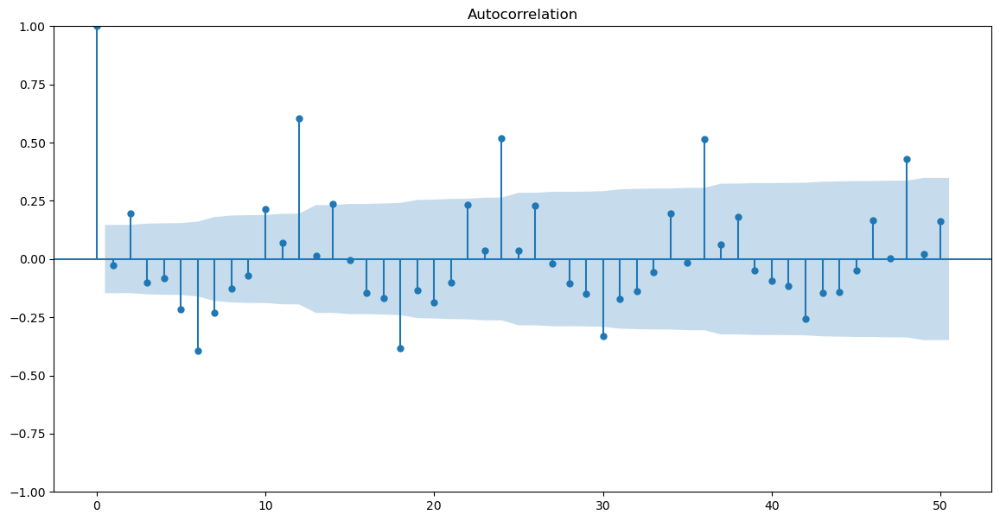

In [110]:
fig = plot_acf(electricity_df["Total_Generation"].diff(1).dropna(), lags=50)
fig.figsize=(6,4)
plt.show()

##### ACF Analysis:
1. No significant lag at 1:
This suggests that an AR(1) or MA(1) model alone may not be sufficient to describe the data.

2. Significant spikes at lags 2, 5, 6, 7, 10, 12, 18, etc.:
These multiple significant lags in ACF suggest that a moving average (MA) component is required.
The presence of significant spikes at various lags suggests an MA(q) model, where q = 2, 5, or more (because past values seem to be influencing the present values at those specific lags).  MA(2) or MA(5) components might be needed.

3. Seasonality at lag 12, 24, 36, 48:
This indicates strong seasonal patterns, meaning the time series repeats itself every 12 time periods (likely months if it's monthly data).
This confirms that seasonal differencing (D=1) should be considered in a SARIMA model.

### PACF plot with Diff(1)

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


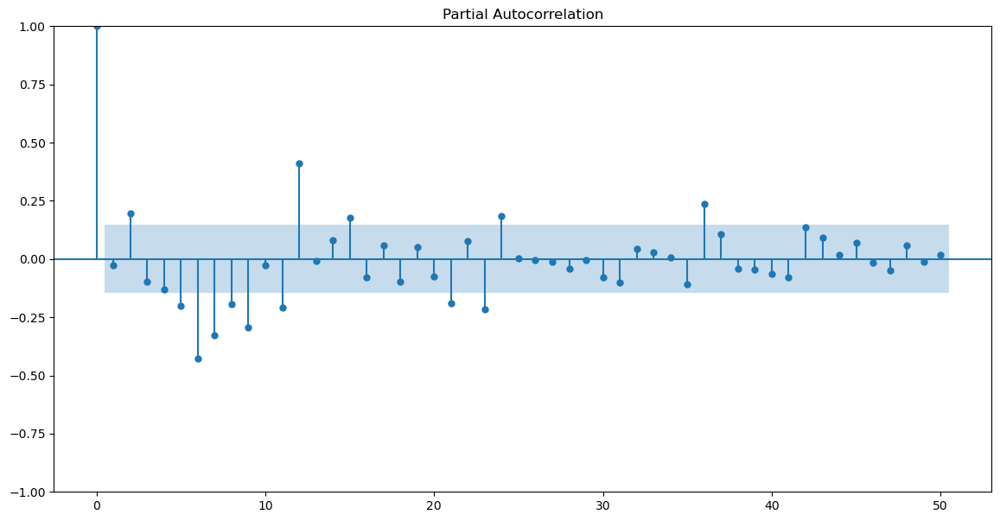

In [112]:
fig = plot_pacf(electricity_df["Total_Generation"].diff(1).dropna(), lags=50)
fig.figsize=(6,4)
plt.show()

##### PACF Analysis:
1. Lag 1 is not significant:
This is unusual for an AR(1) process but aligns with the ACF observation that the immediate past value is not a strong predictor.

2. Multiple significant spikes at 2, 5, 6, 7, 8, 9, 11, 12, 15, 21, 23, etc.:
These direct influences from past values suggest the presence of higher-order AR components.  AR(3), AR(5), AR(7) might be necessary, as past values beyond lag 1 are still directly influencing the present value even after removing intermediate effects.

3. Significant spikes at lag 12, 24, 36:
Reinforces seasonality at lag 12 (strong yearly pattern).   Since both ACF and PACF confirm seasonality, a SARIMA model (p,d,q)(P,D,Q,12) is appropriate.
#### Possible reasons are:

1. Seasonal variations in demand (e.g., winter heating) explains strong lags at 12, 24.
2. Sudden demand spikes (e.g., heavy snow, heatwaves, industrial growth) could show direct influence from previous values.
3. Unexpected spikes may be due to extreme weather events, fuel shortages, or grid disruptions.
4. Fuel availability issues or plant maintenance schedules could cause sudden drops or surges in generation.
5. Renewable energy variations (e.g., sudden drop in wind power) may create short-term dependencies.

### ADFULLER Test for seasonality: Diff(12)

In [115]:
adf_test = adfuller(electricity_df["Total_Generation"].diff(12).dropna())
print(f"Test Statistic: {adf_test[0]}, p_value : {adf_test[1]}")
if adf_test[1] > 0.05:
    print(f"Seasonality differencing. The p_value is {adf_test[1]} and > 0.05, so the Total Generation series is not stationary.")
else:
    print(f"Seasonality differencing. The p_value is {adf_test[1]} and < 0.05, so the Total Generation series is stationary.")

Test Statistic: -3.118600474326133, p_value : 0.02520694390489063
Seasonality differencing. The p_value is 0.02520694390489063 and < 0.05, so the Total Generation series is stationary.


### ACF Plots with Diff(12)

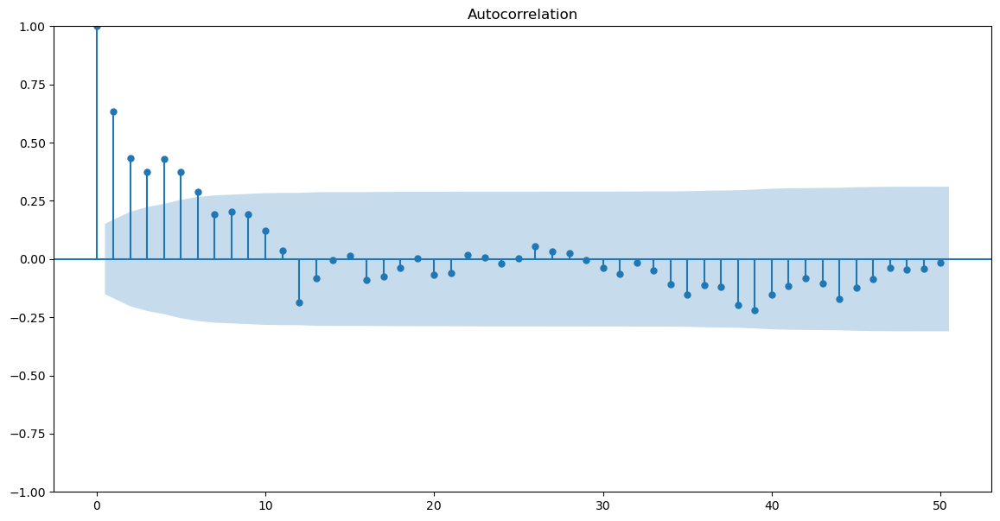

In [117]:
fig = plot_acf(electricity_df["Total_Generation"].diff(12).dropna(), lags=50)
fig.figsize=(6,4)
plt.show()

### PACF Plot with Diff(12)

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


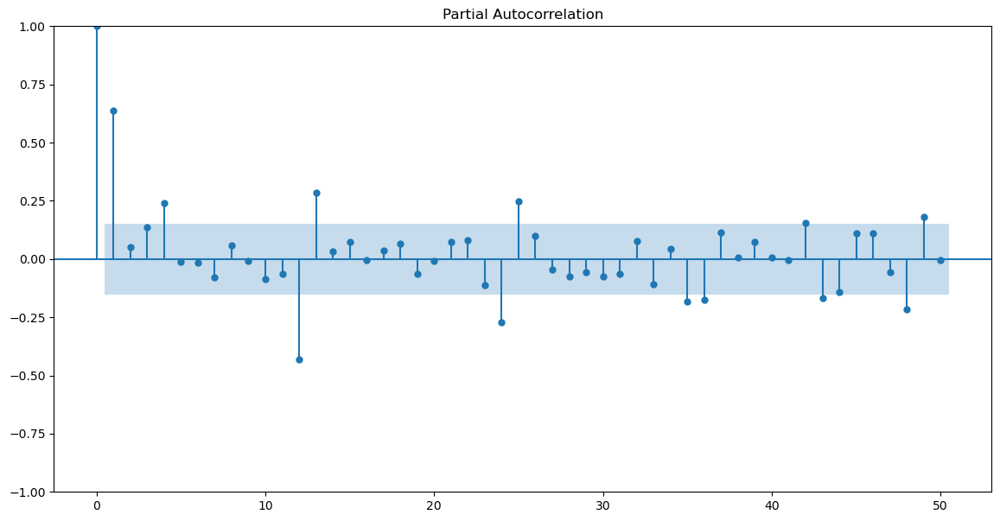

In [119]:
fig = plot_pacf(electricity_df["Total_Generation"].diff(12).dropna(), lags=50)
fig.figsize=(6,4)
plt.show()

#### Seasonality Component:
##### ACF (AutoCorrelation Function):
A slow decay in ACF suggests that the series has some long-term dependency.  Significant spikes at lag 12 suggest seasonality.
##### PACF (Partial AutoCorrelation Function):
A significant spike at lag 1 and a cut-off after that indicates that AR(1) could be a good fit. This means the current value is mainly influenced by the immediately preceding value.  The seasonal spikes at lag 12 indicate seasonality, meaning the series has a seasonal structure.

## Next Steps: Based on the ACF/PACF analysis, a SARIMA model would be more suitable due to seasonality at Lag 12.

##### Higher-order AR terms AR (p) candidates: 2, 5, 7
##### Higher-order MA terms  MA (q) candidates: 2, 5, 7
##### Seasonality (P, D, Q, 12): Since Lag 12 is significant, we need a seasonal component.

##### P = 1: Since there are significant seasonal spikes at lag 12 in the PACF and ACF, P = 1 indicates the need for one seasonal autoregressive term.
##### Q = 0 or 1: Slow decay in ACF. But ACF has significant spikes at lag 12, so can start with Q = 1 for the seasonal moving average term.
##### D = 0: Since applied seasonal differencing (diff(12)), D = 0 is appropriate. (Trying with 1)
##### s = 12: The seasonal period is 12 due to the monthly data, there is yearly seasonality.

##### SARIMA(p=2, d=1, q=2) (P=1, D=0, Q=0, 12)   Or   SARIMA(p=5, d=1, q=5) (P=1, D=1, Q=0, 12)
or (P=1, D=1, Q=1)

# Experiment 1:

In [122]:
model = SARIMAX(electricity_df["Total_Generation"], order=(2, 1, 2), seasonal_order=(1, 0, 0, 12), initialization='approximate_diffuse').fit(maxiter=200)

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


In [123]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                    Total_Generation   No. Observations:                  180
Model:             SARIMAX(2, 1, 2)x(1, 0, [], 12)   Log Likelihood               -1131.687
Date:                             Sat, 12 Apr 2025   AIC                           2275.375
Time:                                     16:46:20   BIC                           2294.532
Sample:                                 01-01-2010   HQIC                          2283.142
                                      - 12-01-2024                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9751      0.411      2.370      0.018       0.169       1.781
ar.L2         -0.1629      0.289     -0.564      0.573      -0.729       0.403
ma.L1         -1.3419      0.551     -2.435      0.015      -2.422      -0.262
ma.L2          0.3423      0.445      0.769      0.442      -0.530       1.214
ar.S.L12       0.7353      0.065     11.262      0.000       0.607       0.863
sigma2        1.2e+04   3209.410      3.739      0.000    5710.474    1.83e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):                52.31
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):               1.95   Skew:                            -0.51
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

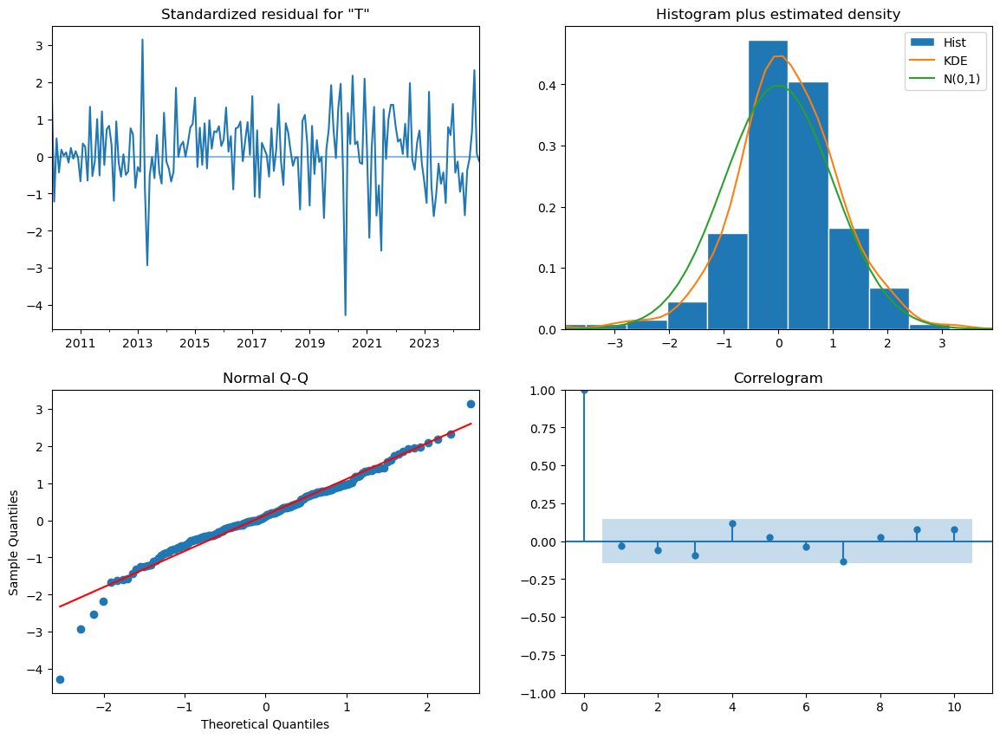

In [124]:
model.plot_diagnostics(figsize=(14,10));

In [125]:
forecast_vals = model.get_forecast(steps=24)
forecast_ci = forecast_vals.conf_int()

forecast_vals = model.get_forecast(steps=24)
forecast_ci = forecast_vals.conf_int()

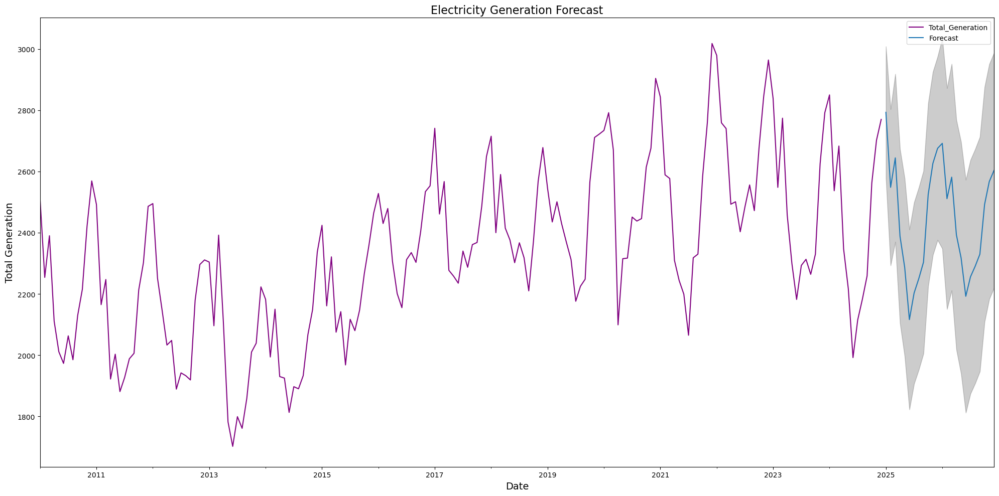

In [126]:
ax = electricity_df["Total_Generation"].plot(color="purple", figsize=(20, 10))

# Plot the forecast values
forecast_vals.predicted_mean.plot(ax=ax, label="Forecast")

# Add confidence intervals for the forecast
ax.fill_between(
    forecast_ci.index,
    forecast_ci.iloc[:, 0],
    forecast_ci.iloc[:, 1],
    color='k', alpha=0.2
)

# Add labels and title
ax.set_title('Electricity Generation Forecast', fontsize=16)
ax.set_xlabel('Date', fontsize=14)
ax.set_ylabel('Total Generation', fontsize=14)
ax.legend()

# Adjust layout and display
plt.tight_layout()
plt.show()


# Training and Testing Split - 90:10

In [128]:
### 80:20 of the data is split between train and test
split = int(electricity_df.shape[0]*.90)
split

162

In [129]:
### defining the train and test
train = electricity_df.iloc[:split]
test = electricity_df.iloc[split:]

In [130]:
### Number (rows) of training data
train.shape

(162, 12)

In [131]:
### Number (rows) of test data
test.shape

(18, 12)

In [132]:
train

,Unit,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind,Total_Generation
Period,,,,,,,,,,,,
2010-01-01,GWh,400,0,97,1474,77,20,195,0,0,248,2511
2010-02-01,GWh,407,0,60,1395,29,22,190,0,0,151,2254
2010-03-01,GWh,308,0,29,1592,16,22,172,0,0,251,2390
2010-04-01,GWh,233,0,74,1368,14,23,213,0,0,186,2111
2010-05-01,GWh,272,0,13,1354,7,19,177,0,0,169,2011
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-01,GWh,81,13,55,1155,50,1,40,9,38,1106,2548
2023-03-01,GWh,126,14,82,1293,16,1,57,15,47,1123,2774
2023-04-01,GWh,89,14,86,1201,1,1,51,34,47,934,2458


In [133]:
test

,Unit,Coal,Combust__Renew_,Hydro,Natural_Gas,Oil,Other,Peat___BM,Solar_Farms,Wastes,Wind,Total_Generation
Period,,,,,,,,,,,,
2023-07-01,GWh,86,14,60,1159,0,1,0,59,37,877,2293
2023-08-01,GWh,76,13,89,1134,0,1,0,55,57,888,2313
2023-09-01,GWh,120,13,55,1119,0,1,8,42,53,853,2264
2023-10-01,GWh,93,14,101,1132,21,1,40,34,57,837,2330
2023-11-01,GWh,106,14,115,1133,11,1,39,20,49,1137,2625
2023-12-01,GWh,111,14,122,903,5,1,32,10,57,1537,2792
2024-01-01,GWh,99,13,132,1323,28,1,39,17,56,1142,2850
2024-02-01,GWh,86,12,114,992,11,1,54,20,50,1197,2537
2024-03-01,GWh,87,14,117,1020,6,1,49,35,23,1331,2683


## Experiment 2

In [135]:
model_2 = SARIMAX(train["Total_Generation"], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


In [136]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Total_Generation   No. Observations:                  162
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -890.935
Date:                            Sat, 12 Apr 2025   AIC                           1791.870
Time:                                    16:46:25   BIC                           1806.889
Sample:                                01-01-2010   HQIC                          1797.972
                                     - 06-01-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4192      0.139      3.009      0.003       0.146       0.692
ma.L1         -0.7950      0.103     -7.749      0.000      -0.996      -0.594
ar.S.L12       0.0545      0.129      0.423      0.672      -0.198       0.307
ma.S.L12      -0.9991     17.876     -0.056      0.955     -36.035      34.037
sigma2      7488.8591   1.33e+05      0.056      0.955   -2.54e+05    2.69e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                30.08
Prob(Q):                              0.85   Prob(JB):                         0.00
Heteroskedasticity (H):               2.00   Skew:                            -0.51
Prob(H) (two-sided):                  0.02   Kurtosis:                         4.95
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

#### Diagnosis - Results:
1. From the above summary, it can be seen that the AR(1) and MA(1) are statistically significant. 
2. AR(1) and MA(1) for Seasonal is not statistically significant.
3. The Sigma is very high(7489)
4. Ljung-Box - No autoCorrelation
5. Jarque-bera - Residuals are not normally distributed
6. Kurtosis - Mild kurtosis present
7. Herterskedasticity - Change in variance is statistically significant

So, in the next experiment:
1. Seasonal AR and MA are dropped to 0.  (model = SARIMAX(train["Total_Generation"], order=(1,1,1), seasonal_order=(0,0,0,12))
2. High Sigma and the Heteroscedasticity - So, logarithamic transformations are applied (train["Total_Generation_log"] = np.log1p(train["Total_Generation"])
3. Testing Different Differencing Levels: (model = SARIMAX(train["Total_Generation"], order=(1,2,1), seasonal_order=(0,0,0,12)).fit())
4. Try a Different Seasonal Periodicity - (model = SARIMAX(train["Total_Generation"], order=(1,1,1), seasonal_order=(1,1,1,6)).fit()
)
 


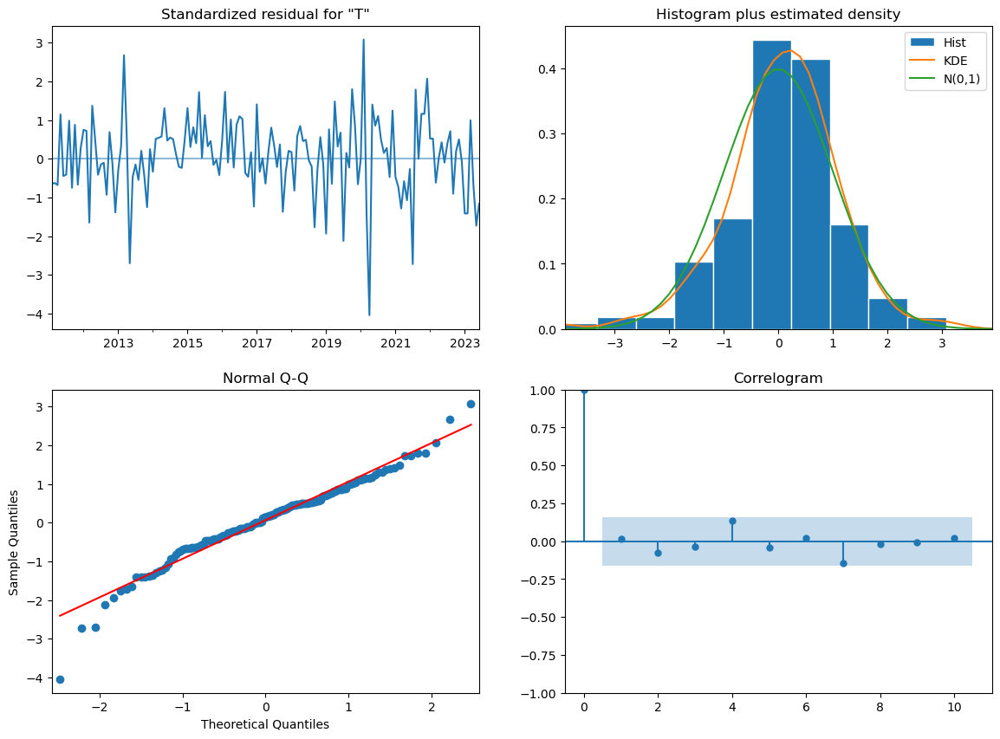

In [138]:
model_2.plot_diagnostics(figsize=(14,10));

In [139]:
forecast_values = model_2.get_forecast(steps=test.shape[0])

In [140]:
forecast_values.predicted_mean

2023-07-01    2311.126817
2023-08-01    2355.685458
2023-09-01    2381.104659
2023-10-01    2554.707463
2023-11-01    2683.934230
2023-12-01    2816.847428
2024-01-01    2807.675292
2024-02-01    2589.355941
2024-03-01    2683.846764
2024-04-01    2425.168797
2024-05-01    2382.336887
2024-06-01    2298.843978
2024-07-01    2368.306047
2024-08-01    2385.257423
2024-09-01    2405.690990
2024-10-01    2573.048482
2024-11-01    2698.129947
2024-12-01    2831.049074
Freq: MS, Name: predicted_mean, dtype: float64

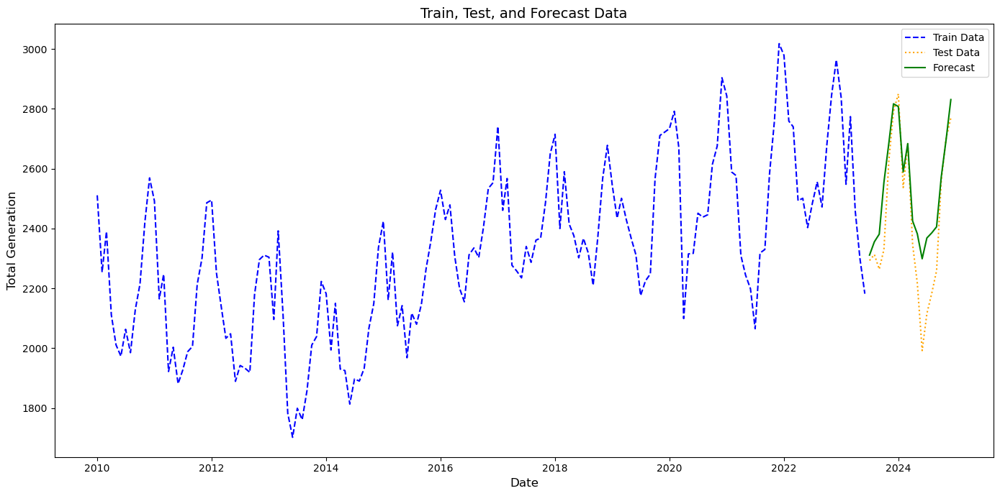

In [141]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

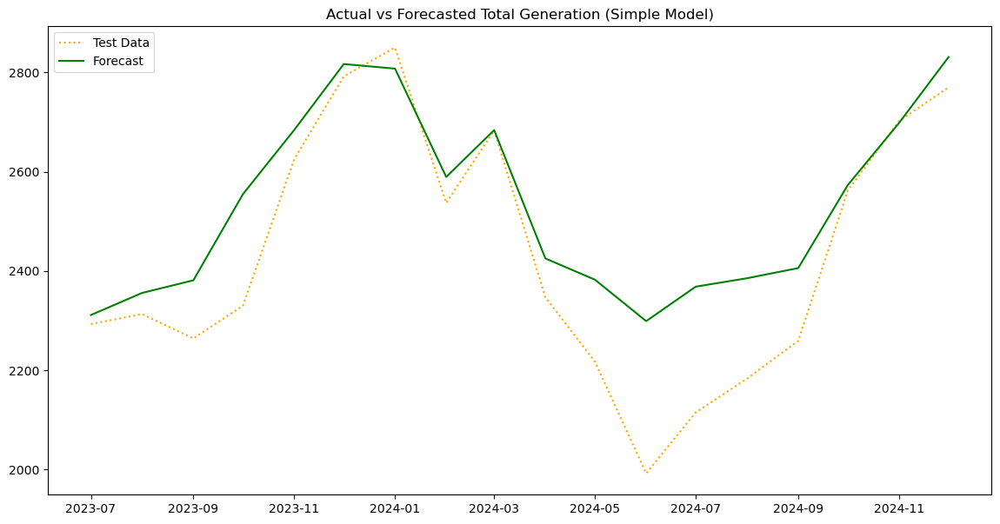

In [142]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

(NormalityTest_Solutions.ipynb, Dr. Cristiani Eccher)

### Results:

In [145]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
 
r2_score=r2_score(test["Total_Generation"], forecast_values.predicted_mean)
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.71
Mean Absolute Error (MAE): 100.58
Mean Squared Error (MSE): 18501.98
Root Mean Squared Error (RMSE): 136.02
Mean Absolute Percentage Error (MAPE): 4.49%


## Experiment 3   -    Seasonal AR and MA are dropped to 0. ) )

In [147]:
model_3 = SARIMAX(train["Total_Generation"], order=(1,1,1), seasonal_order=(0,0,0,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [148]:
model_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       Total_Generation   No. Observations:                  162
Model:               SARIMAX(1, 1, 1)   Log Likelihood               -1036.495
Date:                Sat, 12 Apr 2025   AIC                           2078.991
Time:                        16:46:29   BIC                           2088.235
Sample:                    01-01-2010   HQIC                          2082.744
                         - 06-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9993      0.003   -357.428      0.000      -1.005      -0.994
ma.L1          0.9896      0.023     43.441      0.000       0.945       1.034
sigma2       2.27e+04   2496.738      9.091      0.000    1.78e+04    2.76e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):                 1.73
Prob(Q):                              0.76   Prob(JB):                         0.42
Heteroskedasticity (H):               1.33   Skew:                            -0.24
Prob(H) (two-sided):                  0.29   Kurtosis:                         3.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

#### Diagnostics
1. AR(1) AND MA(1) are statistically significant
2. Lkung-Box - No autocorrelation
3. Jarque-Bera - Residuals shows normality
4. Heteroskedasticity - Constant variance
5. Kurtosis - High
6. Variance - very high

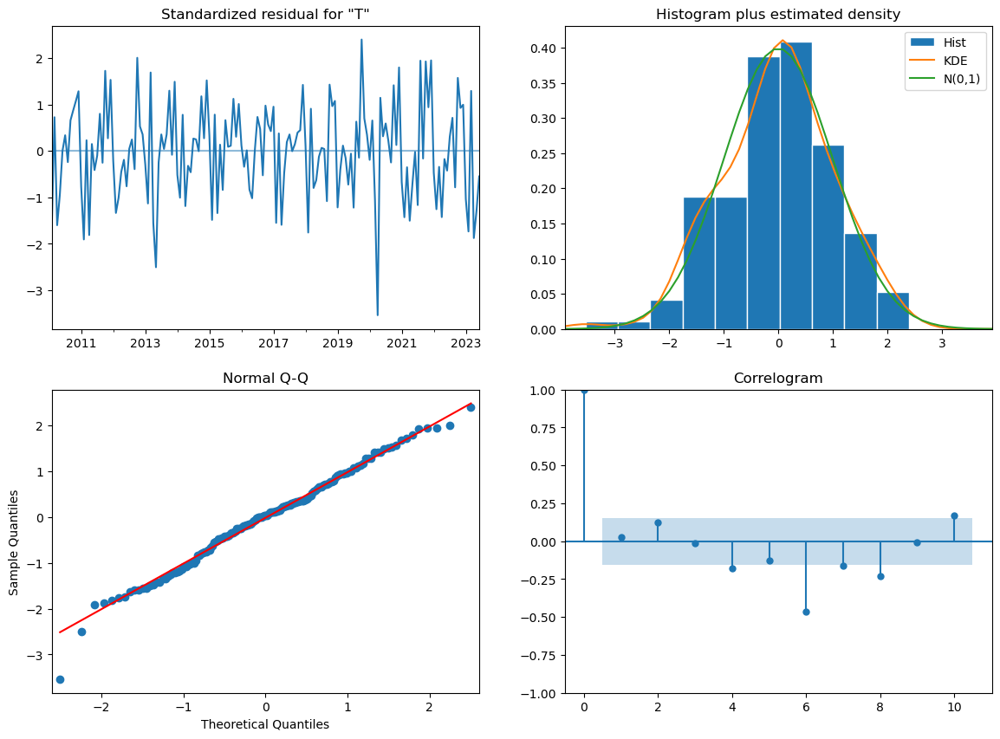

In [150]:
model_3.plot_diagnostics(figsize=(14,10));

In [151]:
forecast_values = model_3.get_forecast(steps=test.shape[0])

In [152]:
forecast_values.predicted_mean

2023-07-01    2216.995113
2023-08-01    2182.023470
2023-09-01    2216.971658
2023-10-01    2182.046909
2023-11-01    2216.948235
2023-12-01    2182.070316
2024-01-01    2216.924844
2024-02-01    2182.093692
2024-03-01    2216.901484
2024-04-01    2182.117036
2024-05-01    2216.878155
2024-06-01    2182.140349
2024-07-01    2216.854857
2024-08-01    2182.163631
2024-09-01    2216.831591
2024-10-01    2182.186882
2024-11-01    2216.808356
2024-12-01    2182.210102
Freq: MS, Name: predicted_mean, dtype: float64

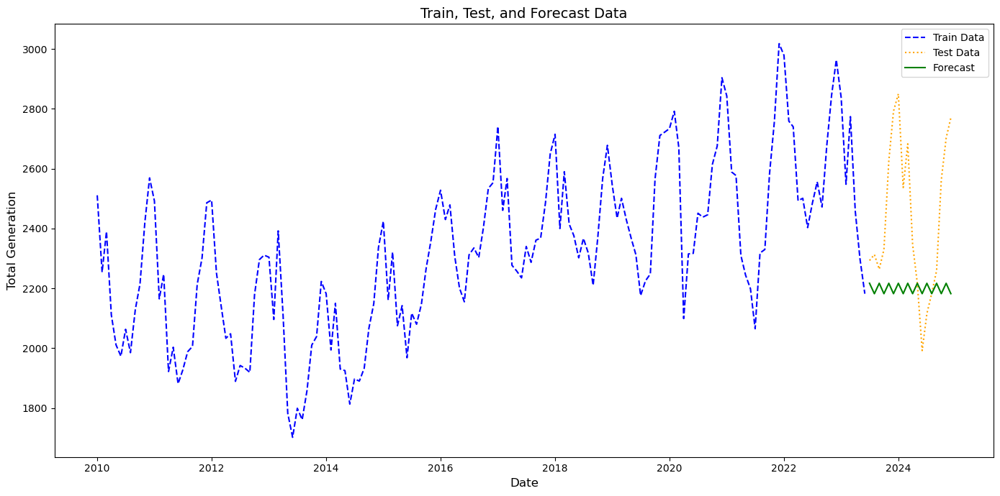

In [153]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

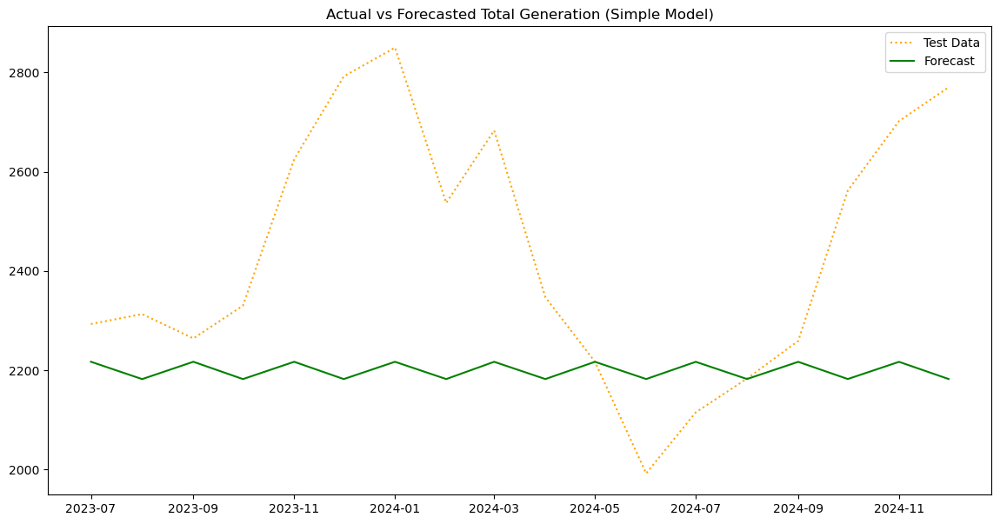

In [154]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [155]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
 
r2_score=r2_score(test["Total_Generation"], forecast_values.predicted_mean)
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: -0.88
Mean Absolute Error (MAE): 268.16
Mean Squared Error (MSE): 118344.63
Root Mean Squared Error (RMSE): 344.01
Mean Absolute Percentage Error (MAPE): 10.31%


### Conclusion - 
New parameters are tried again. Though the residuals show no autocorrelation, normality, constant variance, but the Sigma is high so the results are showing high prediction errors.
When the seasonal parameters and seasonal differencing is 0, the model struggles to understand the seasonality present and results in high errors.

Trying with different differencing:

# Experment 4

In [158]:
model_4 = SARIMAX(train["Total_Generation"], order=(1,2,1), seasonal_order=(0,0,0,12)).fit()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [159]:
model_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       Total_Generation   No. Observations:                  162
Model:               SARIMAX(1, 2, 1)   Log Likelihood               -1037.006
Date:                Sat, 12 Apr 2025   AIC                           2080.012
Time:                        16:46:34   BIC                           2089.237
Sample:                    01-01-2010   HQIC                          2083.758
                         - 06-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0488      0.082     -0.593      0.553      -0.210       0.112
ma.L1         -0.9999      4.390     -0.228      0.820      -9.603       7.603
sigma2      2.432e+04   1.07e+05      0.226      0.821   -1.86e+05    2.35e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                10.38
Prob(Q):                              0.85   Prob(JB):                         0.01
Heteroskedasticity (H):               1.22   Skew:                            -0.61
Prob(H) (two-sided):                  0.48   Kurtosis:                         3.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

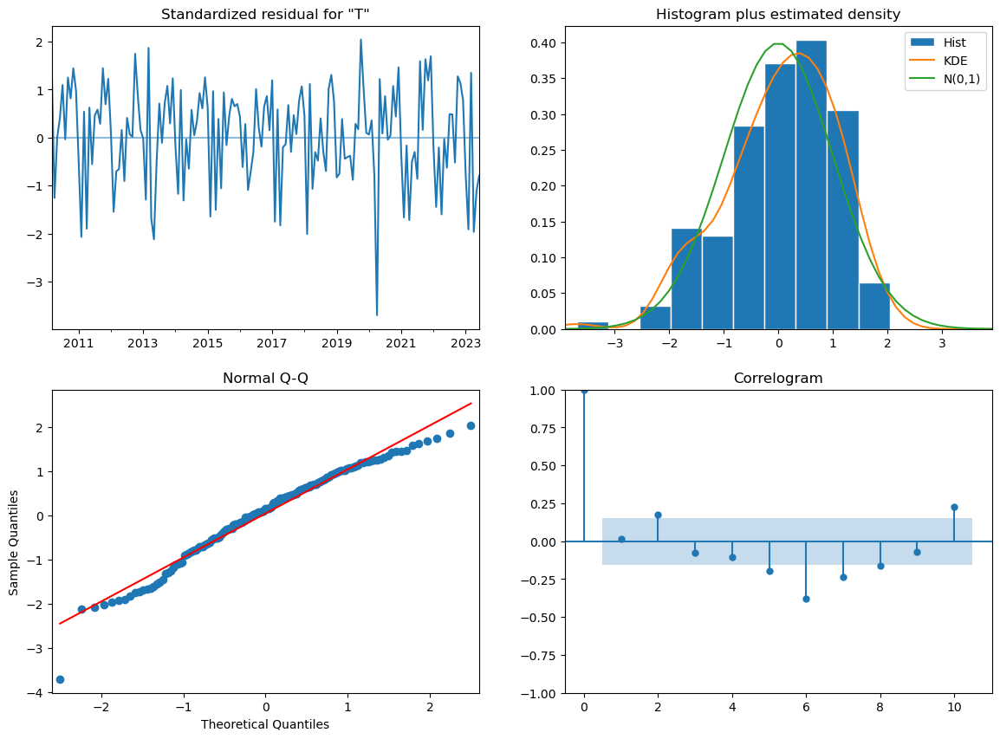

In [160]:
model_4.plot_diagnostics(figsize=(14,10));

In [161]:
forecast_values = model_4.get_forecast(steps=test.shape[0])

In [162]:
forecast_values.predicted_mean

2023-07-01    2186.042433
2023-08-01    2184.183710
2023-09-01    2182.612684
2023-10-01    2181.027633
2023-11-01    2179.443265
2023-12-01    2177.858864
2024-01-01    2176.274464
2024-02-01    2174.690065
2024-03-01    2173.105665
2024-04-01    2171.521266
2024-05-01    2169.936866
2024-06-01    2168.352467
2024-07-01    2166.768067
2024-08-01    2165.183667
2024-09-01    2163.599268
2024-10-01    2162.014868
2024-11-01    2160.430469
2024-12-01    2158.846069
Freq: MS, Name: predicted_mean, dtype: float64

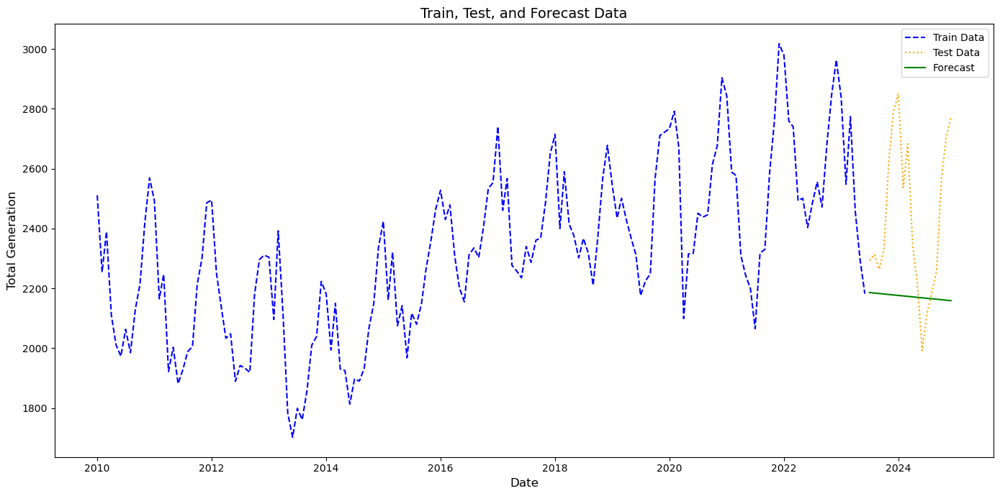

In [163]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

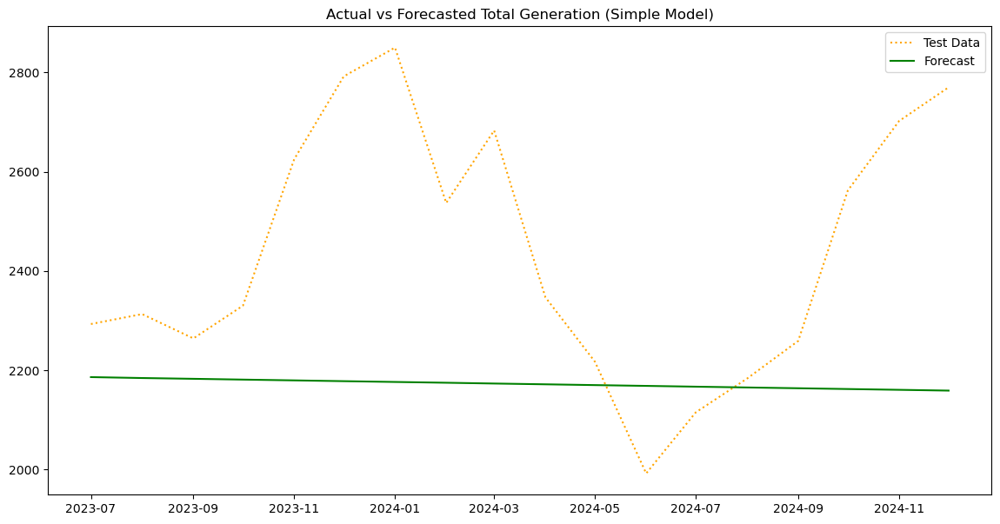

In [164]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [165]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
 
r2_score=r2_score(test["Total_Generation"], forecast_values.predicted_mean)
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: -1.10
Mean Absolute Error (MAE): 288.24
Mean Squared Error (MSE): 132261.59
Root Mean Squared Error (RMSE): 363.68
Mean Absolute Percentage Error (MAPE): 11.10%


#### Model Diagnosis:
After the differencing was introduced, 
1. the AR(1) AND MA(1) and not significant. This means differencing may have removed too much signal from the data, making AR and MA ineffective.
2. There is no autocorrelation, but the plot shows few significant spikes. 
3. The residuals shows non-normality. 
4. Kurtosis is high
5. Heteroscedasticity - Variance is constant
6. Sigma is very high

# Experiment 5:
Trying a Different Seasonal Periodicity 

In [168]:
model_5 = SARIMAX(train["Total_Generation"], order=(1,1,1), seasonal_order=(1,1,1,6)).fit()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [169]:
model_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                  Total_Generation   No. Observations:                  162
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 6)   Log Likelihood                -963.772
Date:                           Sat, 12 Apr 2025   AIC                           1937.545
Time:                                   16:46:38   BIC                           1952.762
Sample:                               01-01-2010   HQIC                          1943.726
                                    - 06-01-2023                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5775      0.071      8.106      0.000       0.438       0.717
ma.L1         -0.9999      2.464     -0.406      0.685      -5.829       3.829
ar.S.L6       -0.9602      0.031    -31.461      0.000      -1.020      -0.900
ma.S.L6        0.3819      0.092      4.169      0.000       0.202       0.561
sigma2      1.332e+04    3.3e+04      0.403      0.687   -5.14e+04    7.81e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                43.31
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               1.89   Skew:                            -0.58
Prob(H) (two-sided):                  0.02   Kurtosis:                         5.32
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

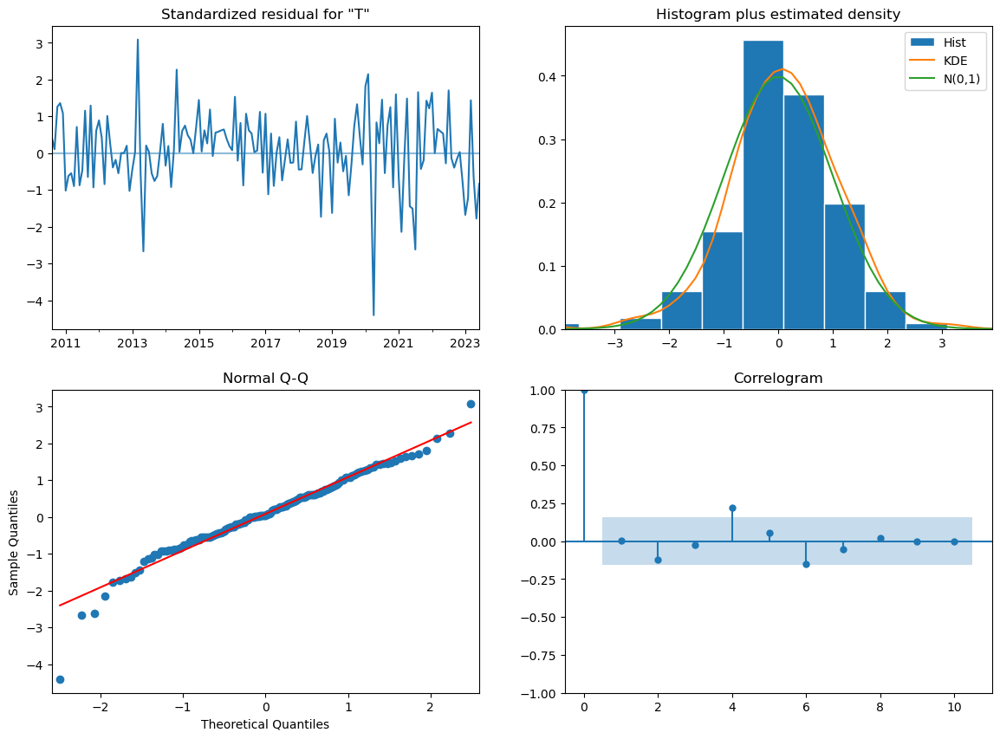

In [170]:
model_5.plot_diagnostics(figsize=(14,10));

In [171]:
forecast_values = model_5.get_forecast(steps=test.shape[0])

In [172]:
forecast_values.predicted_mean

2023-07-01    2294.418532
2023-08-01    2394.887407
2023-09-01    2464.958688
2023-10-01    2638.305730
2023-11-01    2739.242308
2023-12-01    2856.705355
2024-01-01    2782.029609
2024-02-01    2531.736053
2024-03-01    2765.473269
2024-04-01    2477.018474
2024-05-01    2333.022891
2024-06-01    2228.047427
2024-07-01    2334.564867
2024-08-01    2421.958359
2024-09-01    2499.065682
2024-10-01    2654.317647
2024-11-01    2745.670951
2024-12-01    2854.373783
Freq: MS, Name: predicted_mean, dtype: float64

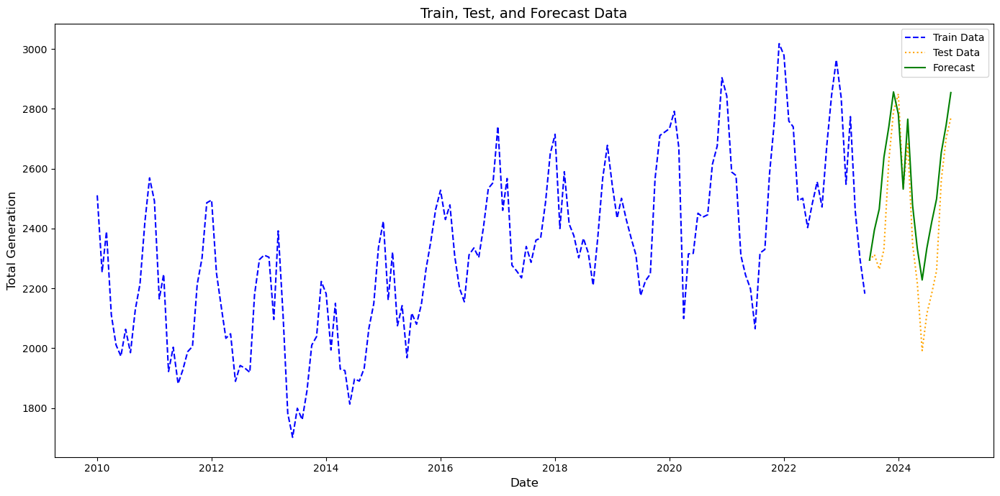

In [173]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

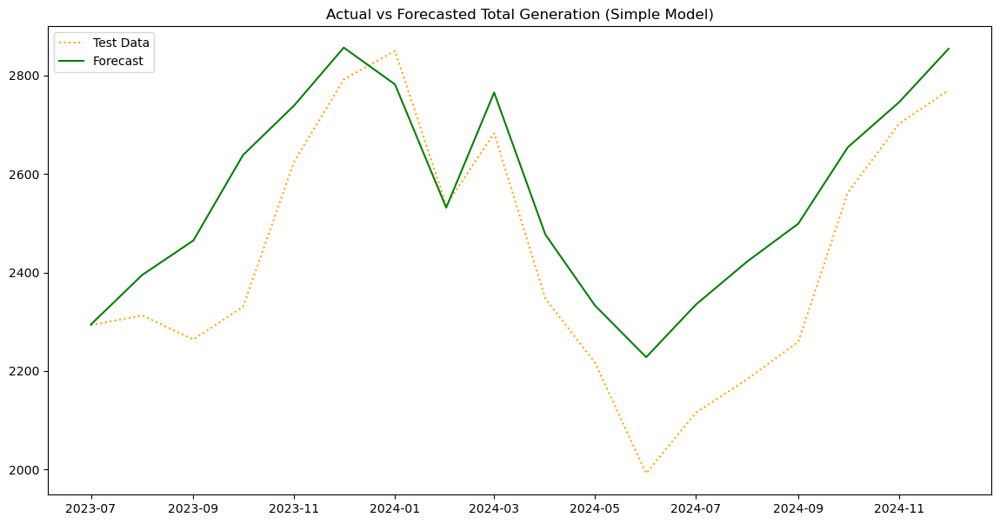

In [174]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [175]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
 
r2_score=r2_score(test["Total_Generation"], forecast_values.predicted_mean)
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.61
Mean Absolute Error (MAE): 129.35
Mean Squared Error (MSE): 24300.36
Root Mean Squared Error (RMSE): 155.89
Mean Absolute Percentage Error (MAPE): 5.60%


## Conclusion: 
After the period is changed to 6, 
1. The AR(1) is significant and MA(1) is no more significant
2. AR(1) and MA(1) for SEasonal are both significant
3. Sigma is very high
4. No autocorrelation
5. No Normality of residuals
6. High Kurtosis
7. Variance is not constant
8. AIC	1937.545
9. RMSE and r2_score has improved.

# Experiment 6:
1. Trying to Difference = 2 in Seasonality to reduce the variance.2. 
Remove the MA(2 Seasonal)

In [178]:
model_6 = SARIMAX(train["Total_Generation"], order=(1,2,0), seasonal_order=(1,1,0,6)).fit()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [179]:
model_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                  Total_Generation   No. Observations:                  162
Model:             SARIMAX(1, 2, 0)x(1, 1, 0, 6)   Log Likelihood               -1013.191
Date:                           Sat, 12 Apr 2025   AIC                           2032.383
Time:                                   16:46:42   BIC                           2041.494
Sample:                               01-01-2010   HQIC                          2036.084
                                    - 06-01-2023                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5190      0.050    -10.449      0.000      -0.616      -0.422
ar.S.L6       -0.8027      0.053    -15.073      0.000      -0.907      -0.698
sigma2      2.914e+04   2608.358     11.173      0.000     2.4e+04    3.43e+04
===================================================================================
Ljung-Box (L1) (Q):                   5.33   Jarque-Bera (JB):                11.43
Prob(Q):                              0.02   Prob(JB):                         0.00
Heteroskedasticity (H):               1.55   Skew:                             0.12
Prob(H) (two-sided):                  0.12   Kurtosis:                         4.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

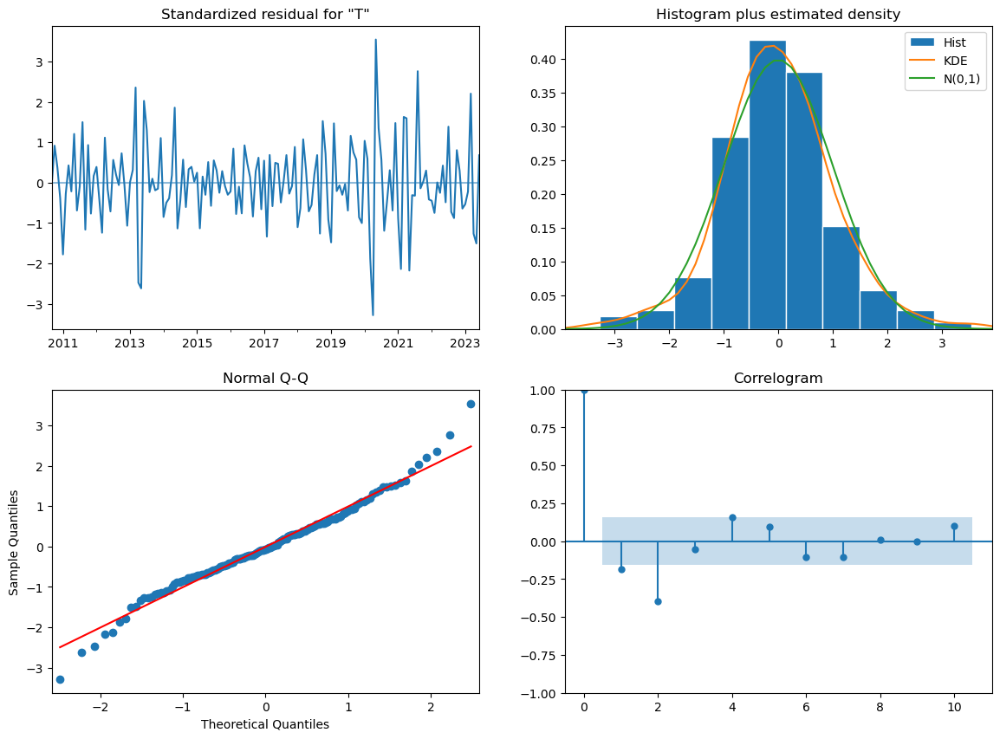

In [180]:
model_6.plot_diagnostics(figsize=(14,10));

In [181]:
forecast_values = model_6.get_forecast(steps=test.shape[0])

In [182]:
forecast_values.predicted_mean

2023-07-01    2089.254001
2023-08-01    1993.916054
2023-09-01    1855.978937
2023-10-01    1852.229493
2023-11-01    1846.997285
2023-12-01    1810.996854
2024-01-01    1582.535677
2024-02-01    1222.646441
2024-03-01    1268.158995
2024-04-01     905.291939
2024-05-01     668.051943
2024-06-01     458.505721
2024-07-01     230.424019
2024-08-01     -25.657517
2024-09-01    -235.945769
2024-10-01    -419.102203
2024-11-01    -578.661999
2024-12-01    -757.453242
Freq: MS, Name: predicted_mean, dtype: float64

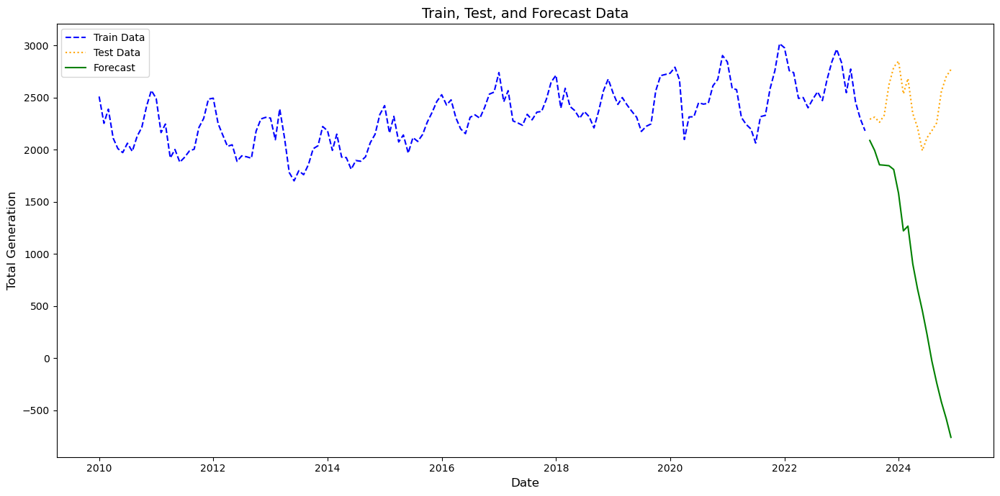

In [183]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

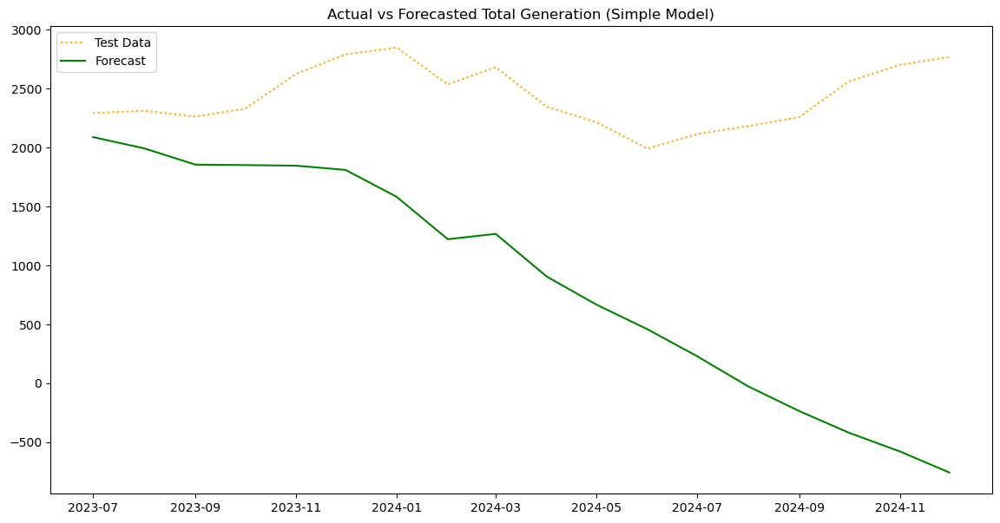

In [184]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [185]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
 
r2_score=r2_score(test["Total_Generation"], forecast_values.predicted_mean)
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: -52.95
Mean Absolute Error (MAE): 1559.21
Mean Squared Error (MSE): 3389891.68
Root Mean Squared Error (RMSE): 1841.17
Mean Absolute Percentage Error (MAPE): 63.84%


### Conclusion: Diagnostics
1. Whenever the Differencing is increased from 1 to 2 or 3, 
2. the prediction errors are very high. The variance is very high.
3. From the Summary, it can be seen that the AR(1) AND AR(1) Seasonal are both significant, butthe Sigma is very high.
4. No autocorrelation (Ljung-Box), though the residual plot shows few significant spikes.
5. No normality (JB Test)
6. High kurtosis
7. Heteriscedasticity - No constant variance
8. High rmse and r2_score errors.

## Experiment 7

In [188]:
model_7 = SARIMAX(train["Total_Generation"], order=(2,1,0), seasonal_order=(1,1,1,6)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [189]:
model_7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                    Total_Generation   No. Observations:                  162
Model:             SARIMAX(2, 1, 0)x(1, 1, [1], 6)   Log Likelihood                -969.246
Date:                             Sat, 12 Apr 2025   AIC                           1948.493
Time:                                     16:46:46   BIC                           1963.710
Sample:                                 01-01-2010   HQIC                          1954.673
                                      - 06-01-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2596      0.104     -2.491      0.013      -0.464      -0.055
ar.L2         -0.1115      0.079     -1.414      0.157      -0.266       0.043
ar.S.L6       -0.7551      0.065    -11.569      0.000      -0.883      -0.627
ma.S.L6       -0.6332      0.071     -8.917      0.000      -0.772      -0.494
sigma2      1.608e+04   1911.648      8.410      0.000    1.23e+04    1.98e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 8.46
Prob(Q):                              0.83   Prob(JB):                         0.01
Heteroskedasticity (H):               1.48   Skew:                            -0.38
Prob(H) (two-sided):                  0.16   Kurtosis:                         3.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

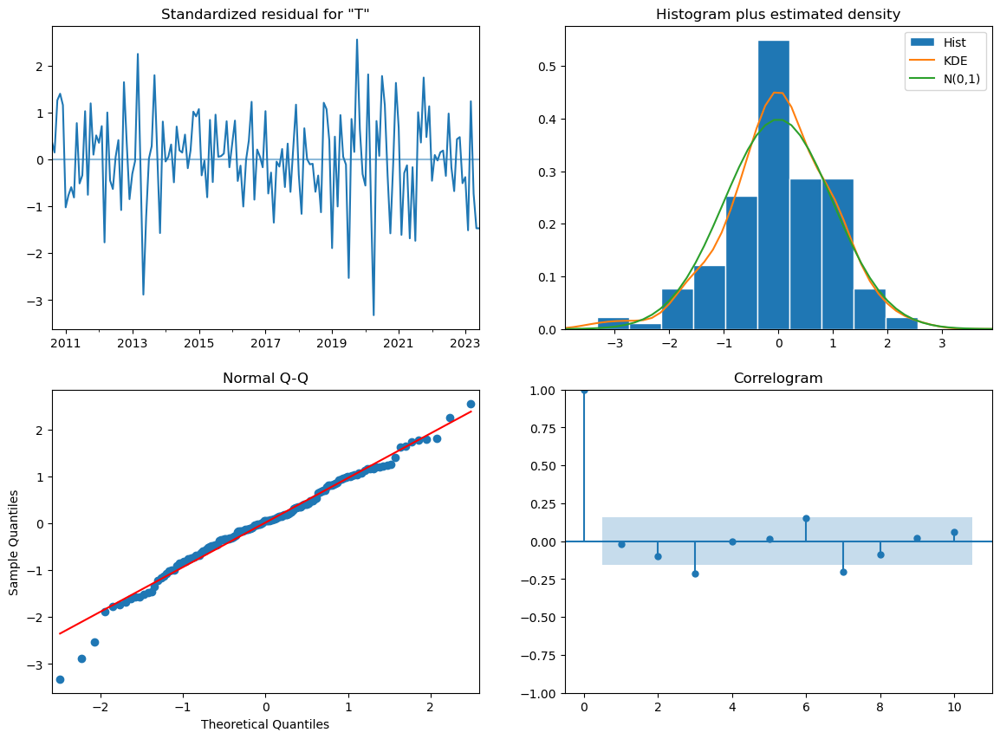

In [190]:
model_7.plot_diagnostics(figsize=(14,10));

In [191]:
forecast_values = model_7.get_forecast(steps=test.shape[0])

In [192]:
forecast_values.predicted_mean

2023-07-01    2284.423264
2023-08-01    2378.504560
2023-09-01    2234.355778
2023-10-01    2392.899021
2023-11-01    2594.166205
2023-12-01    2734.497839
2024-01-01    2631.230698
2024-02-01    2435.003869
2024-03-01    2574.133062
2024-04-01    2373.398242
2024-05-01    2302.451289
2024-06-01    2248.621939
2024-07-01    2300.652717
2024-08-01    2323.626997
2024-09-01    2248.857090
2024-10-01    2319.414537
2024-11-01    2454.017010
2024-12-01    2546.799559
Freq: MS, Name: predicted_mean, dtype: float64

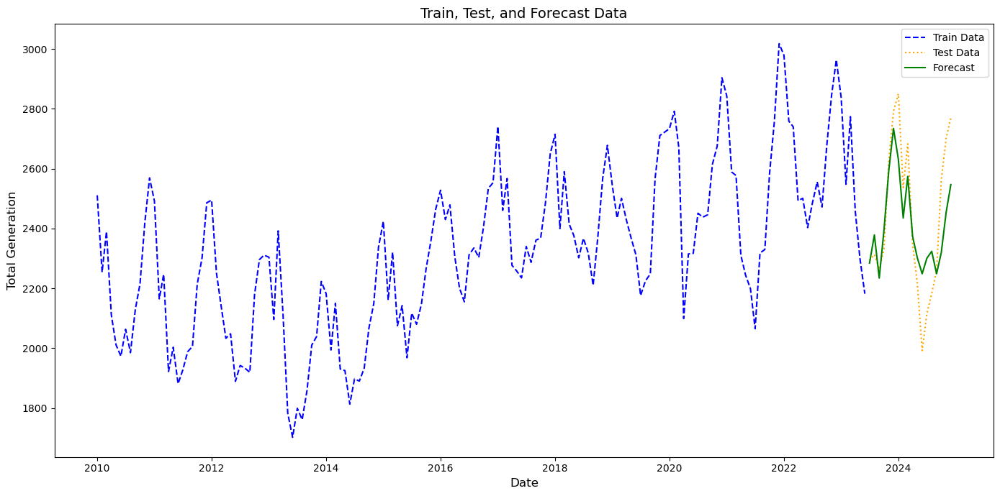

In [193]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

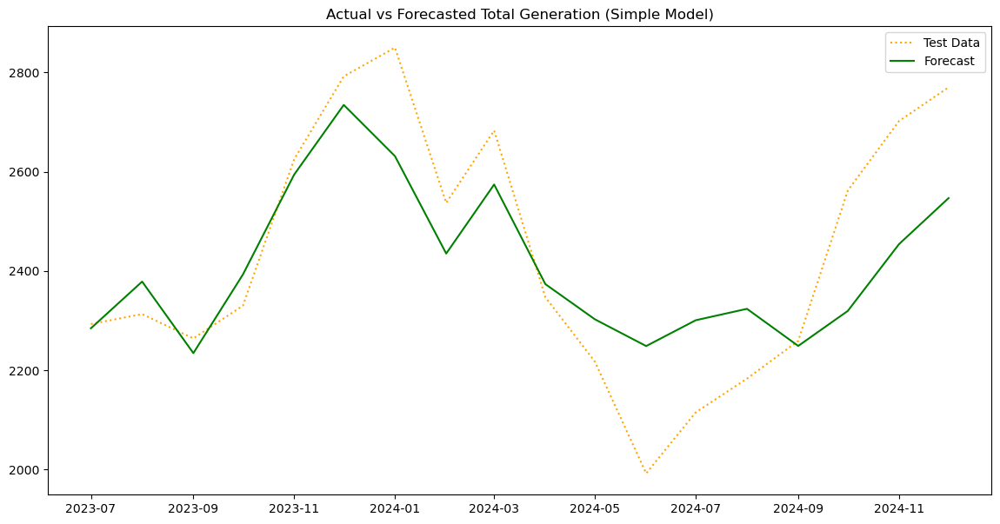

In [194]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [195]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.66
Mean Absolute Error (MAE): 116.85
Mean Squared Error (MSE): 21218.50
Root Mean Squared Error (RMSE): 145.67
Mean Absolute Percentage Error (MAPE): 4.80%


### Conclusion: Model Diagnostics
1. AR(1) -statistically significant while AR(2) - not significant
2. AR(1) and MA(1) Seasonality - Statistically significant
3. Sigma is very high
4. No autocorrelation in the residuals
5. Residuals are not normally distributed
6. Kurtosis of residuals are better than ther experiments
7. The Heteroscedasticity - Residuals exhibit changes in variance.
8. The r2_score is 66%, which shows that 66% of the variance is explained by the model. The errors are still high, though much better than the other experimentns


# Experiment 8

In [198]:
model_8 = SARIMAX(train["Total_Generation"], order=(3,1,0), seasonal_order=(1,1,1,12)).fit()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [199]:
model_8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                     Total_Generation   No. Observations:                  162
Model:             SARIMAX(3, 1, 0)x(1, 1, [1], 12)   Log Likelihood                -890.313
Date:                              Sat, 12 Apr 2025   AIC                           1792.626
Time:                                      16:46:52   BIC                           1810.649
Sample:                                  01-01-2010   HQIC                          1799.948
                                       - 06-01-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3368      0.077     -4.377      0.000      -0.488      -0.186
ar.L2         -0.3137      0.078     -4.006      0.000      -0.467      -0.160
ar.L3         -0.2290      0.080     -2.852      0.004      -0.386      -0.072
ar.S.L12       0.0965      0.130      0.740      0.460      -0.159       0.352
ma.S.L12      -0.9911      1.995     -0.497      0.619      -4.902       2.919
sigma2      7534.4073   1.44e+04      0.524      0.600   -2.07e+04    3.57e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                14.19
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               1.90   Skew:                            -0.34
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

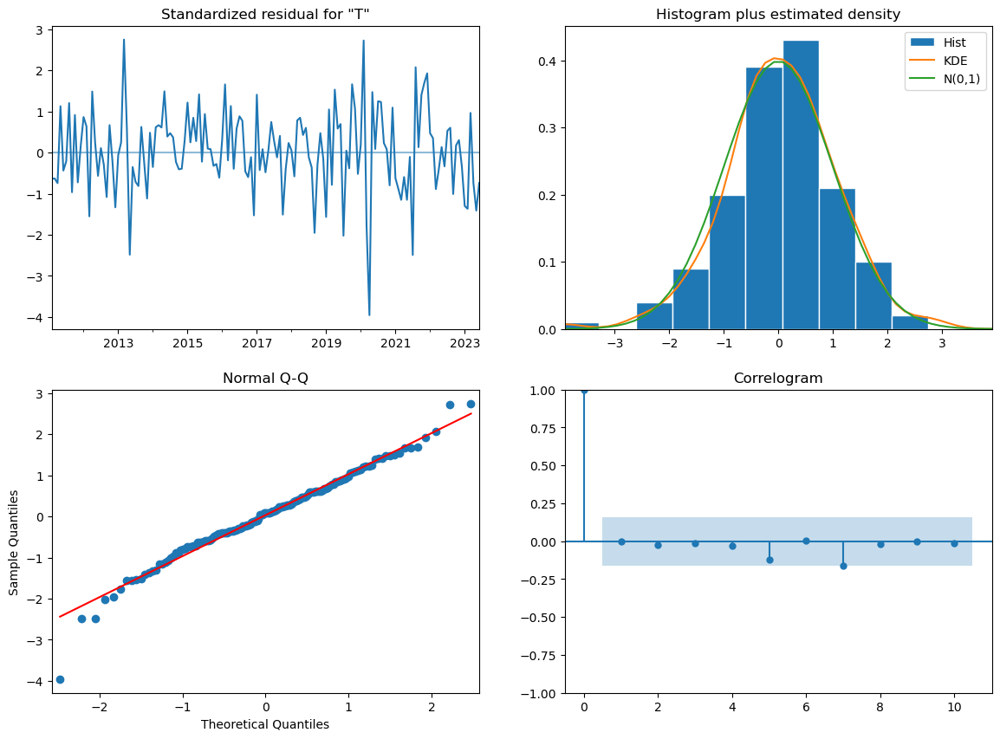

In [200]:
model_8.plot_diagnostics(figsize=(14,10));

In [201]:
forecast_values = model_8.get_forecast(steps=test.shape[0])

In [202]:
forecast_values.predicted_mean

2023-07-01    2315.079097
2023-08-01    2352.993543
2023-09-01    2342.398186
2023-10-01    2497.092390
2023-11-01    2634.002320
2023-12-01    2772.044126
2024-01-01    2754.645830
2024-02-01    2529.217696
2024-03-01    2629.931896
2024-04-01    2369.717729
2024-05-01    2321.514861
2024-06-01    2236.026650
2024-07-01    2308.788887
2024-08-01    2325.898149
2024-09-01    2341.143164
2024-10-01    2505.222106
2024-11-01    2632.304191
2024-12-01    2765.782420
Freq: MS, Name: predicted_mean, dtype: float64

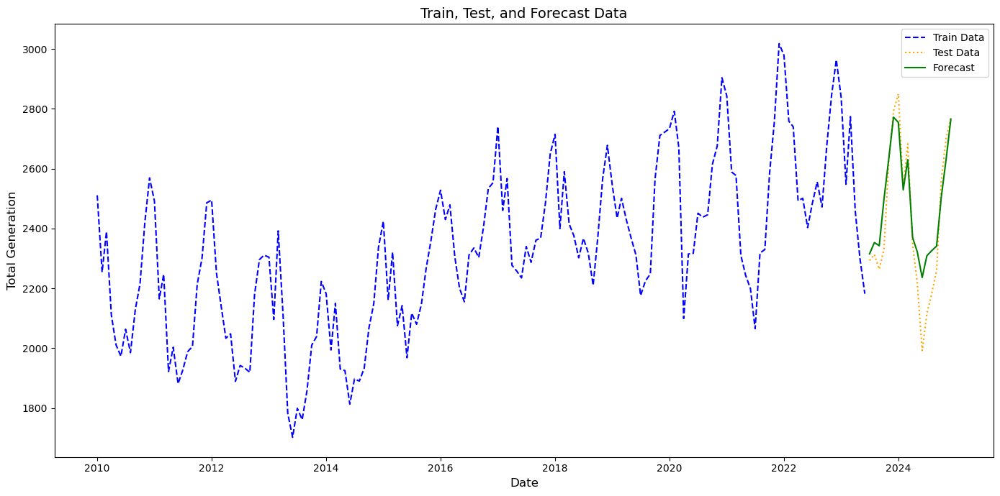

In [203]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

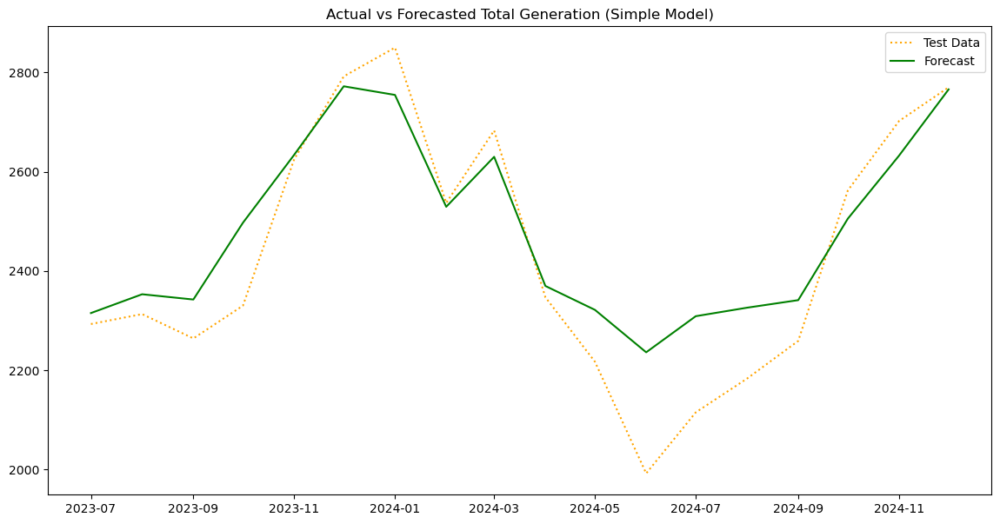

In [204]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [205]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.83
Mean Absolute Error (MAE): 78.53
Mean Squared Error (MSE): 10689.48
Root Mean Squared Error (RMSE): 103.39
Mean Absolute Percentage Error (MAPE): 3.46%


### Conclusion
##### 1. AR and MA Coefficients:

AR(1) coefficient: -0.3368 (p-value = 0.000) – Significant

AR(2) coefficient: -0.3137 (p-value = 0.000) – Also significant 

AR(3) coefficient: -0.2290 (p-value = 0.004) – Significant

Seasonal AR(12) coefficient: 0.0965 (p-value = 0.460) – Not significant

Seasonal MA(12) coefficient: -0.9911 (p-value = 0.619) – Not significant

##### 2. Model Performance Metrics:
R² Score: 0.83 - The model explains 83% of the variance in the total generation. Higher R² values indicate that the model is explaining more of the data's variability.

The MAE of 78.53 suggests that the average prediction error is relatively low, indicating that the model is performing well.

Mean Squared Error (MSE): 10689.48. The MSE penalizes large errors and is a bit higher, but this is typical in time series modeling.

The RMSE value of 103.39 suggests the typical error is about 103.39 units in the same scale as the original data, which is reasonable for a time series model.

The MAPE of 3.46% indicates that, on average, the model's forecast is off by 3.46% of the actual value. This is a strong performance, as values under 5% are generally considered excellent in time series forecasting.

##### 3. Diagnostics:
Residuals are not normally distributed

No autocorrelation - (Ljung-Box test)

High Sigma and Heteroscedasticity Test shows the variance is constant.

High Kurtosis.

# Experiment 9

In [208]:
model_9 = SARIMAX(train["Total_Generation"], order=(4,1,0), seasonal_order=(0,1,0,12)).fit()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [209]:
model_9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Total_Generation   No. Observations:                  162
Model:             SARIMAX(4, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -921.073
Date:                            Sat, 12 Apr 2025   AIC                           1852.147
Time:                                    16:46:55   BIC                           1867.166
Sample:                                01-01-2010   HQIC                          1858.249
                                     - 06-01-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4124      0.100     -4.115      0.000      -0.609      -0.216
ar.L2         -0.3943      0.083     -4.761      0.000      -0.557      -0.232
ar.L3         -0.3444      0.074     -4.654      0.000      -0.489      -0.199
ar.L4         -0.0464      0.085     -0.544      0.587      -0.214       0.121
sigma2      1.362e+04   1456.027      9.356      0.000    1.08e+04    1.65e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                13.23
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.80   Skew:                            -0.24
Prob(H) (two-sided):                  0.04   Kurtosis:                         4.38
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

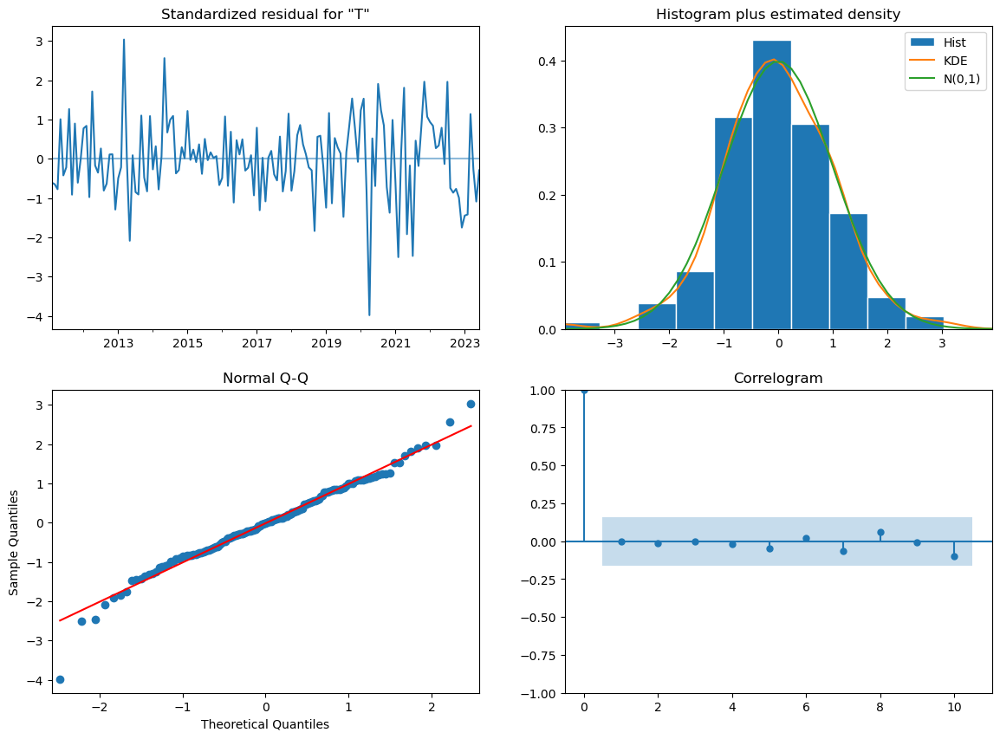

In [210]:
model_9.plot_diagnostics(figsize=(14,10));

In [211]:
forecast_values = model_9.get_forecast(steps=test.shape[0])

In [212]:
forecast_values.predicted_mean

2023-07-01    2349.080051
2023-08-01    2453.785272
2023-09-01    2336.647170
2023-10-01    2512.654764
2023-11-01    2692.008535
2023-12-01    2827.083311
2024-01-01    2701.530939
2024-02-01    2402.691151
2024-03-01    2625.845983
2024-04-01    2313.558548
2024-05-01    2157.172830
2024-06-01    2039.020768
2024-07-01    2204.398575
2024-08-01    2309.187510
2024-09-01    2192.961543
2024-10-01    2369.199634
2024-11-01    2548.148837
2024-12-01    2682.981565
Freq: MS, Name: predicted_mean, dtype: float64

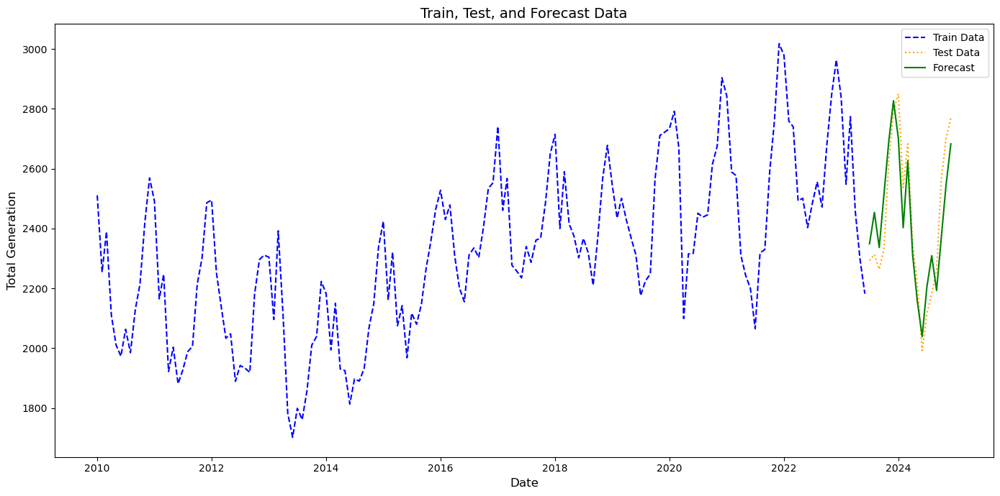

In [213]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

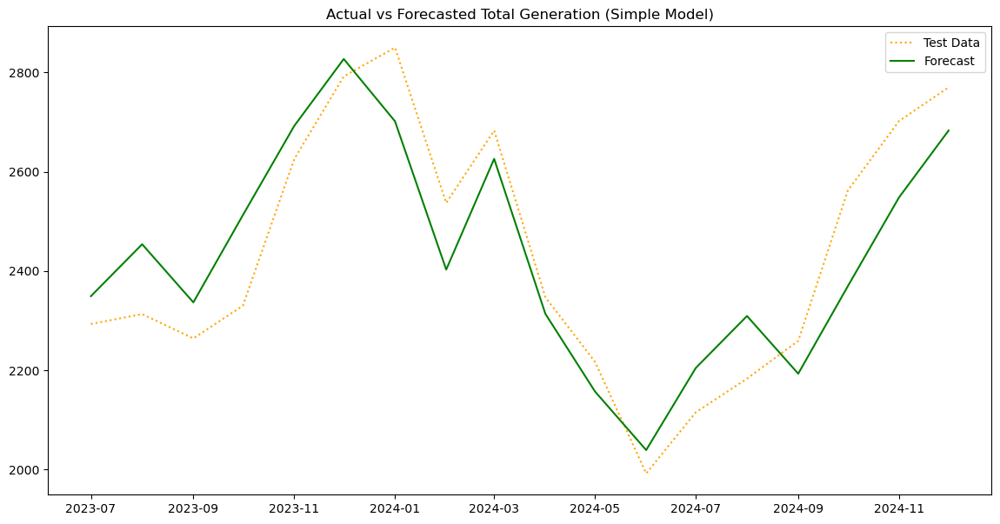

In [214]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [215]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.81
Mean Absolute Error (MAE): 97.21
Mean Squared Error (MSE): 11904.15
Root Mean Squared Error (RMSE): 109.11
Mean Absolute Percentage Error (MAPE): 3.99%


### Conclusions:
1. AR(1), AR(2), AR(3) are all significant.
2. AR(4) is not significant
3. Sigma is still high
4. No autocorrelation in the residuals (Ljung-Box (L1) ) and visualisation confirms this.
5. JB test shows non normality of residuals though the histogram is nearly close to KDE.
6. Heteroskedasticity test shows that Variance is not constant.
7. Kurtosis is moderately high and a mild skew.

Performance metrics:

R2_Score is 81%, which shows that 81% of the variance is best explained by the model.

MAE measures the average magnitude of the errors in the predictions without considering their direction. It gives a sense of the average error per prediction.

RMSE is a widely-used metric to measure the model's prediction error. It gives more weight to larger errors. An RMSE of 109.39 is quite reasonable depending on the scale of your data.

A MAPE of 3.99% is considered very good and indicates that, on average, the predictions are off by only about 3.9% from the actual values.

# Experiment 10:  Increase the AR order by 5, 6, 7.

In [218]:
model_10 = SARIMAX(train["Total_Generation"], order=(7,1,0), seasonal_order=(0,1,0,12)).fit()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [219]:
model_10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Total_Generation   No. Observations:                  162
Model:             SARIMAX(7, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -920.602
Date:                            Sat, 12 Apr 2025   AIC                           1857.204
Time:                                    16:46:59   BIC                           1881.235
Sample:                                01-01-2010   HQIC                          1866.967
                                     - 06-01-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4103      0.104     -3.963      0.000      -0.613      -0.207
ar.L2         -0.4048      0.085     -4.739      0.000      -0.572      -0.237
ar.L3         -0.3477      0.088     -3.947      0.000      -0.520      -0.175
ar.L4         -0.0679      0.109     -0.626      0.531      -0.281       0.145
ar.L5         -0.0430      0.097     -0.445      0.657      -0.233       0.147
ar.L6          0.0091      0.096      0.095      0.924      -0.179       0.197
ar.L7         -0.0640      0.095     -0.675      0.500      -0.250       0.122
sigma2      1.354e+04   1579.879      8.569      0.000    1.04e+04    1.66e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                11.91
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               1.86   Skew:                            -0.23
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

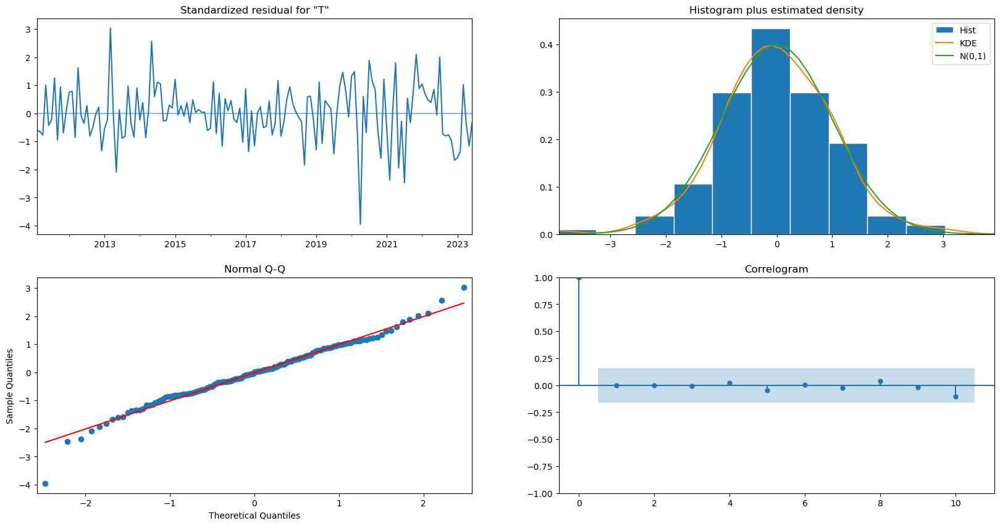

In [220]:
model_10.plot_diagnostics(figsize=(20,10));

In [221]:
forecast_values = model_10.get_forecast(steps=test.shape[0])

In [222]:
forecast_values.predicted_mean

2023-07-01    2356.990767
2023-08-01    2455.243558
2023-09-01    2350.054448
2023-10-01    2511.616549
2023-11-01    2695.808705
2023-12-01    2837.215903
2024-01-01    2713.001585
2024-02-01    2405.878119
2024-03-01    2629.033590
2024-04-01    2319.280171
2024-05-01    2166.537928
2024-06-01    2045.821654
2024-07-01    2217.081103
2024-08-01    2315.621626
2024-09-01    2213.492901
2024-10-01    2375.201969
2024-11-01    2558.065605
2024-12-01    2698.601212
Freq: MS, Name: predicted_mean, dtype: float64

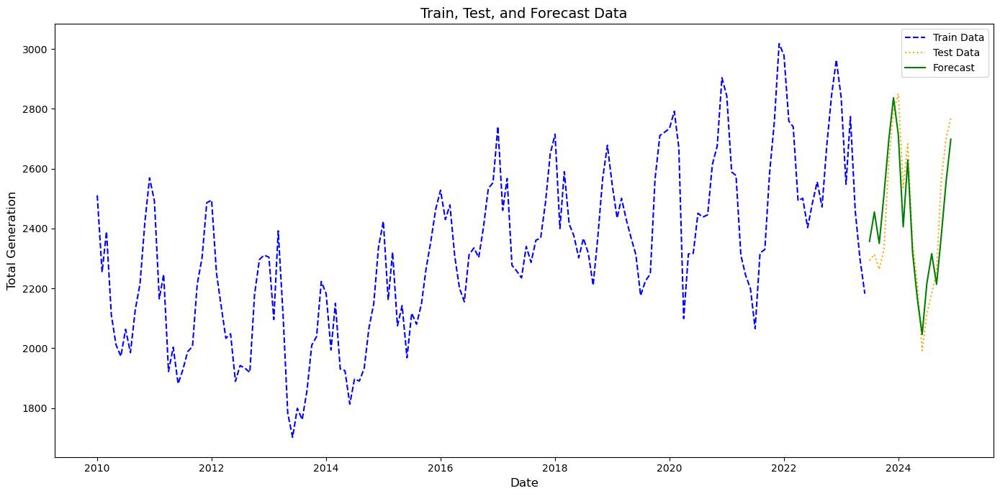

In [223]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

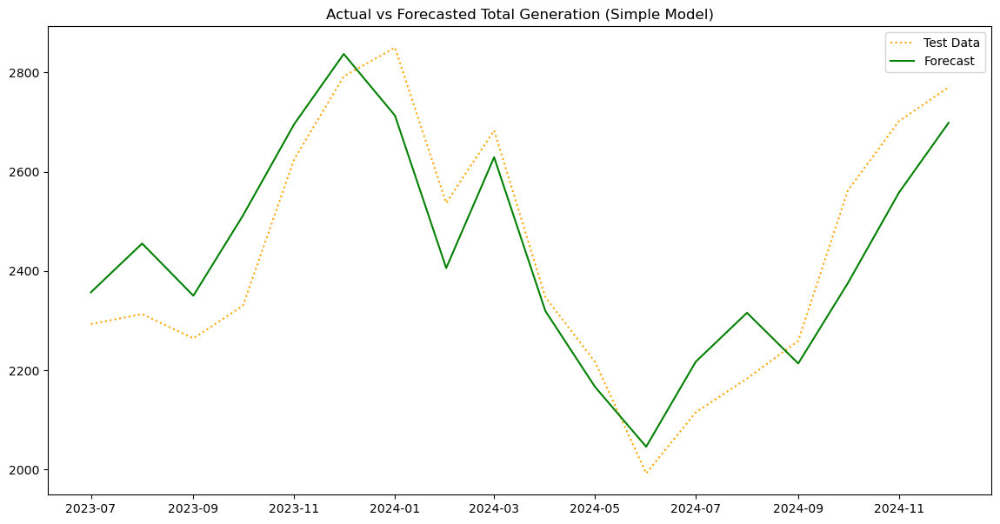

In [224]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [225]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.82
Mean Absolute Error (MAE): 95.91
Mean Squared Error (MSE): 11536.12
Root Mean Squared Error (RMSE): 107.41
Mean Absolute Percentage Error (MAPE): 3.95%


### Conclusion:
Increased the AR by 5, 6 and 7 order, but the diagnostics and the performance were similiar to the AR order - 4.

### Next steps:  Box Cox Transformations
The Shapiro Test showed that the target column "Total_Generation" was normally distributed. But in most of the experiments performed, the JB test showed that the residuals did not exhibit normal distribution and the moreover the Sigma was very high and the Heteroscedasticity test showed the variance of the residuals was not constant. The Kurtosis was moderately heavy. Inorder to address these issues, BoxCox transformation is employed to the target variable to analyse if they are addressing the issues and improve the performance of the model. 

# Experiment 11   Box Cox Transformations

In [228]:
from scipy import stats

# 1. Applying the Box-Cox Transformation to the entire dataset
electricity_df['Total_Generation_boxcox'], fitted_lambda = stats.boxcox(electricity_df['Total_Generation'] + 1)

In [229]:
# 2. Splitting the data into training and test sets
train_size = int(len(electricity_df) * 0.9)  
train, test = electricity_df[:train_size], electricity_df[train_size:]

In [230]:
# 3. Fitting the SARIMAX model on the transformed training data
model_11 = SARIMAX(train["Total_Generation_boxcox"], order=(5,1,0), seasonal_order=(0,1,0,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [231]:
model_11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:            Total_Generation_boxcox   No. Observations:                  162
Model:             SARIMAX(5, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -355.450
Date:                            Sat, 12 Apr 2025   AIC                            722.899
Time:                                    16:47:04   BIC                            740.923
Sample:                                01-01-2010   HQIC                           730.222
                                     - 06-01-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4214      0.102     -4.126      0.000      -0.622      -0.221
ar.L2         -0.4021      0.085     -4.752      0.000      -0.568      -0.236
ar.L3         -0.3568      0.086     -4.168      0.000      -0.525      -0.189
ar.L4         -0.0707      0.094     -0.754      0.451      -0.255       0.113
ar.L5         -0.0318      0.088     -0.361      0.718      -0.204       0.141
sigma2         6.8861      0.731      9.426      0.000       5.454       8.318
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                14.87
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.61   Skew:                            -0.20
Prob(H) (two-sided):                  0.10   Kurtosis:                         4.50
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

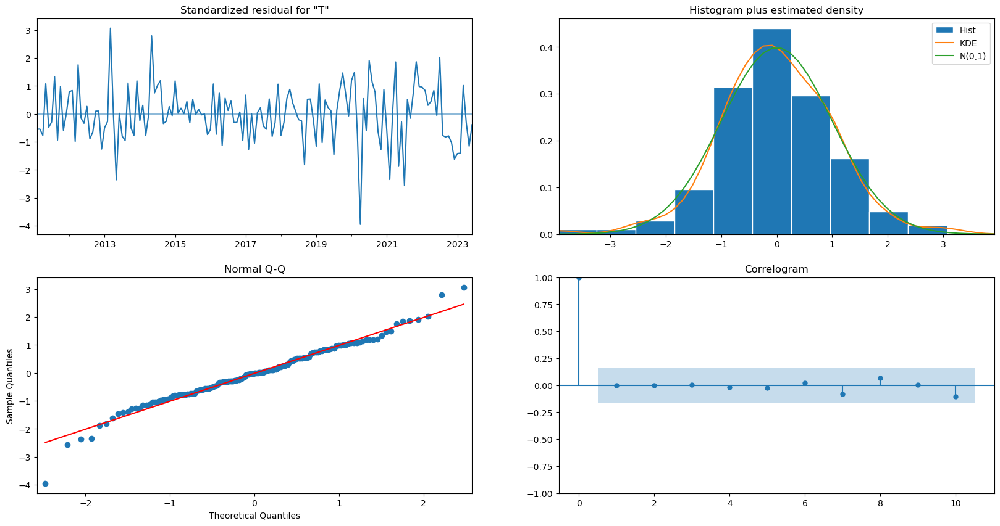

In [232]:
model_11.plot_diagnostics(figsize=(20,10));

In [233]:
# 4. Forecast the values for the test set
forecast_values = model_11.get_forecast(steps=test.shape[0])
forecast_values_predicted = forecast_values.predicted_mean
forecast_values_predicted.values, test["Total_Generation_boxcox"].values

(array([100.31652932, 102.52115127, 100.1661976 , 103.93528457,
        107.5250003 , 110.1558114 , 107.69633115, 101.56037943,
        106.21680611,  99.58951059,  96.12327733,  93.46533823,
         97.12050402,  99.31822795,  96.96986755, 100.74424637,
        104.33285679, 106.96072901]),
 array([ 99.16594914,  99.61413873,  98.51265523,  99.99360789,
        106.37456631, 109.83123184, 111.00790724, 104.50965607,
        107.58698913, 100.37172179,  97.44509151,  92.17328307,
         95.08938453,  96.66587712,  98.39960449, 105.04264282,
        107.98136172, 109.38177484]))

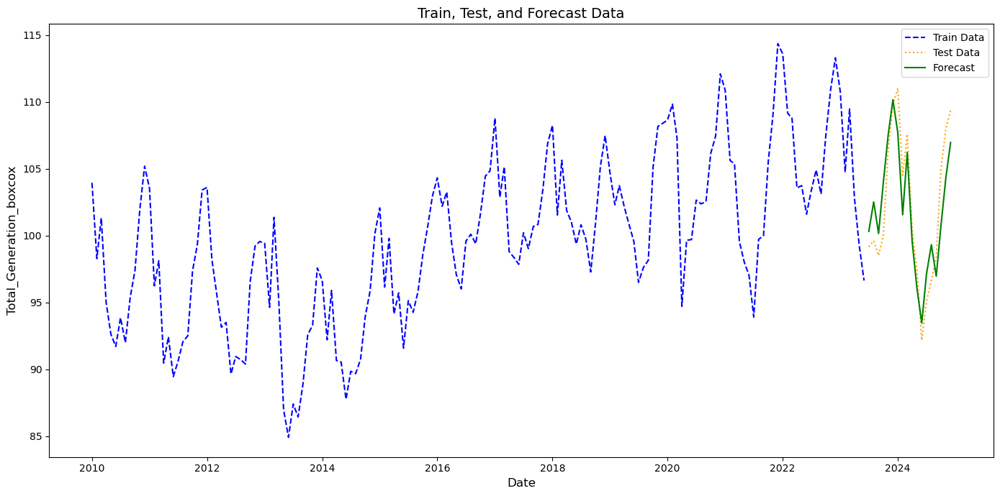

In [234]:

# 5. Plot the results
plt.plot(train.index, train["Total_Generation_boxcox"], label="Train Data", color="blue", linestyle="--")
plt.plot(test.index, test["Total_Generation_boxcox"], label="Test Data", color="orange", linestyle=":")

# Plot the forecasted values
plt.plot(forecast_values_predicted.index, forecast_values_predicted, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total_Generation_boxcox", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()


In [235]:
# 6. Inverse Box-Cox Transformation
def inverse_boxcox(y, fitted_lambda):
    """Inverse Box-Cox transformation"""
    if fitted_lambda == 0:
        return np.exp(y)
    else:
        return (y * fitted_lambda + 1) ** (1 / fitted_lambda)

In [236]:
# Apply inverse Box-Cox to forecasted values
forecast_values_inv = inverse_boxcox(forecast_values_predicted, fitted_lambda)

# Apply inverse Box-Cox to test data (if you want to compare it back to the original scale)
test_inv = inverse_boxcox(test['Total_Generation_boxcox'], fitted_lambda)
forecast_values_inv.values, test_inv.values

(array([2345.51476929, 2445.78943857, 2338.75211508, 2511.19342302,
        2681.01949471, 2808.94057534, 2689.26126901, 2401.83668465,
        2618.49876035, 2312.89878319, 2160.47656757, 2047.05254691,
        2203.8057389 , 2300.78573253, 2197.23357157, 2364.80796488,
        2529.73369894, 2653.96329216]),
 array([2294., 2314., 2265., 2331., 2626., 2793., 2851., 2538., 2684.,
        2348., 2218., 1993., 2116., 2184., 2260., 2563., 2703., 2771.]))

In [237]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# 7. Evaluation Metrics
r2 = r2_score(test_inv, forecast_values_inv)
mae = mean_absolute_error(test_inv, forecast_values_inv)
mse = mean_squared_error(test_inv, forecast_values_inv)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((test_inv - forecast_values_inv) / test_inv)) * 100

# Print Evaluation Metrics
print(f"R2_Score: {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.80
Mean Absolute Error (MAE): 98.56
Mean Squared Error (MSE): 12552.93
Root Mean Squared Error (RMSE): 112.04
Mean Absolute Percentage Error (MAPE): 4.03%


# Conclusion: Diagnosis and the Results of the BoxCox transformation data:
1. AR(1) AR(2), AR(3) are significant, while AR(4), AR (5) are not significant.
2. Residuals are not normally distributed
3. Residual analysis: 
    THe Sigma is large and the variance is not constant. Kurtosis has moderately tails.
    But there is no autocorrelation

R² Score: 0.80, shows that the model explains 80% of the variance in the transformed data. The model captures the majority of the data's variability.

MAE: The model's forecasted values are off by about 98.56 units from the actual values (on the transformed scale).

MSE: 12,552.93, which penalizes larger errors more heavily.

Root Mean Squared Error (RMSE): 112.04, which gives an error metric in the same unit as the data (on the transformed scale). 

MAPE: 4.03%. This means the model’s forecasts are off by, on average, 4.03% of the true values, which is generally considered a good result, depending on the context of the time series data.

# Experiment 12
### Increased the seasonal order by 2,4,1,12 and the reduced the order

In [240]:
model_12 = SARIMAX(train["Total_Generation"], order=(0,1,0), seasonal_order=(2,4,1,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [241]:
model_12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                     Total_Generation   No. Observations:                  162
Model:             SARIMAX(0, 1, 0)x(2, 4, [1], 12)   Log Likelihood                -792.215
Date:                              Sat, 12 Apr 2025   AIC                           1592.429
Time:                                      16:48:04   BIC                           1603.339
Sample:                                  01-01-2010   HQIC                          1596.856
                                       - 06-01-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.6445      0.180     -3.572      0.000      -0.998      -0.291
ar.S.L24      -0.2260      0.183     -1.233      0.218      -0.585       0.133
ma.S.L12      -0.7347      0.275     -2.676      0.007      -1.273      -0.197
sigma2      3723.7751    725.002      5.136      0.000    2302.797    5144.753
===================================================================================
Ljung-Box (L1) (Q):                   5.33   Jarque-Bera (JB):                 4.73
Prob(Q):                              0.02   Prob(JB):                         0.09
Heteroskedasticity (H):               1.65   Skew:                            -0.36
Prob(H) (two-sided):                  0.13   Kurtosis:                         3.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

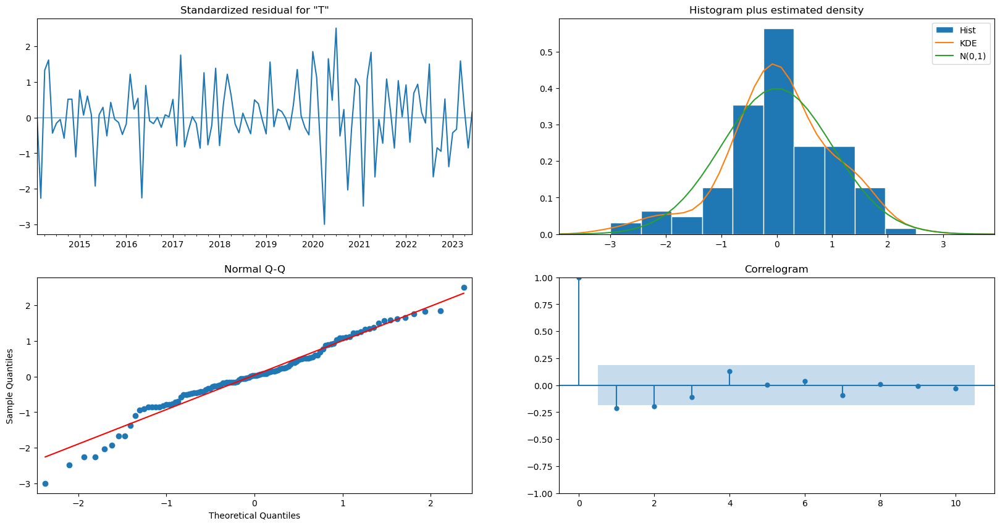

In [243]:
model_12.plot_diagnostics(figsize=(20,10));

In [244]:
forecast_values = model_12.get_forecast(steps=test.shape[0])

In [245]:
forecast_values.predicted_mean

2023-07-01    2335.277601
2023-08-01    2521.106062
2023-09-01    2449.870239
2023-10-01    2626.784062
2023-11-01    2759.627518
2023-12-01    2998.806383
2024-01-01    2891.982093
2024-02-01    2414.561757
2024-03-01    2803.093920
2024-04-01    2580.911636
2024-05-01    2251.171646
2024-06-01    2048.276202
2024-07-01    2332.411797
2024-08-01    2595.975656
2024-09-01    2499.339765
2024-10-01    2576.481069
2024-11-01    2734.726003
2024-12-01    2989.221416
Freq: MS, Name: predicted_mean, dtype: float64

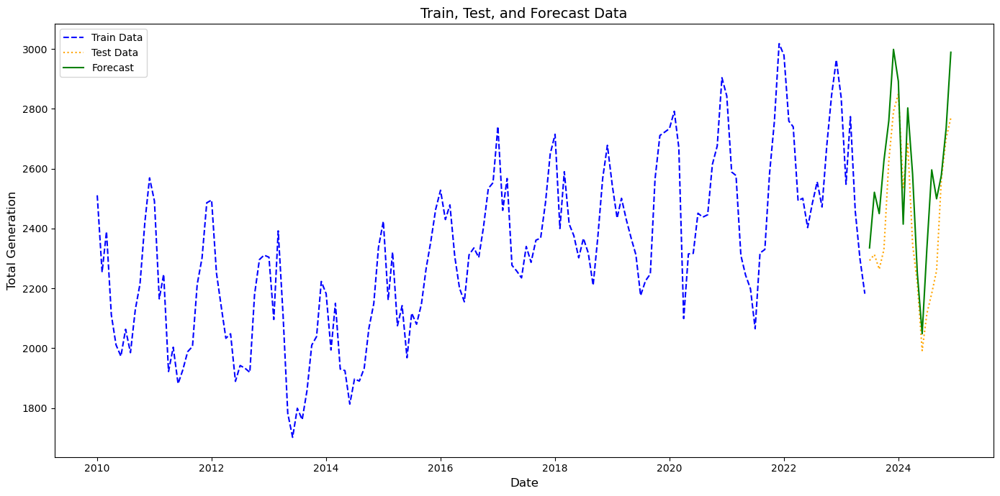

In [246]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

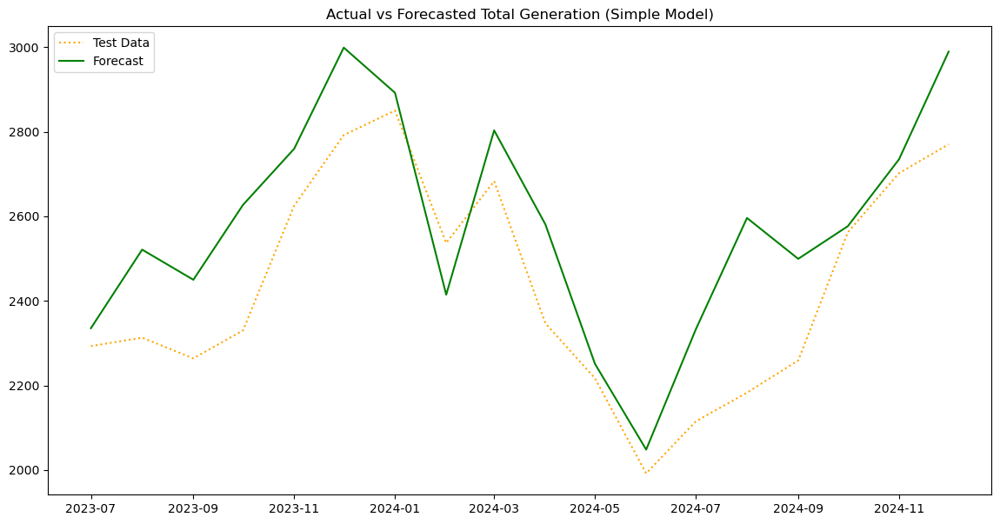

In [247]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [248]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.43
Mean Absolute Error (MAE): 156.69
Mean Squared Error (MSE): 35764.54
Root Mean Squared Error (RMSE): 189.12
Mean Absolute Percentage Error (MAPE): 6.61%


# Conclusion:
Diagnosis and Residual analysis::
1. AR(1) and MA(1) is significant while AR(2) is not significant.

2. Sigma is comparatively less than the previous experiments. The Heteroskedasticity test shows Constant variance. Kurtosis tails are much less. The residual shows normal distribution. There is no autocorrelation (Ljung-Box ).

Performance metrics:
The errors are very high, though the residuals show better performance.

# Experiment 13:
Reducing the Seasonal Differencing to 3 from 4

In [251]:
model_13 = SARIMAX(train["Total_Generation"], order=(0,1,0), seasonal_order=(2,2,1,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [252]:
model_13.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                     Total_Generation   No. Observations:                  162
Model:             SARIMAX(0, 1, 0)x(2, 2, [1], 12)   Log Likelihood                -864.707
Date:                              Sat, 12 Apr 2025   AIC                           1737.415
Time:                                      16:48:16   BIC                           1749.094
Sample:                                  01-01-2010   HQIC                          1742.161
                                       - 06-01-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.6104      0.092     -6.656      0.000      -0.790      -0.431
ar.S.L24      -0.3224      0.087     -3.712      0.000      -0.493      -0.152
ma.S.L12      -0.9917      3.026     -0.328      0.743      -6.923       4.939
sigma2       1.26e+04   3.73e+04      0.338      0.736   -6.05e+04    8.57e+04
===================================================================================
Ljung-Box (L1) (Q):                   5.80   Jarque-Bera (JB):                 8.88
Prob(Q):                              0.02   Prob(JB):                         0.01
Heteroskedasticity (H):               1.84   Skew:                            -0.14
Prob(H) (two-sided):                  0.04   Kurtosis:                         4.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

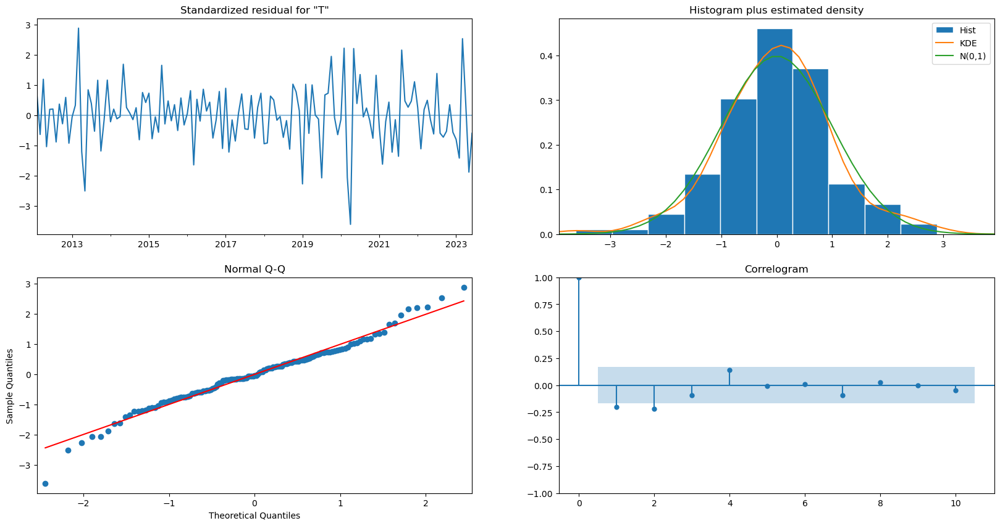

In [253]:
model_13.plot_diagnostics(figsize=(20,10));

#### Forecast for the test data

In [255]:
# Forecast for test set
forecast_values = model_13.get_forecast(steps=len(test))  
forecast_values.predicted_mean  # Extract predicted values

2023-07-01    2209.584749
2023-08-01    2331.138025
2023-09-01    2283.559885
2023-10-01    2501.484816
2023-11-01    2638.171552
2023-12-01    2840.300043
2024-01-01    2748.399646
2024-02-01    2492.292502
2024-03-01    2576.120979
2024-04-01    2292.124611
2024-05-01    2200.084287
2024-06-01    2109.292098
2024-07-01    2091.573183
2024-08-01    2266.072515
2024-09-01    2206.325595
2024-10-01    2443.005223
2024-11-01    2601.709634
2024-12-01    2806.000489
Freq: MS, Name: predicted_mean, dtype: float64

#### Forecast for the next 24 unknown months

In [257]:
# Forecast for future 24 months
forecast_future = model_13.get_forecast(steps=24)  
forecast_future_values = forecast_future.predicted_mean

# Generate future dates with the correct start-of-month format
forecast_index = forecast_values.predicted_mean.index[-1]
future_dates = pd.date_range(start=forecast_index + pd.DateOffset(months=1), periods=24, freq='MS')

# Assign the corrected index
forecast_future_values = forecast_future_values.set_axis(future_dates, axis=0)

forecast_future_values

2025-01-01    2209.584749
2025-02-01    2331.138025
2025-03-01    2283.559885
2025-04-01    2501.484816
2025-05-01    2638.171552
2025-06-01    2840.300043
2025-07-01    2748.399646
2025-08-01    2492.292502
2025-09-01    2576.120979
2025-10-01    2292.124611
2025-11-01    2200.084287
2025-12-01    2109.292098
2026-01-01    2091.573183
2026-02-01    2266.072515
2026-03-01    2206.325595
2026-04-01    2443.005223
2026-05-01    2601.709634
2026-06-01    2806.000489
2026-07-01    2709.422452
2026-08-01    2457.322264
2026-09-01    2554.066419
2026-10-01    2269.114889
2026-11-01    2178.925485
2026-12-01    2075.781977
Freq: MS, Name: predicted_mean, dtype: float64

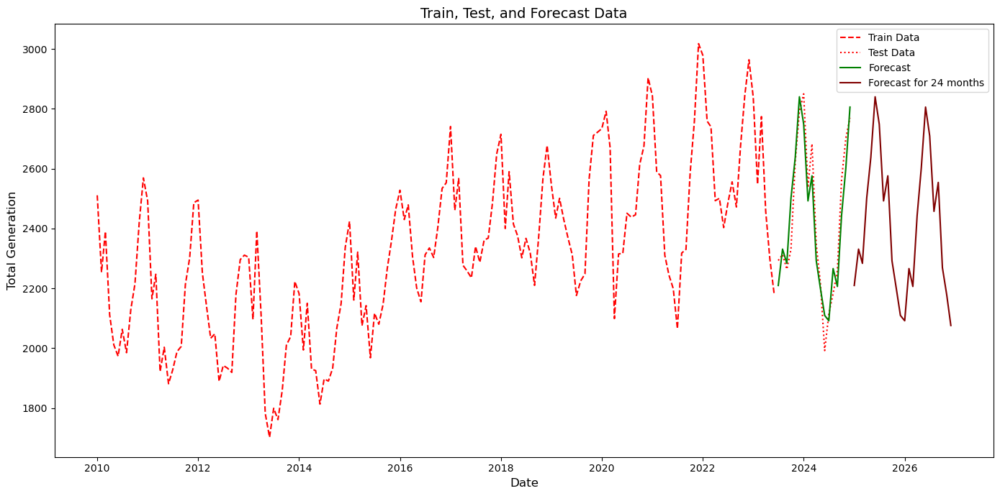

In [258]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="red", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="red", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Plotting future forecasted data
plt.plot(forecast_future_values.index, forecast_future_values, label="Forecast for 24 months", color="maroon", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

#### Train, Test, Forecast with Confidence Interval

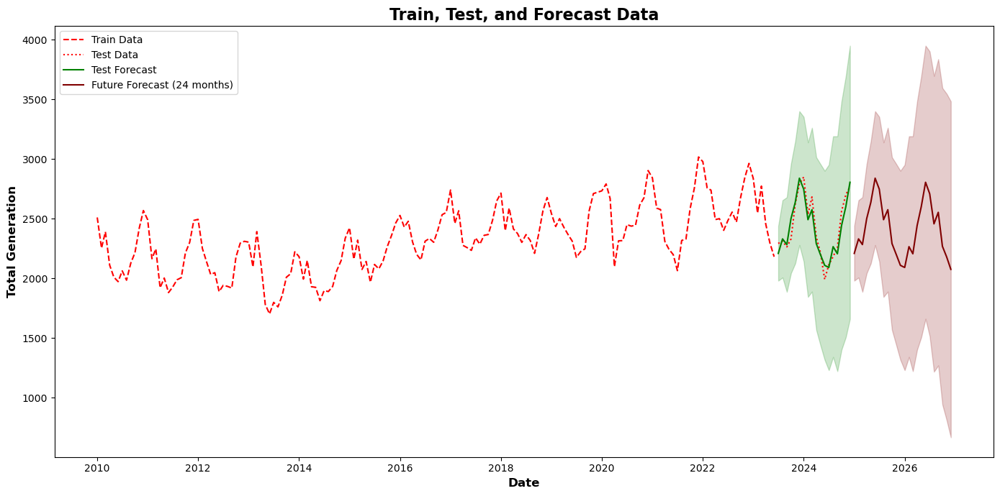

In [260]:
# Forecast for test set
forecast_values = model_13.get_forecast(steps=len(test))  
forecast_mean = forecast_values.predicted_mean  # Extract predicted values
forecast_ci = forecast_values.conf_int()  # Extract confidence intervals

# --------------------------------------------------------------------------
# Forecast for future 24 months
forecast_future = model_13.get_forecast(steps=24)  
forecast_future_mean = forecast_future.predicted_mean  # Extract future predicted values
forecast_future_ci = forecast_future.conf_int()  # Extract confidence intervals for future

# Identify the last test forecast date
last_forecast_date = forecast_mean.index[-1]  

# Create proper future dates that start **right after** last test forecast date
future_dates = pd.date_range(start=last_forecast_date + pd.DateOffset(months=1), periods=24, freq="MS")

# Assign the corrected index
forecast_future_mean.index = future_dates
forecast_future_ci.index = future_dates
# ----------------------------------------------------------------------------
# Plot everything
plt.figure(figsize=(14, 7))

# Plot training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="red", linestyle="--")

# Plot test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="red", linestyle=":")

# Plot test forecast
plt.plot(forecast_mean.index, forecast_mean, label="Test Forecast", color="green", linestyle="-")

# Plot future forecast
plt.plot(forecast_future_mean.index, forecast_future_mean, label="Future Forecast (24 months)", color="maroon", linestyle="-")

# Add confidence intervals for test forecast
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color="green", alpha=0.2)

# Add confidence intervals for future forecast
plt.fill_between(forecast_future_ci.index, forecast_future_ci.iloc[:, 0], forecast_future_ci.iloc[:, 1], color="maroon", alpha=0.2)

# Labels and title
plt.xlabel("Date", fontsize=12, weight="bold")
plt.ylabel("Total Generation", fontsize=12, weight="bold")
plt.title("Train, Test, and Forecast Data", fontsize=16, weight="bold")

# Legend
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()


In [261]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.90
Mean Absolute Error (MAE): 67.27
Mean Squared Error (MSE): 6451.16
Root Mean Squared Error (RMSE): 80.32
Mean Absolute Percentage Error (MAPE): 2.78%


##### AR Coefficients (Seasonal Lags):

ar.S.L12: -0.6104 (p < 0.001) - significant

ar.S.L24: -0.3224 (p < 0.001) - significant

ma.S.L12: -0.9917 (p = 0.743) - not significant

Sigma²: 12,600 (indicating variance in residuals)

##### Model Diagnostics:

Ljung-Box (p = 0.02): Some autocorrelation remains in residuals.

Jarque-Bera (p = 0.01): Residuals not normally distributed.

Heteroskedasticity (p = 0.04): Slight variance in residuals over time.

##### Performance Metrics:
R²: 0.90 - The model explains 90% of the variance.

MAE: 67.27 - On average, predictions are off by 67.27 units.

MSE: 6,451.16 - Squared error, penalizing large mistakes.

RMSE: 80.32 - Error in the same units as the data.

MAPE: 2.78% - The model is off by only 2.78% on average.

##### Conclusion:
Strong performance with high R² and low MAPE.

Some residual issues: autocorrelation, non-normality, and heteroskedasticity.

Further adjustments to model structure might improve residuals and autocorrelation.

# Experiment 14

In [264]:
model_14 = SARIMAX(train["Total_Generation"], order=(2,1,0), seasonal_order=(7,2,0,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [265]:
model_14.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Total_Generation   No. Observations:                  162
Model:             SARIMAX(2, 1, 0)x(7, 2, 0, 12)   Log Likelihood                -856.380
Date:                            Sat, 12 Apr 2025   AIC                           1732.761
Time:                                    16:49:52   BIC                           1761.961
Sample:                                01-01-2010   HQIC                          1744.627
                                     - 06-01-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2717      0.106     -2.574      0.010      -0.479      -0.065
ar.L2         -0.2659      0.087     -3.054      0.002      -0.437      -0.095
ar.S.L12      -1.5244      0.105    -14.471      0.000      -1.731      -1.318
ar.S.L24      -1.6629      0.206     -8.054      0.000      -2.068      -1.258
ar.S.L36      -1.5032      0.279     -5.391      0.000      -2.050      -0.957
ar.S.L48      -1.1545      0.323     -3.579      0.000      -1.787      -0.522
ar.S.L60      -0.7511      0.307     -2.445      0.014      -1.353      -0.149
ar.S.L72      -0.3918      0.236     -1.660      0.097      -0.854       0.071
ar.S.L84      -0.1218      0.148     -0.821      0.412      -0.413       0.169
sigma2      1.228e+04   1503.772      8.166      0.000    9333.200    1.52e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.64   Jarque-Bera (JB):                16.24
Prob(Q):                              0.42   Prob(JB):                         0.00
Heteroskedasticity (H):               1.92   Skew:                            -0.17
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

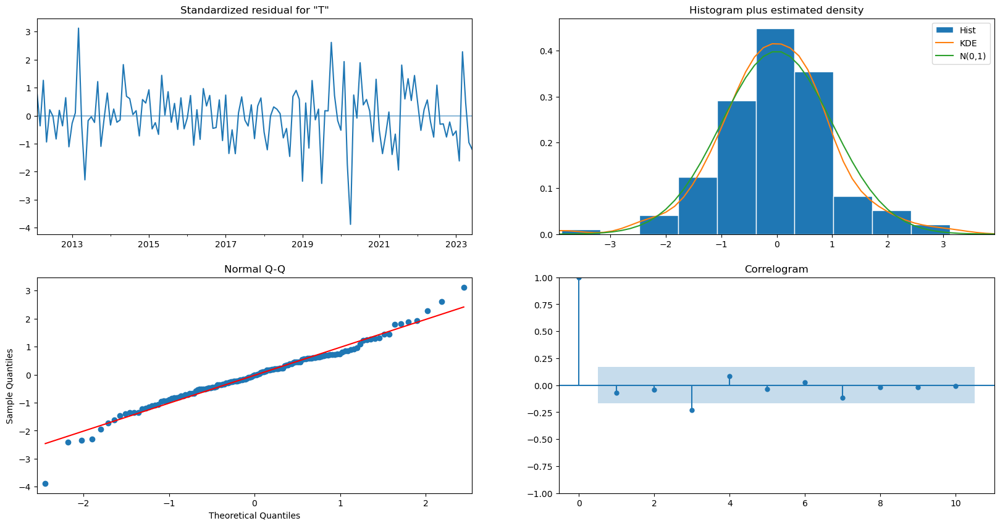

In [266]:
model_14.plot_diagnostics(figsize=(20,10));

In [267]:
forecast_values = model_14.get_forecast(steps=test.shape[0])

In [268]:
forecast_values.predicted_mean

2023-07-01    2208.610055
2023-08-01    2352.138900
2023-09-01    2282.043350
2023-10-01    2557.487691
2023-11-01    2725.917121
2023-12-01    2908.549754
2024-01-01    2770.156524
2024-02-01    2562.750839
2024-03-01    2595.191978
2024-04-01    2247.168069
2024-05-01    2203.369588
2024-06-01    2127.103767
2024-07-01    2095.253672
2024-08-01    2274.968531
2024-09-01    2210.296318
2024-10-01    2507.636823
2024-11-01    2675.251108
2024-12-01    2893.760746
Freq: MS, Name: predicted_mean, dtype: float64

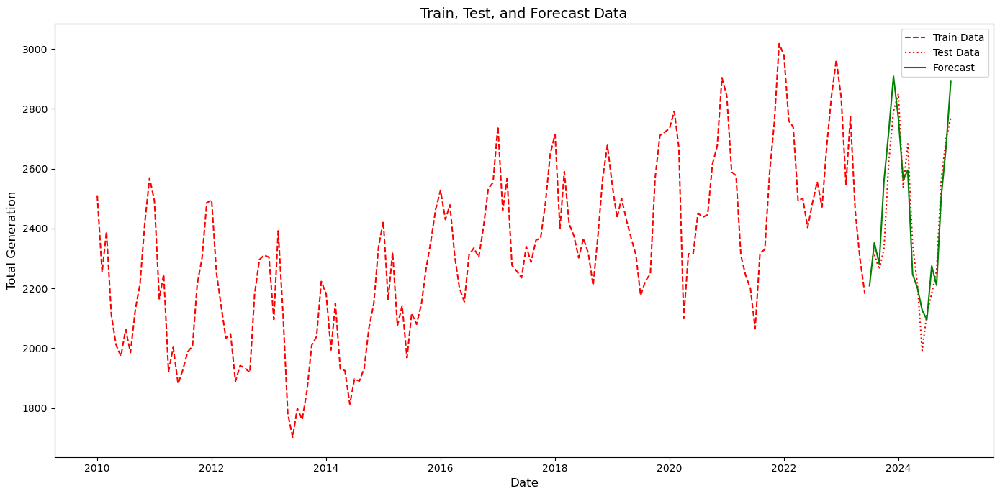

In [269]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="red", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="red", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

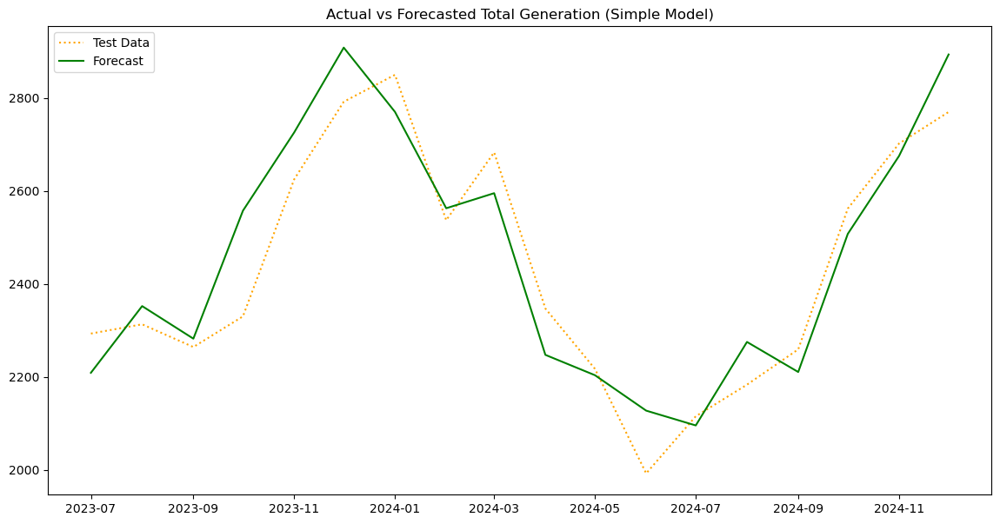

In [270]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [271]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.86
Mean Absolute Error (MAE): 77.43
Mean Squared Error (MSE): 8769.95
Root Mean Squared Error (RMSE): 93.65
Mean Absolute Percentage Error (MAPE): 3.20%


# Experiment 15 - GridSearchCV Hyperparameters

In [273]:
model_cv1 = SARIMAX(train["Total_Generation"], order=(2,1,0), seasonal_order=(5,2,1,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [274]:
model_cv1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                     Total_Generation   No. Observations:                  162
Model:             SARIMAX(2, 1, 0)x(5, 2, [1], 12)   Log Likelihood                -855.350
Date:                              Sat, 12 Apr 2025   AIC                           1728.700
Time:                                      16:51:36   BIC                           1754.979
Sample:                                  01-01-2010   HQIC                          1739.379
                                       - 06-01-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2573      0.100     -2.584      0.010      -0.452      -0.062
ar.L2         -0.2689      0.081     -3.309      0.001      -0.428      -0.110
ar.S.L12      -0.6761      0.240     -2.822      0.005      -1.146      -0.207
ar.S.L24      -0.4030      0.357     -1.128      0.259      -1.103       0.297
ar.S.L36      -0.1759      0.354     -0.497      0.619      -0.869       0.518
ar.S.L48      -0.0479      0.301     -0.159      0.874      -0.638       0.542
ar.S.L60      -0.0032      0.218     -0.015      0.988      -0.431       0.424
ma.S.L12      -0.9930      6.926     -0.143      0.886     -14.567      12.581
sigma2      1.062e+04   7.12e+04      0.149      0.882   -1.29e+05     1.5e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.65   Jarque-Bera (JB):                16.71
Prob(Q):                              0.42   Prob(JB):                         0.00
Heteroskedasticity (H):               1.88   Skew:                            -0.19
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.67
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

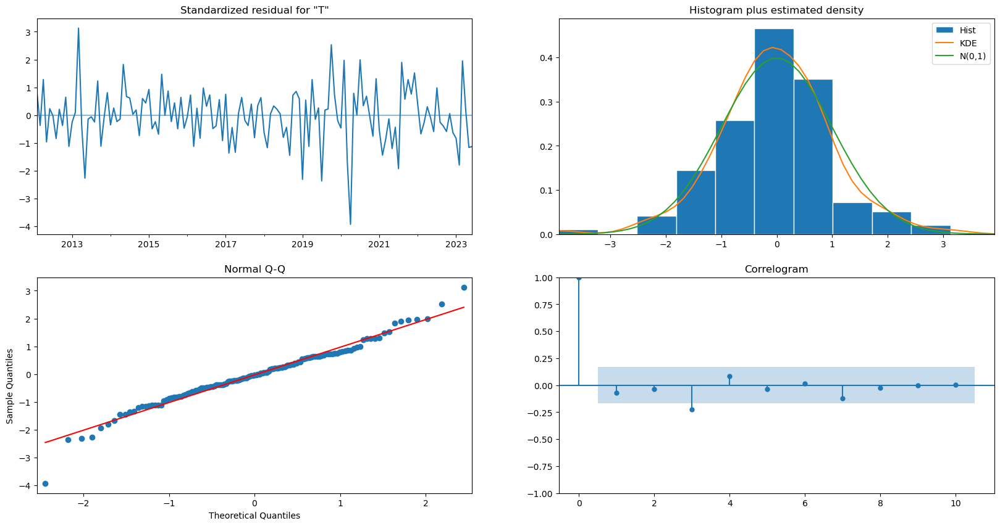

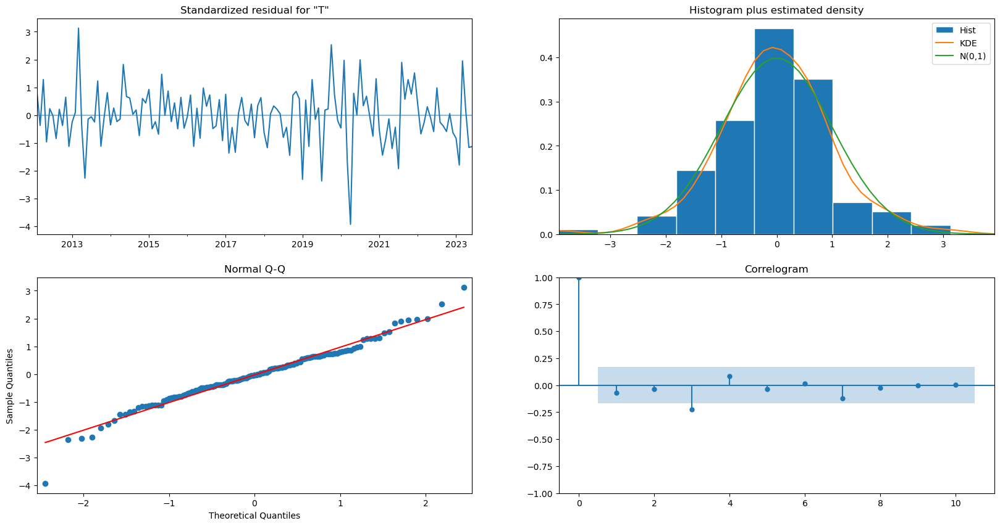

In [275]:
model_cv1.plot_diagnostics(figsize=(20,10))

In [276]:
forecast_values = model_cv1.get_forecast(steps=test.shape[0])

In [277]:
forecast_values.predicted_mean

2023-07-01    2244.669253
2023-08-01    2367.329559
2023-09-01    2300.368093
2023-10-01    2540.703818
2023-11-01    2692.220539
2023-12-01    2865.390743
2024-01-01    2783.674494
2024-02-01    2581.623078
2024-03-01    2633.423413
2024-04-01    2317.539899
2024-05-01    2273.724688
2024-06-01    2196.337625
2024-07-01    2212.164867
2024-08-01    2358.303806
2024-09-01    2292.245948
2024-10-01    2534.209845
2024-11-01    2687.758186
2024-12-01    2872.598413
Freq: MS, Name: predicted_mean, dtype: float64

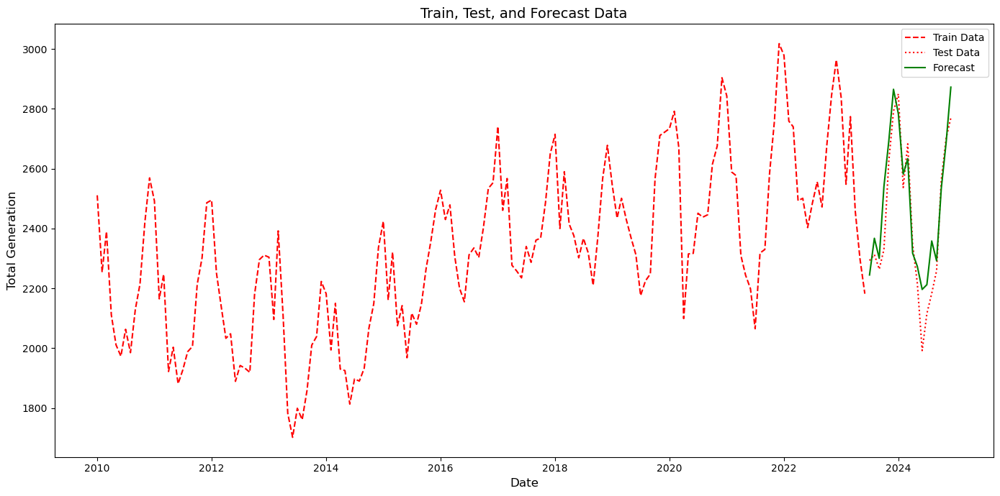

In [278]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="red", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="red", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

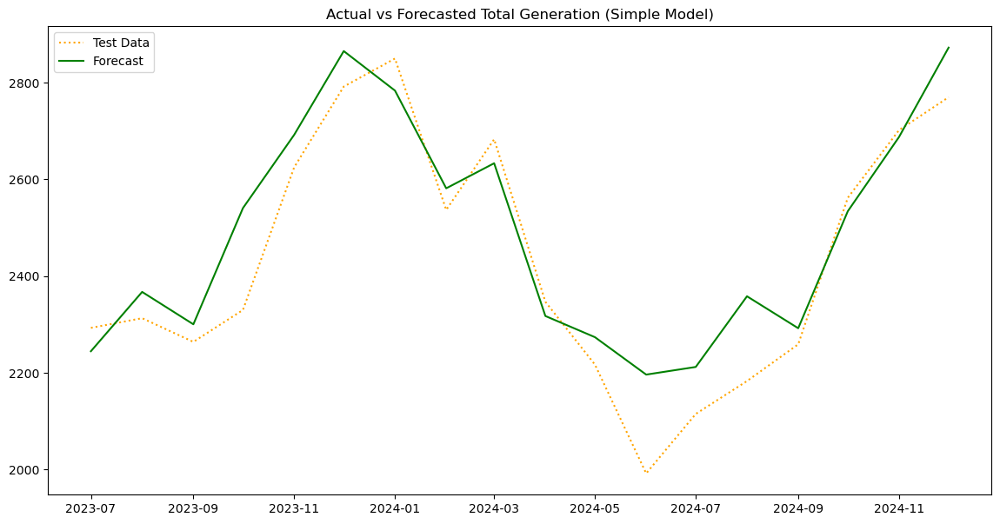

In [279]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [280]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.85
Mean Absolute Error (MAE): 77.32
Mean Squared Error (MSE): 9354.33
Root Mean Squared Error (RMSE): 96.72
Mean Absolute Percentage Error (MAPE): 3.32%


# Experiment 16 - GridSearch CV parameters

In [282]:
model_cv2 = SARIMAX(train["Total_Generation"], order=(2,1,0), seasonal_order=(4,2,2,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [283]:
model_cv2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                        Total_Generation   No. Observations:                  162
Model:             SARIMAX(2, 1, 0)x(4, 2, [1, 2], 12)   Log Likelihood                -855.428
Date:                                 Sat, 12 Apr 2025   AIC                           1728.855
Time:                                         16:53:13   BIC                           1755.135
Sample:                                     01-01-2010   HQIC                          1739.535
                                          - 06-01-2023                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2614      0.103     -2.531      0.011      -0.464      -0.059
ar.L2         -0.2677      0.081     -3.299      0.001      -0.427      -0.109
ar.S.L12      -1.6597     27.661     -0.060      0.952     -55.874      52.555
ar.S.L24      -1.0349     18.232     -0.057      0.955     -36.769      34.699
ar.S.L36      -0.5146     10.321     -0.050      0.960     -20.743      19.714
ar.S.L48      -0.1405      3.823     -0.037      0.971      -7.634       7.353
ma.S.L12      -0.0001    319.570  -4.34e-07      1.000    -626.345     626.345
ma.S.L24      -0.9999     27.721     -0.036      0.971     -55.332      53.333
sigma2      1.069e+04      0.010    1.1e+06      0.000    1.07e+04    1.07e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.67   Jarque-Bera (JB):                17.72
Prob(Q):                              0.41   Prob(JB):                         0.00
Heteroskedasticity (H):               1.89   Skew:                            -0.19
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.72
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.37e+24. Standard errors may be unstable.
"""

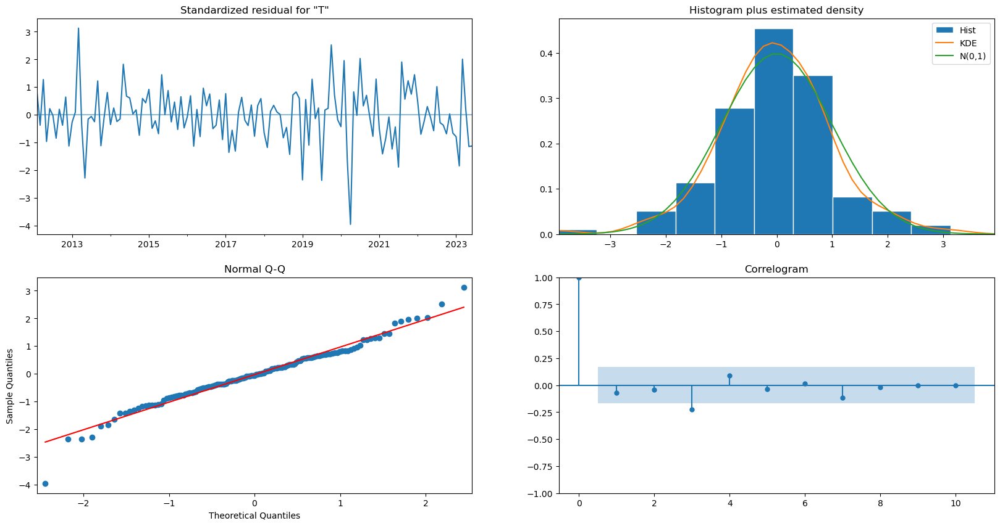

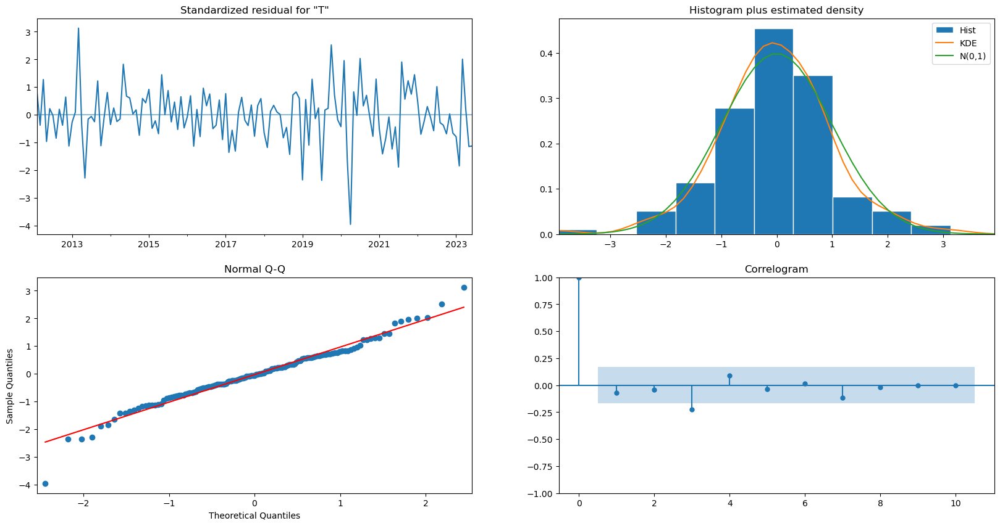

In [284]:
model_cv2.plot_diagnostics(figsize=(20,10))

In [285]:
forecast_values = model_cv2.get_forecast(steps=test.shape[0])

In [286]:
forecast_values.predicted_mean

2023-07-01    2241.860426
2023-08-01    2370.059390
2023-09-01    2308.241215
2023-10-01    2552.189059
2023-11-01    2700.805457
2023-12-01    2875.284331
2024-01-01    2797.937097
2024-02-01    2591.618806
2024-03-01    2643.564786
2024-04-01    2315.142709
2024-05-01    2272.660736
2024-06-01    2193.783146
2024-07-01    2218.017354
2024-08-01    2367.585048
2024-09-01    2302.498128
2024-10-01    2540.537680
2024-11-01    2691.299572
2024-12-01    2884.779597
Freq: MS, Name: predicted_mean, dtype: float64

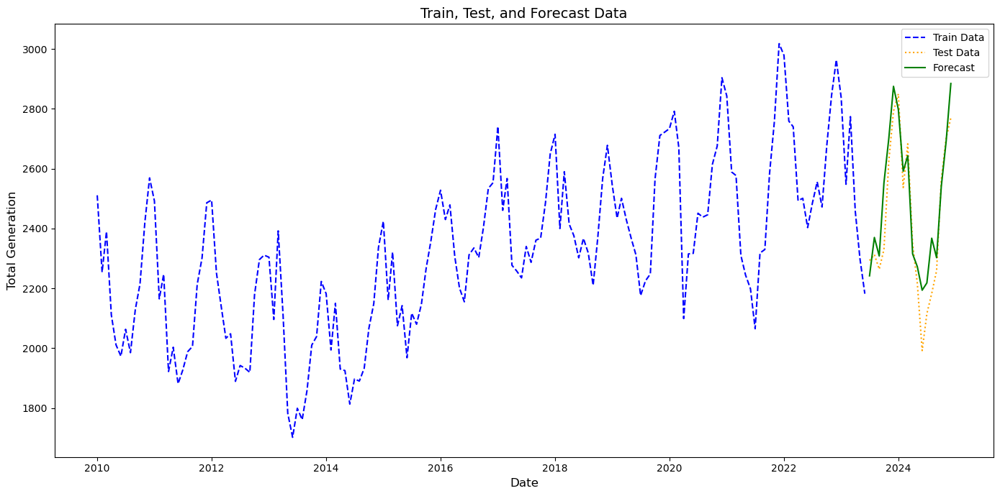

In [287]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

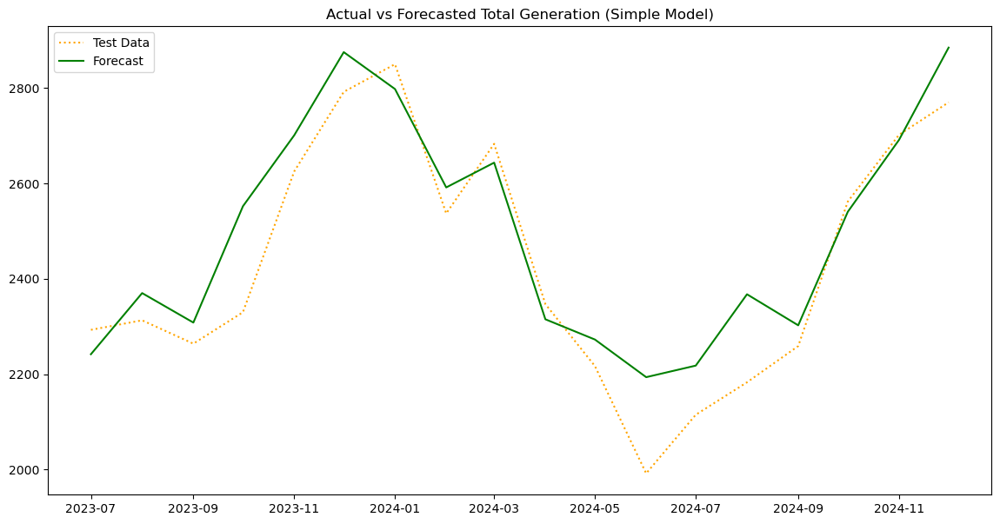

In [288]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [289]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.84
Mean Absolute Error (MAE): 80.40
Mean Squared Error (MSE): 10126.84
Root Mean Squared Error (RMSE): 100.63
Mean Absolute Percentage Error (MAPE): 3.45%


# Experiment 17 - GridSearchCV Hyperparameters

In [291]:
model_cv3 = SARIMAX(train["Total_Generation"], order=(0,1,0), seasonal_order=(2,2,2,12)).fit()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [292]:
model_cv3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                        Total_Generation   No. Observations:                  162
Model:             SARIMAX(0, 1, 0)x(2, 2, [1, 2], 12)   Log Likelihood                -862.649
Date:                                 Sat, 12 Apr 2025   AIC                           1735.299
Time:                                         16:53:43   BIC                           1749.898
Sample:                                     01-01-2010   HQIC                          1741.232
                                          - 06-01-2023                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.0946      0.447     -0.212      0.832      -0.971       0.782
ar.S.L24      -0.0930      0.232     -0.401      0.688      -0.548       0.362
ma.S.L12      -1.7000     17.724     -0.096      0.924     -36.439      33.039
ma.S.L24       0.7032     12.142      0.058      0.954     -23.094      24.501
sigma2      1.072e+04   1.95e+05      0.055      0.956   -3.71e+05    3.92e+05
===================================================================================
Ljung-Box (L1) (Q):                   5.31   Jarque-Bera (JB):                12.35
Prob(Q):                              0.02   Prob(JB):                         0.00
Heteroskedasticity (H):               1.88   Skew:                            -0.19
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.42
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

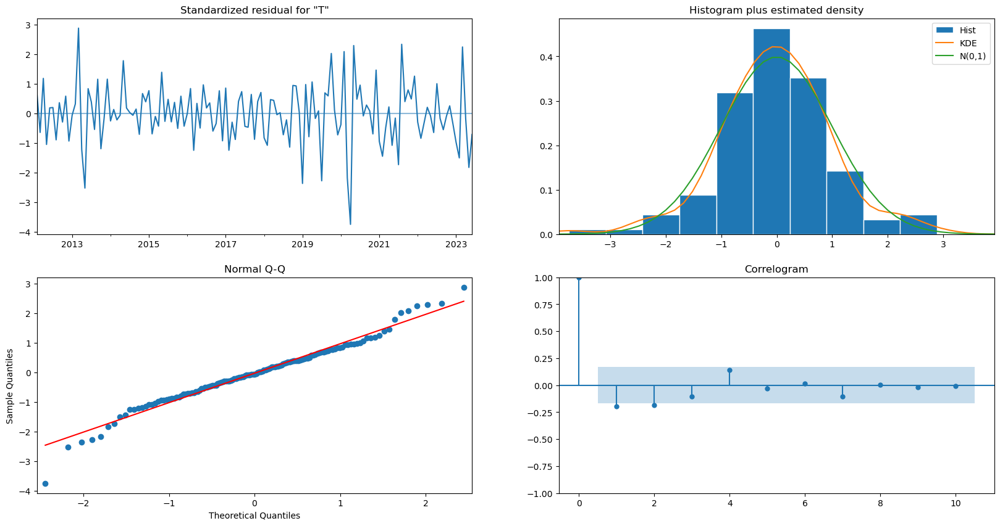

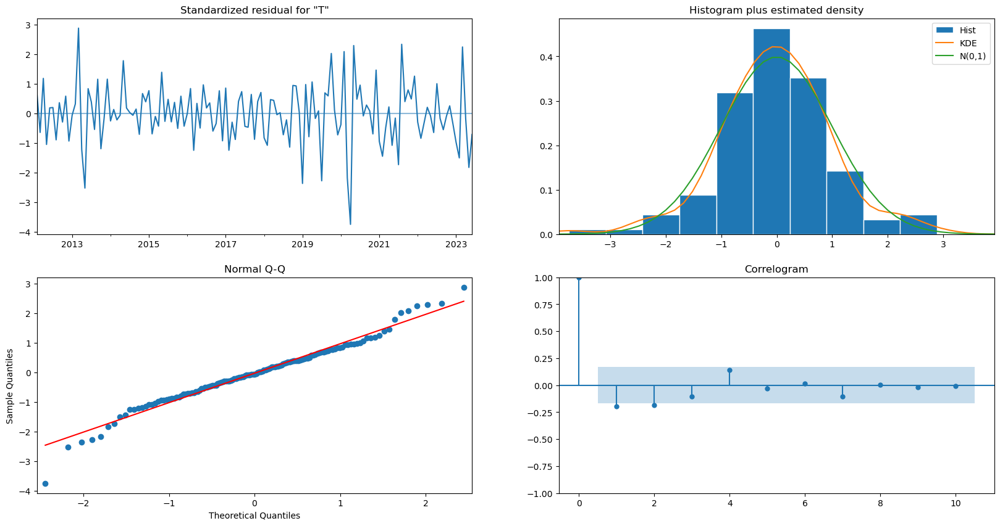

In [293]:
model_cv3.plot_diagnostics(figsize=(20,10))

In [294]:
forecast_values = model_cv3.get_forecast(steps=test.shape[0])

In [295]:
forecast_values.predicted_mean

2023-07-01    2190.459005
2023-08-01    2279.338860
2023-09-01    2229.216048
2023-10-01    2442.171390
2023-11-01    2587.656780
2023-12-01    2742.564361
2024-01-01    2681.427593
2024-02-01    2503.377864
2024-03-01    2547.944470
2024-04-01    2242.907292
2024-05-01    2218.939907
2024-06-01    2159.925525
2024-07-01    2146.694930
2024-08-01    2264.143777
2024-09-01    2207.898801
2024-10-01    2431.341448
2024-11-01    2582.903337
2024-12-01    2750.750811
Freq: MS, Name: predicted_mean, dtype: float64

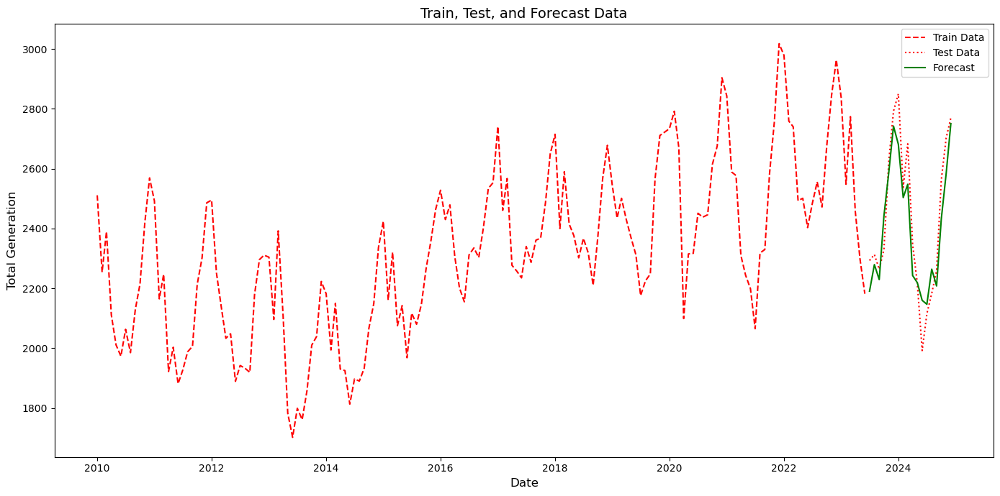

In [296]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="red", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="red", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

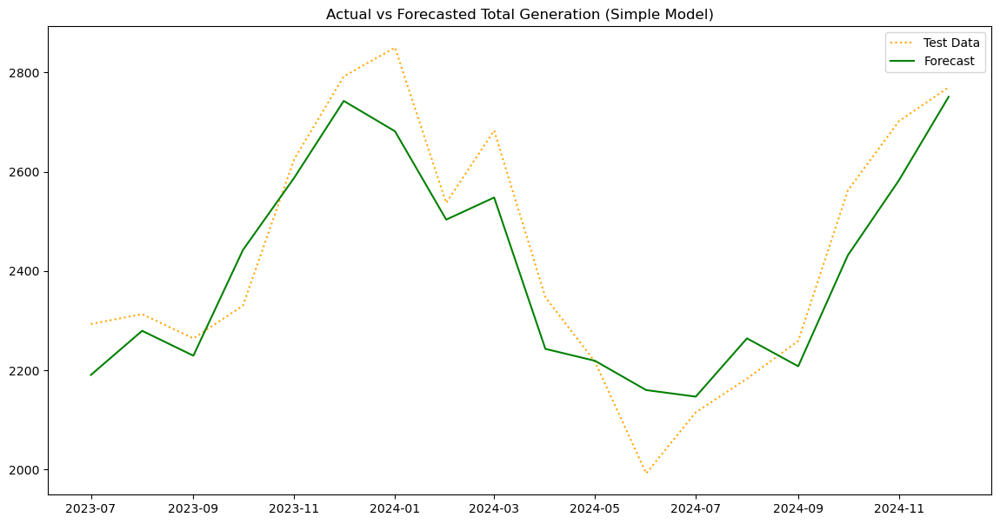

In [297]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [298]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.86
Mean Absolute Error (MAE): 78.56
Mean Squared Error (MSE): 8773.89
Root Mean Squared Error (RMSE): 93.67
Mean Absolute Percentage Error (MAPE): 3.24%


# GridSearchCV Parameters

The GridSearchCV approach was utilized to identify key parameters for the experiments. However, due to extended runtime and computational constraints, these codes were not executed in the current iteration, as they significantly slow down the overall process.

# Exp 0: GridSearchCV - Hyperparameters & Results

# Exp 1: GridSearchCV - Hyperparameters   &   Results

# Exp 18.1: 

In [303]:
model_17 = SARIMAX(train["Total_Generation"], order=(3,2,2), seasonal_order=(3,2,2,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [304]:
model_17.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Total_Generation   No. Observations:                  162
Model:             SARIMAX(3, 2, 2)x(3, 2, 2, 12)   Log Likelihood                -854.398
Date:                            Sat, 12 Apr 2025   AIC                           1730.796
Time:                                    16:55:33   BIC                           1762.835
Sample:                                01-01-2010   HQIC                          1743.816
                                     - 06-01-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2571      1.879     -0.669      0.503      -4.940       2.426
ar.L2         -0.5414      0.524     -1.033      0.302      -1.569       0.486
ar.L3         -0.2820      0.574     -0.492      0.623      -1.407       0.843
ma.L1          0.0063     59.199      0.000      1.000    -116.022     116.035
ma.L2         -0.9936     58.962     -0.017      0.987    -116.556     114.569
ar.S.L12       0.2911     25.909      0.011      0.991     -50.490      51.073
ar.S.L24       0.2720     15.940      0.017      0.986     -30.970      31.514
ar.S.L36       0.2496      7.312      0.034      0.973     -14.082      14.581
ma.S.L12      -1.9877     44.552     -0.045      0.964     -89.308      85.332
ma.S.L24       0.9926     43.558      0.023      0.982     -84.380      86.365
sigma2      1.055e+04      0.009   1.13e+06      0.000    1.05e+04    1.05e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.54   Jarque-Bera (JB):                 7.43
Prob(Q):                              0.46   Prob(JB):                         0.02
Heteroskedasticity (H):               1.92   Skew:                            -0.05
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.64e+25. Standard errors may be unstable.
"""

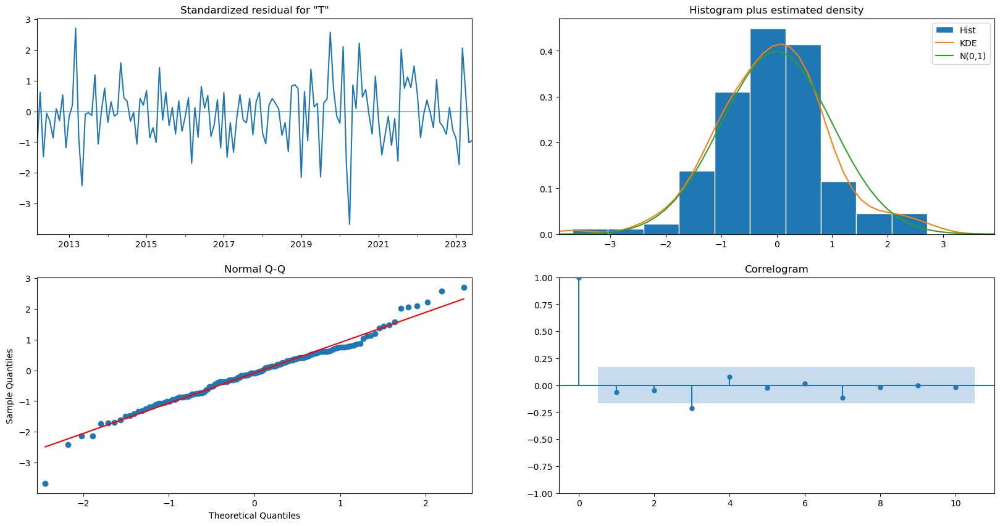

In [305]:
model_17.plot_diagnostics(figsize=(20,10));

In [306]:
forecast_values = model_17.get_forecast(steps=test.shape[0])

In [307]:
forecast_values.predicted_mean

2023-07-01    2262.864432
2023-08-01    2380.542969
2023-09-01    2306.583918
2023-10-01    2523.450950
2023-11-01    2659.020512
2023-12-01    2847.989123
2024-01-01    2760.150127
2024-02-01    2509.767117
2024-03-01    2577.876256
2024-04-01    2287.846731
2024-05-01    2200.846449
2024-06-01    2104.137795
2024-07-01    2111.323578
2024-08-01    2261.233310
2024-09-01    2178.642820
2024-10-01    2401.633116
2024-11-01    2548.808977
2024-12-01    2729.163149
Freq: MS, Name: predicted_mean, dtype: float64

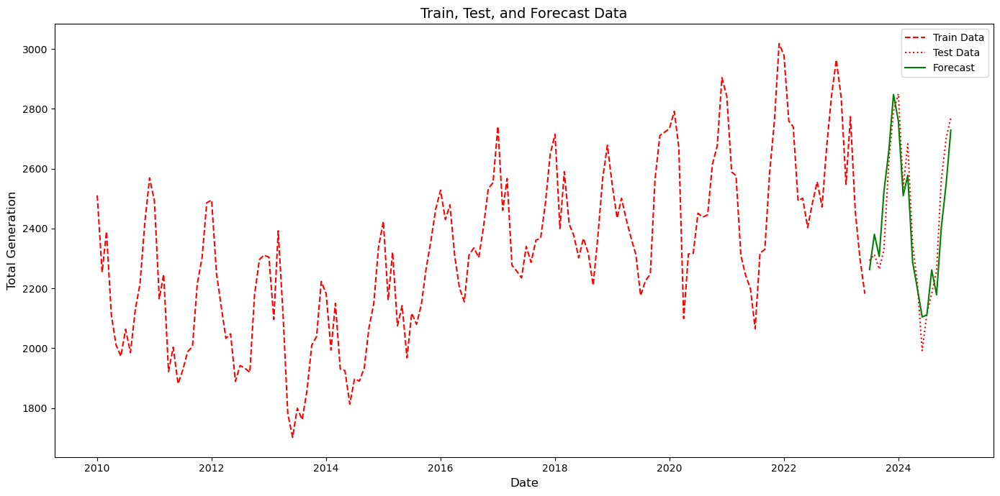

In [308]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="red", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="red", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

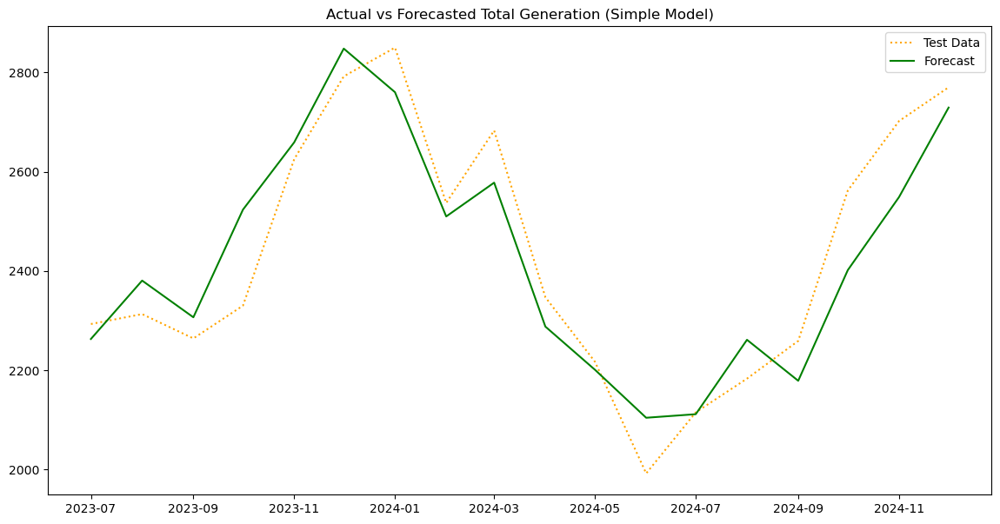

In [309]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [310]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.87
Mean Absolute Error (MAE): 75.00
Mean Squared Error (MSE): 8257.97
Root Mean Squared Error (RMSE): 90.87
Mean Absolute Percentage Error (MAPE): 3.08%


# Exp 2: GridSearchCV - Hyperparameters   &   Results

# Experiment 19

In [313]:
model_15 = SARIMAX(train["Total_Generation"], order=(3,1,1), seasonal_order=(3,1,2,12)).fit()


C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [314]:
model_15.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                        Total_Generation   No. Observations:                  162
Model:             SARIMAX(3, 1, 1)x(3, 1, [1, 2], 12)   Log Likelihood                -890.271
Date:                                 Sat, 12 Apr 2025   AIC                           1800.543
Time:                                         17:09:50   BIC                           1830.582
Sample:                                     01-01-2010   HQIC                          1812.747
                                          - 06-01-2023                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7397      0.294     -2.517      0.012      -1.316      -0.164
ar.L2         -0.4371      0.108     -4.040      0.000      -0.649      -0.225
ar.L3         -0.3252      0.101     -3.226      0.001      -0.523      -0.128
ma.L1          0.4314      0.312      1.383      0.167      -0.180       1.043
ar.S.L12      -0.2146      2.861     -0.075      0.940      -5.821       5.392
ar.S.L24       0.0641      0.224      0.286      0.775      -0.376       0.504
ar.S.L36       0.0683      0.173      0.396      0.692      -0.270       0.407
ma.S.L12      -0.6533      3.310     -0.197      0.844      -7.141       5.834
ma.S.L24      -0.3021      2.497     -0.121      0.904      -5.197       4.593
sigma2      8088.2874   5607.506      1.442      0.149   -2902.222    1.91e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                 8.86
Prob(Q):                              0.83   Prob(JB):                         0.01
Heteroskedasticity (H):               1.78   Skew:                            -0.25
Prob(H) (two-sided):                  0.04   Kurtosis:                         4.08
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

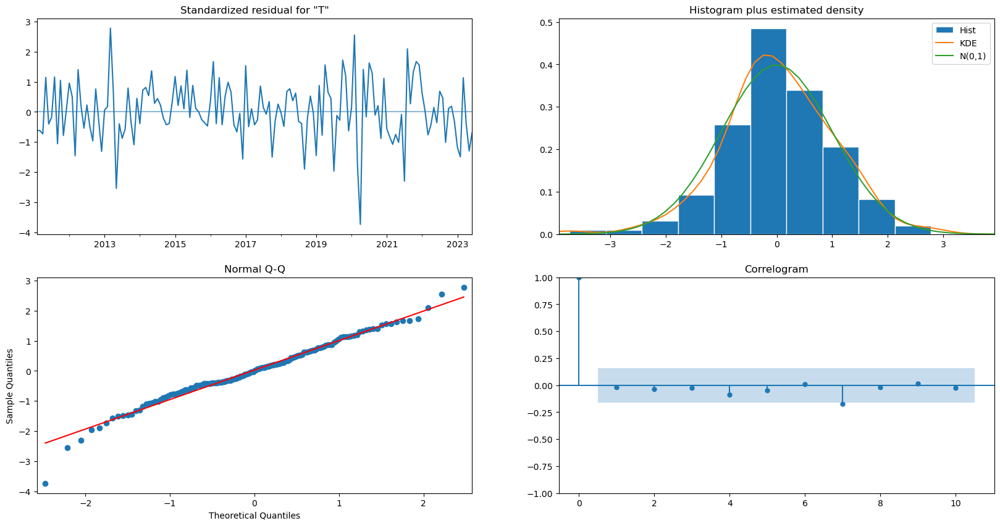

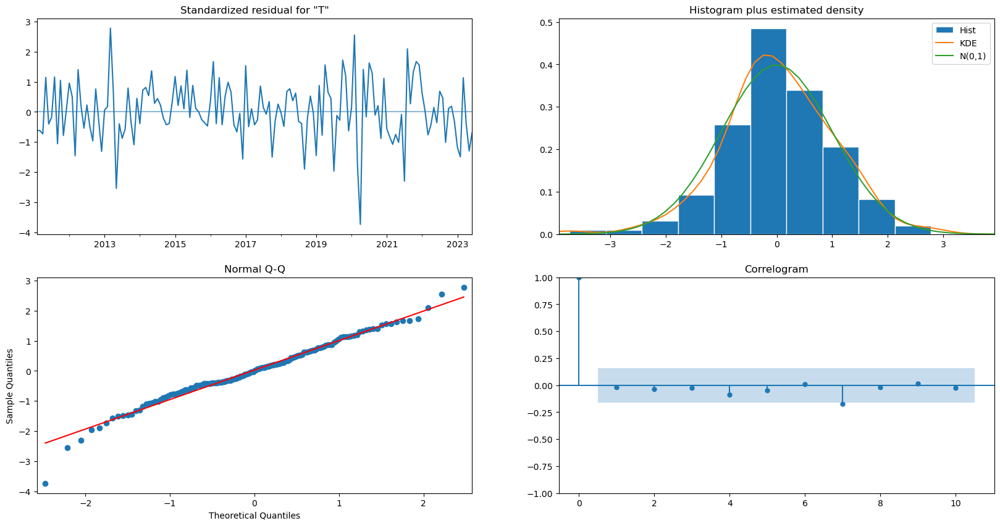

In [315]:
model_15.plot_diagnostics(figsize=(20,10))

In [316]:
forecast_values = model_15.get_forecast(steps=test.shape[0])

In [317]:
forecast_values.predicted_mean

2023-07-01    2328.764760
2023-08-01    2361.672228
2023-09-01    2340.921578
2023-10-01    2502.845346
2023-11-01    2649.156568
2023-12-01    2793.926848
2024-01-01    2764.633158
2024-02-01    2532.100837
2024-03-01    2630.185786
2024-04-01    2373.799057
2024-05-01    2319.330743
2024-06-01    2233.631988
2024-07-01    2295.776925
2024-08-01    2330.297325
2024-09-01    2339.285307
2024-10-01    2512.445052
2024-11-01    2648.195947
2024-12-01    2787.970540
Freq: MS, Name: predicted_mean, dtype: float64

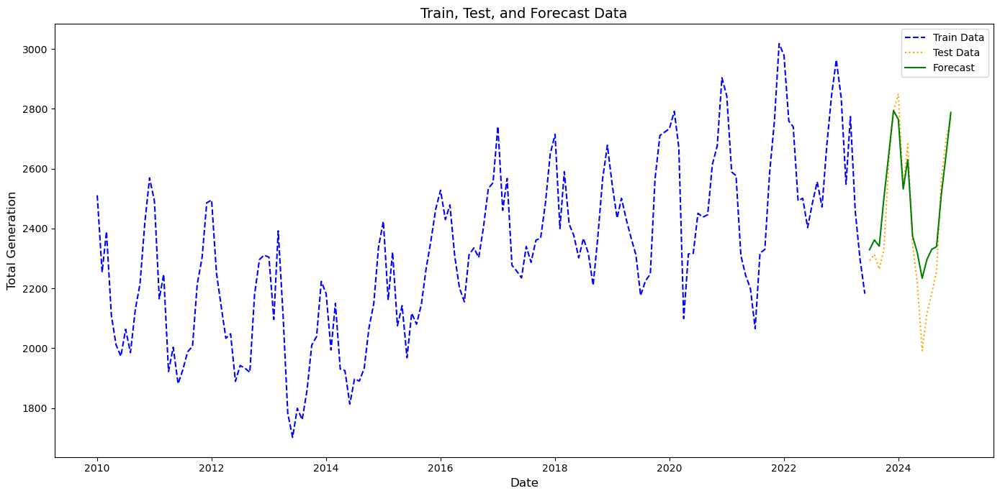

In [318]:
# Plot the training data
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")

# Extract predicted mean values and their corresponding index
forecast_index = forecast_values.predicted_mean.index  # Get the index from the forecast
forecast_mean = forecast_values.predicted_mean  # Get the predicted values

# Plot the forecast data
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot with a tight layout
plt.tight_layout()
plt.show()

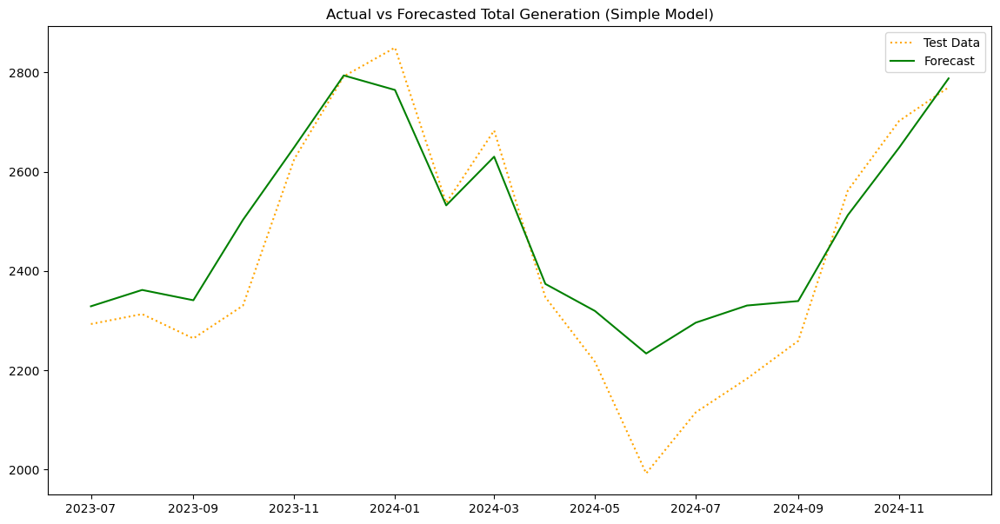

In [319]:
# Plot the results
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(forecast_index, forecast_mean, label="Forecast", color="green", linestyle="-")
plt.legend()
plt.title("Actual vs Forecasted Total Generation (Simple Model)")
plt.show()

In [320]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2_score = r2_score(test["Total_Generation"], forecast_values.predicted_mean) 
mae = mean_absolute_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Total_Generation"], forecast_values.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Total_Generation"] - forecast_values.predicted_mean) / test["Total_Generation"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2_score:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.84
Mean Absolute Error (MAE): 77.99
Mean Squared Error (MSE): 10344.47
Root Mean Squared Error (RMSE): 101.71
Mean Absolute Percentage Error (MAPE): 3.44%


# Exp 2: GridSearchCV - Hyperparameters   &   Results - MINMAX Scaler

# Exp 18.2: MinMax scaler: 

### The GridSearch parameters performance metrics showed results, that were comparatively lower, so tried different parameters: 

In [323]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

#  Step 1: Apply MinMaxScaler to Train & Test Data
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train[["Total_Generation"]])  # Fit & Transform Train Data
test_scaled = scaler.transform(test[["Total_Generation"]])  # Transform Test Data

In [324]:
#  Step 2: Fit the Best SARIMA Model from Grid Search
best_model = SARIMAX(train_scaled, 
                     order=(3,2,2), 
                     seasonal_order=(3, 2, 2, 12), enforce_stationarity=False, 
                     enforce_invertibility=False)
best_results = best_model.fit(disp=0, maxiter=500)

In [325]:
best_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  162
Model:             SARIMAX(3, 2, 2)x(3, 2, 2, 12)   Log Likelihood                  98.809
Date:                            Sat, 12 Apr 2025   AIC                           -175.619
Time:                                    17:13:35   BIC                           -147.297
Sample:                                         0   HQIC                          -164.167
                                            - 162                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6109      0.308     -1.985      0.047      -1.214      -0.008
ar.L2         -0.3881      0.144     -2.703      0.007      -0.670      -0.107
ar.L3         -0.3580      0.132     -2.711      0.007      -0.617      -0.099
ma.L1         -0.7045    470.367     -0.001      0.999    -922.607     921.198
ma.L2         -0.2955    138.986     -0.002      0.998    -272.704     272.113
ar.S.L12      -0.9893      0.330     -2.994      0.003      -1.637      -0.342
ar.S.L24      -0.5857      0.210     -2.794      0.005      -0.997      -0.175
ar.S.L36      -0.3473      0.149     -2.325      0.020      -0.640      -0.055
ma.S.L12      -0.5987      0.383     -1.563      0.118      -1.349       0.152
ma.S.L24      -0.2602      0.464     -0.560      0.575      -1.170       0.650
sigma2         0.0064      2.996      0.002      0.998      -5.866       5.878
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                10.86
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               2.77   Skew:                            -0.45
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.38
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [326]:
#  Step 3: Forecast on Scaled Data
forecast_scaled = best_results.get_forecast(steps=len(test_scaled))

In [327]:
#  Step 4: Inverse Transform Forecasts to Original Scale
forecast_original = scaler.inverse_transform(forecast_scaled.predicted_mean.reshape(-1,1))


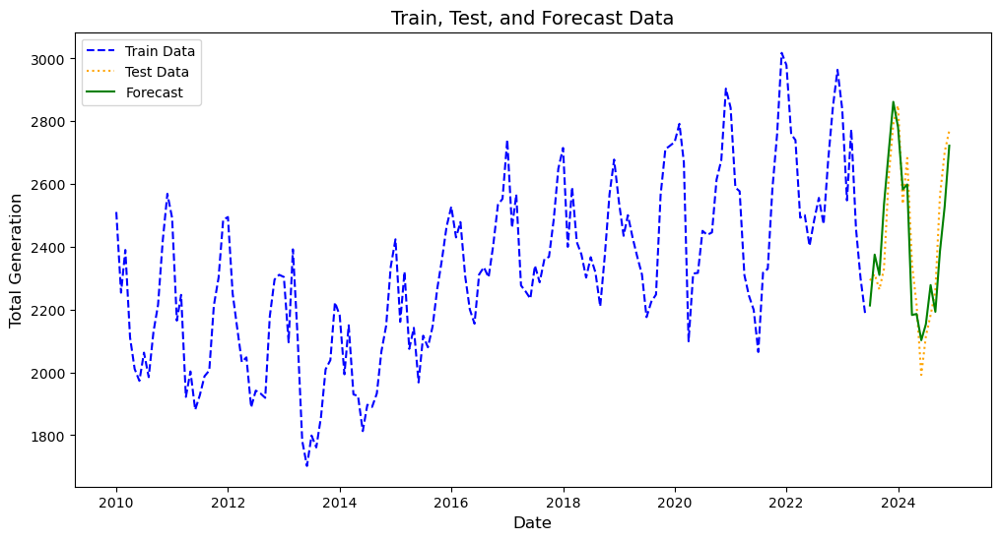

In [328]:
#  Step 6: Plot the Results
plt.figure(figsize=(12,6))
plt.plot(train.index, train["Total_Generation"], label="Train Data", color="blue", linestyle="--")
plt.plot(test.index, test["Total_Generation"], label="Test Data", color="orange", linestyle=":")
plt.plot(test.index, forecast_original, label="Forecast", color="green", linestyle="-")

# Labels & Title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Total Generation", fontsize=12)
plt.title("Train, Test, and Forecast Data", fontsize=14)
plt.legend()
plt.show()

In [329]:
#  Step 5: Performance Evaluation
r2 = r2_score(test["Total_Generation"], forecast_original)
mae = mean_absolute_error(test["Total_Generation"], forecast_original)
mse = mean_squared_error(test["Total_Generation"], forecast_original)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((test["Total_Generation"].values - forecast_original.flatten()) / test["Total_Generation"].values)) * 100

# Print Results
print(f"R2 Score: {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2 Score: 0.83
Mean Absolute Error (MAE): 91.30
Mean Squared Error (MSE): 10987.28
Root Mean Squared Error (RMSE): 104.82
Mean Absolute Percentage Error (MAPE): 3.77%


# GridSearch CV - Hyper parameters results

# Model Performance Analysis – Experiments on AIC, R² Score, RMSE, MAE, and MAPE
A total of 20 experiments were conducted using different parameter configurations, including variations in order and seasonal order. Several experiments incorporated parameters obtained through GridSearchCV for hyperparameter tuning. The initial selection of parameters was based on Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots. Subsequently, statistical test results from the model's summary() were analyzed, including:

1. p-values – To assess the statistical significance of parameters.

2. Ljung-Box test – To detect residual autocorrelation.

3. Jarque-Bera normality test – To evaluate residual normality.

4. Heteroskedasticity test – To check for variance stability in residuals.

5. Kurtosis – To understand the shape and tail behavior of the residual distribution.

Based on the above results, the parameter variations were explored systematically through many experiments. Further, by gradually increasing the order values while keeping seasonal parameters low, followed by adjusting seasonal parameters from low to high.

##### Seasonal Parameter Effects (P & D):

1. Differencing (D) = 0 or D > 3 → High prediction errors and low model scores.

2. Differencing (D = 2) → Lower prediction errors and higher model scores.

3. Seasonal P & Q = 0 → Increased prediction errors and lower model performance.
   
These findings emphasize the significant impact of seasonality on the dataset.   All experiment results were recorded in an Excel file, later converted into a dataframe for further analysis.

### Performance Evaluation & Model Selection
To compare and analyze different parameter configurations, various plots were generated using key performance metrics:

1. R² Score (Model Fit)
2. AIC (Model Complexity & Overfitting Indicator)
3. RMSE, MAE, and MAPE (Error Metrics)

Criteria for Selecting the Top Five Models
1. High R² Score → Ensures a strong fit to the data.
2. Low AIC → Reduces the risk of overfitting.
3. Low MAE, RMSE, and MAPE → Indicates minimal prediction errors.

By systematically analyzing these metrics, the most effective models were identified for forecasting while maintaining a balance between model accuracy and complexity.

# Dataframe of the Performances of 20 Experiments

In [333]:
performance_exp_df = pd.read_excel("Performance_Experiments.xlsx")
performance_exp_df

,Experiments,Parameters,AIC,(Ljung-Box (L1) Prob(Q),Jarque-Bera: Prob (JB),Heteroskedasticity Prob(H),Kurtosis,Skew,R2_Score,MAE,RMSE,MAPE,Approach
0,2.0,"(1,1,1,1)(1,1,12)",1791.870,0.85,0.00,0.02,4.95,-0.51,0.71,100.58,136.02,4.49,NaN
1,3.0,"(1,1,1)(0,0,0,12)",2078.991,0.76,0.42,0.29,3.19,-0.24,-0.88,268.16,344.01,10.31,NaN
2,4.0,"(1,2,1)(0,0,0,12)",2080.012,0.85,0.01,0.48,3.30,-0.61,-1.10,288.24,363.68,11.10,NaN
3,5.0,"(1,1,1)(1,1,1,6)",1937.545,0.94,0.00,0.02,5.32,-0.58,0.61,129.35,155.89,5.60,NaN
4,6.0,"(1,2,0)(1,1,0,6)",2032.383,0.02,0.00,0.12,4.31,0.12,-52.95,1559.21,1841.17,63.84,NaN
5,7.0,"(2,1,0)(1,1,1,6)",1948.493,0.83,0.01,0.16,3.85,-0.38,0.66,116.85,145.67,4.80,NaN
6,8.0,"(3,1,0)(1,1,1,12)",1792.626,0.97,0.00,0.03,4.35,-0.34,0.83,78.53,103.39,3.46,NaN
7,9.0,"(4,1,0)(0,1,0,12)",1852.147,0.98,0.00,0.04,4.38,-0.24,0.81,97.21,109.11,3.99,NaN
8,10.0,"(7,1,0)(0,1,0,12)",1857.204,0.96,0.00,0.03,4.31,-0.23,0.82,95.91,107.41,3.95,NaN
9,11.0,"(5,1,0)(0,1,0,12)",722.899,1.00,0.00,0.10,4.50,-0.20,0.80,98.56,112.04,4.03,BoxCox Transformation


In [334]:
performance_exp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Experiments                 19 non-null     float64
 1   Parameters                  19 non-null     object 
 2   AIC                         19 non-null     float64
 3   (Ljung-Box (L1) Prob(Q)     19 non-null     float64
 4   Jarque-Bera: Prob (JB)      19 non-null     float64
 5   Heteroskedasticity Prob(H)  19 non-null     float64
 6   Kurtosis                    19 non-null     float64
 7   Skew                        19 non-null     float64
 8   R2_Score                    19 non-null     float64
 9   MAE                         19 non-null     float64
 10  RMSE                        19 non-null     float64
 11  MAPE                        19 non-null     float64
 12  Approach                    7 non-null      object 
dtypes: float64(11), object(2)
memory usag

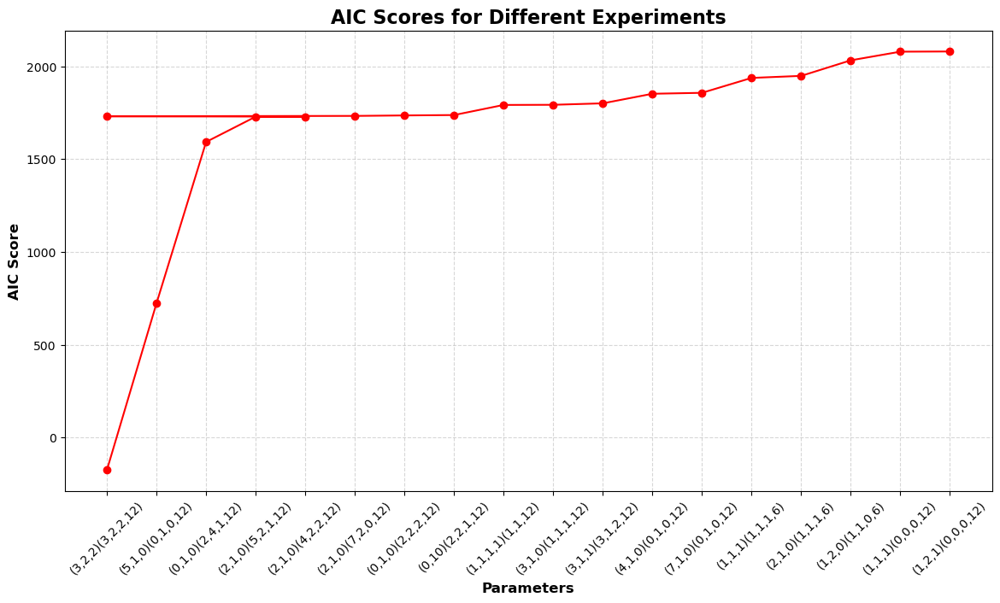

In [335]:
sorted_values = performance_exp_df.sort_values(by = "AIC")

plt.figure(figsize=(14, 7))
plt.plot(sorted_values["Parameters"], sorted_values["AIC"], marker="o", linestyle="-", color="red")

plt.title("AIC Scores for Different Experiments", fontsize=16, weight="bold")
plt.xlabel("Parameters", fontsize=12, weight="bold")
plt.ylabel("AIC Score", fontsize=12, weight="bold")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

### Top 10 Experiments with Parameters for AIC:


In [337]:
aic_sorted_values = performance_exp_df.sort_values(by = "AIC")
aic_sorted_values[["Experiments", "Parameters", "AIC"]].head(10)

,Experiments,Parameters,AIC
17,18.2,"(3,2,2)(3,2,2,12)",-175.619
9,11.0,"(5,1,0)(0,1,0,12)",722.899
10,12.0,"(0,1,0)(2,4,1,12)",1592.429
13,15.0,"(2,1,0)(5,2,1,12)",1728.700
14,16.0,"(2,1,0)(4,2,2,12)",1728.855
16,18.1,"(3,2,2)(3,2,2,12)",1730.796
12,14.0,"(2,1,0)(7,2,0,12)",1732.761
15,17.0,"(0,1,0)(2,2,2,12)",1735.299
11,13.0,"(0,10)(2,2,1,12)",1737.415
0,2.0,"(1,1,1,1)(1,1,12)",1791.870


### R2_Scores percentage - Parameters

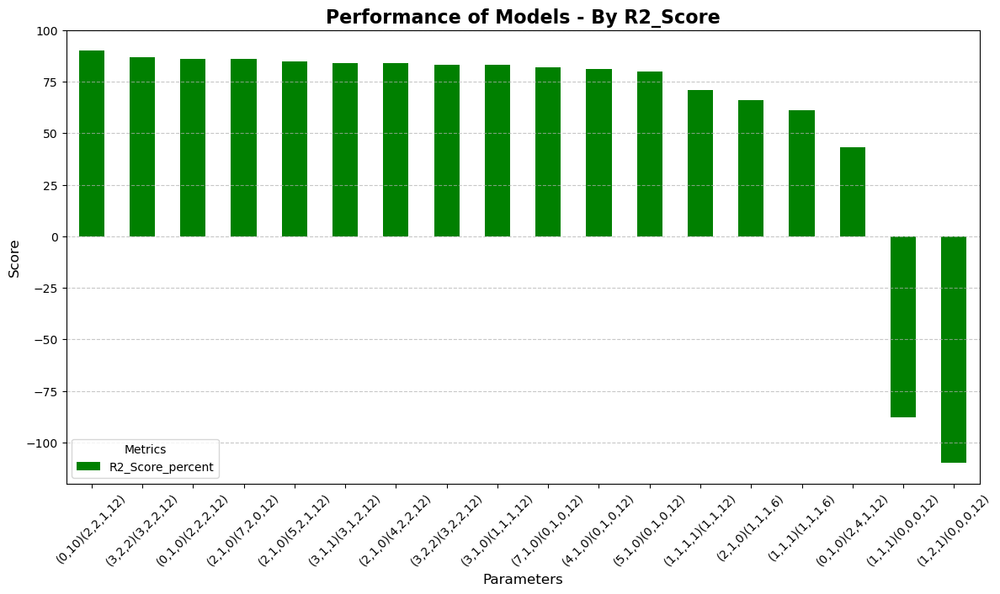

In [339]:
# Converting the R2_Scores into percentages:
performance_exp_df["R2_Score_percent"] = performance_exp_df["R2_Score"]*100

# Eliminating the extreme lowest R2_Score:
new_data = performance_exp_df[performance_exp_df["Experiments"]!= 6.0]

df = new_data.sort_values(by ="R2_Score_percent", ascending=False)

# Set figure size

# Plot bar chart for multiple metrics
df.set_index("Parameters")["R2_Score_percent"].plot(kind="bar", figsize=(14, 7), color="green")

# Labels and title
plt.title("Performance of Models - By R2_Score", fontsize=16, weight="bold")
plt.ylabel("Score", fontsize=12)
plt.xlabel("Parameters", fontsize=12)
plt.legend(title="Metrics", loc="lower left")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.xticks(rotation=45)
plt.show()

### Top 10 Experiments with Parameters by R2_Score:

In [341]:
df = new_data.sort_values(by ="R2_Score_percent", ascending=False)
df[["Experiments", "Parameters", "R2_Score_percent"]].head(10)

,Experiments,Parameters,R2_Score_percent
11,13.0,"(0,10)(2,2,1,12)",90.0
16,18.1,"(3,2,2)(3,2,2,12)",87.0
15,17.0,"(0,1,0)(2,2,2,12)",86.0
12,14.0,"(2,1,0)(7,2,0,12)",86.0
13,15.0,"(2,1,0)(5,2,1,12)",85.0
18,19.0,"(3,1,1)(3,1,2,12)",84.0
14,16.0,"(2,1,0)(4,2,2,12)",84.0
17,18.2,"(3,2,2)(3,2,2,12)",83.0
6,8.0,"(3,1,0)(1,1,1,12)",83.0
8,10.0,"(7,1,0)(0,1,0,12)",82.0


#### RMSE Scores

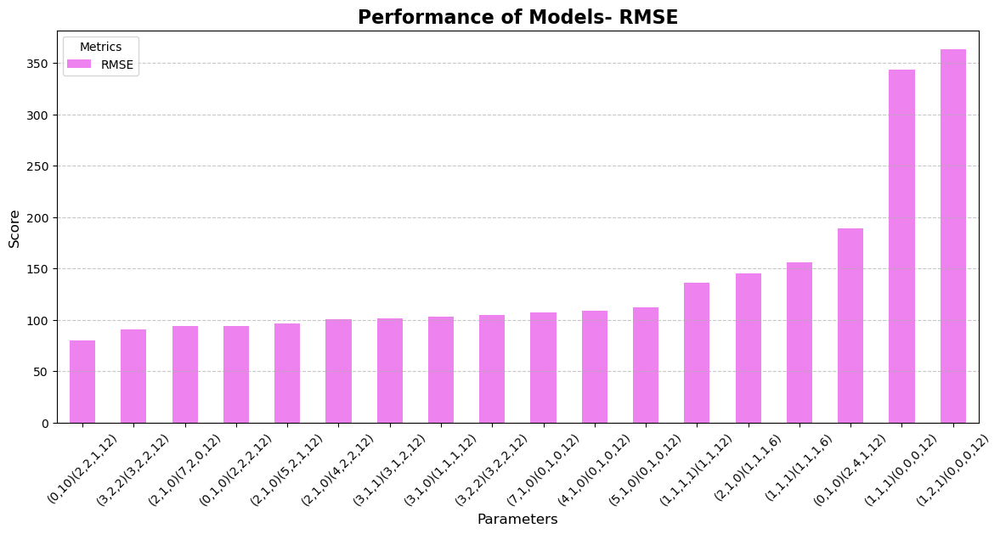

In [343]:
df_rmse = new_data.sort_values(by = "RMSE")
# Set figure size
plt.figure(figsize=(12, 6))

# Plot bar chart for multiple metrics
df_rmse.set_index("Parameters")["RMSE"].plot(kind="bar", figsize=(14, 6), color="violet")

# Labels and title
plt.title("Performance of Models- RMSE", fontsize=16, weight="bold")
plt.ylabel("Score", fontsize=12)
plt.xlabel("Parameters", fontsize=12)
plt.legend(title="Metrics", loc="upper left")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.xticks(rotation=45)
plt.show()

### Top 10 Experiments with Parameters by RMSE:

In [345]:
df_rmse = new_data.sort_values(by = "RMSE", ascending=True)
df_rmse[["Experiments", "Parameters", "RMSE"]].head(10)


,Experiments,Parameters,RMSE
11,13.0,"(0,10)(2,2,1,12)",80.32
16,18.1,"(3,2,2)(3,2,2,12)",90.87
12,14.0,"(2,1,0)(7,2,0,12)",93.65
15,17.0,"(0,1,0)(2,2,2,12)",93.67
13,15.0,"(2,1,0)(5,2,1,12)",96.72
14,16.0,"(2,1,0)(4,2,2,12)",100.63
18,19.0,"(3,1,1)(3,1,2,12)",101.71
6,8.0,"(3,1,0)(1,1,1,12)",103.39
17,18.2,"(3,2,2)(3,2,2,12)",104.82
8,10.0,"(7,1,0)(0,1,0,12)",107.41


#### MAPE Scores

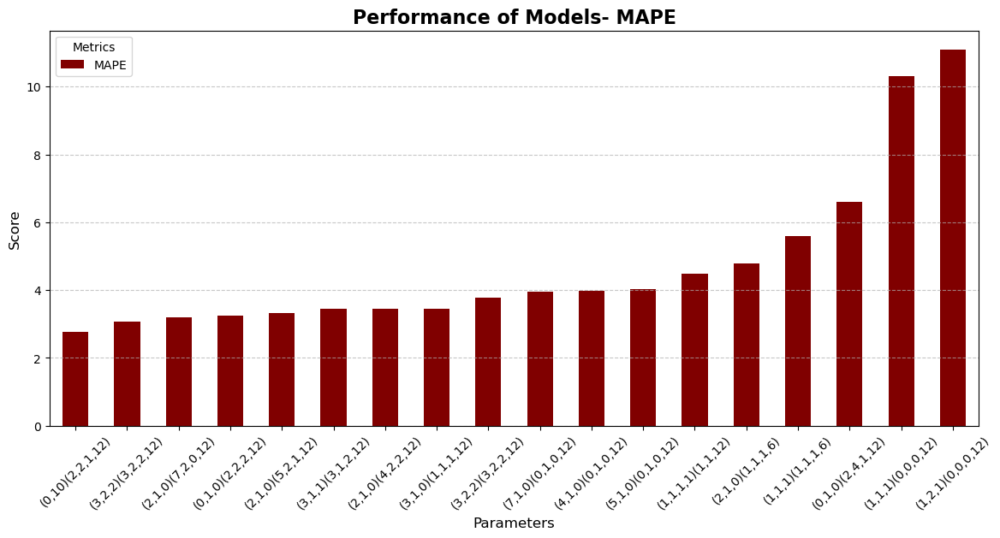

In [347]:
df_mape = new_data.sort_values(by = "MAPE")
# Set figure size
plt.figure(figsize=(12, 6))

# Plot bar chart for multiple metrics
df_mape.set_index("Parameters")["MAPE"].plot(kind="bar", figsize=(14, 6), color="maroon")

# Labels and title
plt.title("Performance of Models- MAPE", fontsize=16, weight="bold")
plt.ylabel("Score", fontsize=12)
plt.xlabel("Parameters", fontsize=12)
plt.legend(title="Metrics", loc="upper left")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.xticks(rotation=45)
plt.show()

#### Top 10 MAPE Scores

In [349]:
df_mape = new_data.sort_values(by = "MAPE", ascending=True)
df_mape[["Experiments", "Parameters", "MAPE"]].head(10)

,Experiments,Parameters,MAPE
11,13.0,"(0,10)(2,2,1,12)",2.78
16,18.1,"(3,2,2)(3,2,2,12)",3.08
12,14.0,"(2,1,0)(7,2,0,12)",3.20
15,17.0,"(0,1,0)(2,2,2,12)",3.24
13,15.0,"(2,1,0)(5,2,1,12)",3.32
18,19.0,"(3,1,1)(3,1,2,12)",3.44
14,16.0,"(2,1,0)(4,2,2,12)",3.45
6,8.0,"(3,1,0)(1,1,1,12)",3.46
17,18.2,"(3,2,2)(3,2,2,12)",3.77
8,10.0,"(7,1,0)(0,1,0,12)",3.95


In [350]:
new_data = performance_exp_df[performance_exp_df["Experiments"]!= 6.0]

In [351]:
import plotly.express as px


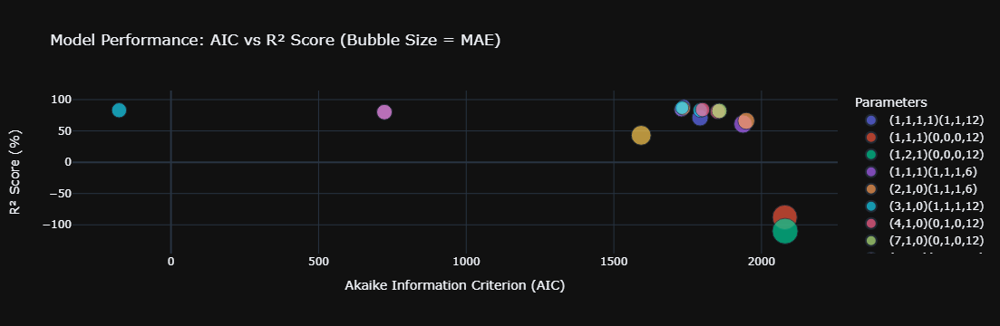

In [352]:
fig = px.scatter(
    new_data,
    x="AIC",
    y="R2_Score_percent",
    size="MAPE",  # Bubble size represents error
    color="Parameters",
    hover_data=["Parameters", "RMSE", "MAPE", "MAE"],
    title="Model Performance: AIC vs R² Score (Bubble Size = MAE)",
    labels={"AIC": "Akaike Information Criterion (AIC)", "R2_Score_percent": "R² Score (%)"},
    template="plotly_dark"
)
fig.show()

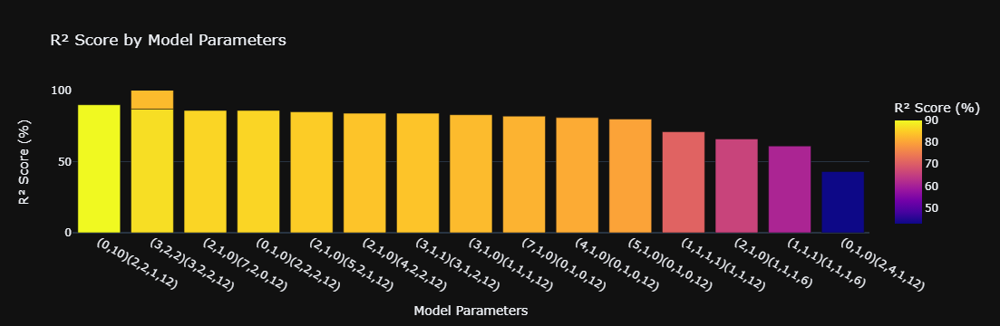

In [353]:
plot_data=performance_exp_df[performance_exp_df["R2_Score_percent"] > 0]
data=plot_data.sort_values(by = "R2_Score_percent", ascending=False)

# Create the bar plot
fig = px.bar(
    data,
    x="Parameters",  
    y="R2_Score_percent",  
    color="R2_Score_percent",  
    title="R² Score by Model Parameters",
    labels={"R2_Score_percent": "R² Score (%)", "Parameters": "Model Parameters"},
    hover_data=["Experiments", "AIC", "MAE", "RMSE", "MAPE"],  
    template="plotly_dark"
)

# Set y-axis range from 0 to 100
fig.update_layout(yaxis=dict(range=[0, 100]))

# Show the plot
fig.show()

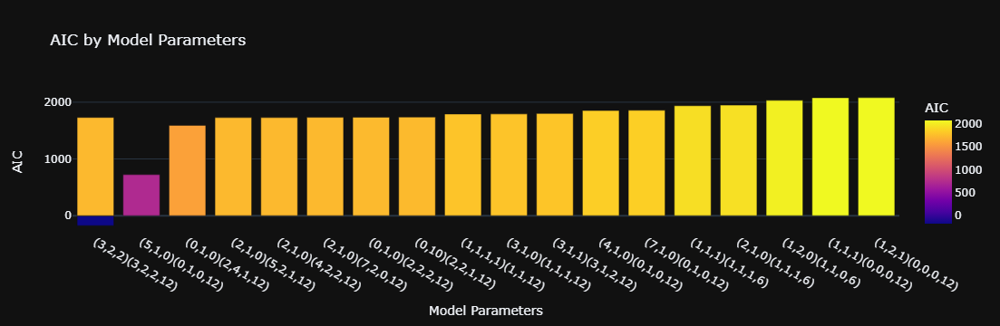

In [354]:
data=performance_exp_df.sort_values(by = "AIC", ascending=True)

# Create the bar plot
fig = px.bar(
    data,
    x="Parameters",  
    y="AIC",  
    color="AIC",  
    title="AIC by Model Parameters",
    labels={"AIC": "AIC", "Parameters": "Model Parameters"},
    hover_data=["Experiments", "AIC", "R2_Score_percent", "MAE", "RMSE", "MAPE"],  
    template="plotly_dark"
)

# Set y-axis range from 0 to 100
#fig.update_layout(yaxis=dict(range=[0, 100]))

# Show the plot
fig.show()

# Conclusion: Selecting the Top 5 Models for Forecasting

### Best Forecasting Models: Key Selection Criteria
The best forecasting models were selected based on the following performance metrics:

1. High R² Score – Ensures a strong fit to the data.
2. Low AIC – Indicates model simplicity and reduces the risk of overfitting.
3. Low RMSE – Represents lower prediction error, ensuring stability.
4. Low MAPE – Reflects high forecasting accuracy.

### Model Comparison: Experiment 18.1 vs. Experiment 18.2
Upon analysis of various experiments, most of the top-performing models exhibited similar characteristics. Two models were experimented with the same parameters and differentiated with scaling. Experiment 18.1 (No Scaling) and Experiment 18.2 (MinMax Scaler Applied) were compared to assess the impact of scaling.

##### Experiment 18.2 (Scaled):

1. AIC = -175.619 (Lowest AIC, indicating better model simplicity)
2. R² = 83% (Good, but lower than 18.1)
3. MAPE = 3.77% (Slightly higher error compared to 18.1)

##### Experiment 18.1 (Unscaled):

1. AIC = 1730.796 (Higher AIC, but still reasonable)
2. R² = 87% (Better fit to data)
3. MAPE = 3.08% (Lower error, indicating better forecasting accuracy)

### Conclusion
While scaling (MinMax Scaler) improved model simplicity by lowering AIC, it slightly reduced the model’s R² and increased the MAPE, which are key indicators of fit and accuracy. Therefore, the choice between these models depends on the desired balance between interpretability and predictive performance.

AIC should not be directly compared between scaled and unscaled models. The drastic AIC difference (from -175 to 1730) suggests that factors other than scaling, such as preprocessing or loss functions, may also have contributed to this discrepancy. As a result, Experiment 18.2 is excluded from the final top 5 models, and the next best-performing model is chosen.

### Experiment 13 (Parameters: (0,10)(2,2,1,12))

1. R² Score: 90% (Highest)
2. Lowest RMSE: 80.32
3. Lowest MAPE: 2.78
4. AIC: 1737.415 (Higher, but acceptable given the strong fit and accuracy)
##### Conclusion: This model provides the most accurate predictions and the best fit.

### Experiment 18.1 (Parameters: (3,2,2)(3,2,2,12))

1. R² Score: 87%
2. 2nd Lowest RMSE: 90.87
3. 2nd Lowest MAPE: 3.08
4. AIC: 1730.796 (Relatively low, in comparison with the rest of the models)
##### Conclusion: This model is also highly accurate and generalizable.

### Experiment 14 (Parameters: (2,1,0)(7,2,0,12))

1. R² Score: 86%
2. 3rd Lowest RMSE: 93.65
3. 3rd Lowest MAPE: 3.20
4. AIC: 1732.761 (Relatively low)
##### Conclusion: Another strong candidate with balanced accuracy and fit.

### Experiment 17 (Parameters: (0,1,0)(2,2,2,12))

1. R² Score: 86%
2. RMSE: 93.67
3. MAPE: 3.24
4. AIC: 1735.299 
##### Conclusion: Despite slightly higher RMSE/MAPE, indicating lower complexity.

### Experiment 15 (Parameters: (2,1,0)(5,2,1,12))

1. R² Score: 85%
2. RMSE: 96.72
3. MAPE: 3.32
4. AIC: 1728.700 (Good balance)
##### Conclusion: Well-balanced model with relatively low errors.

## Final Selection:
The top 5 models for forecasting are Experiments 13, 18.1, 14, 17, and 15, as they provide the best balance between accuracy, fit, and complexity.

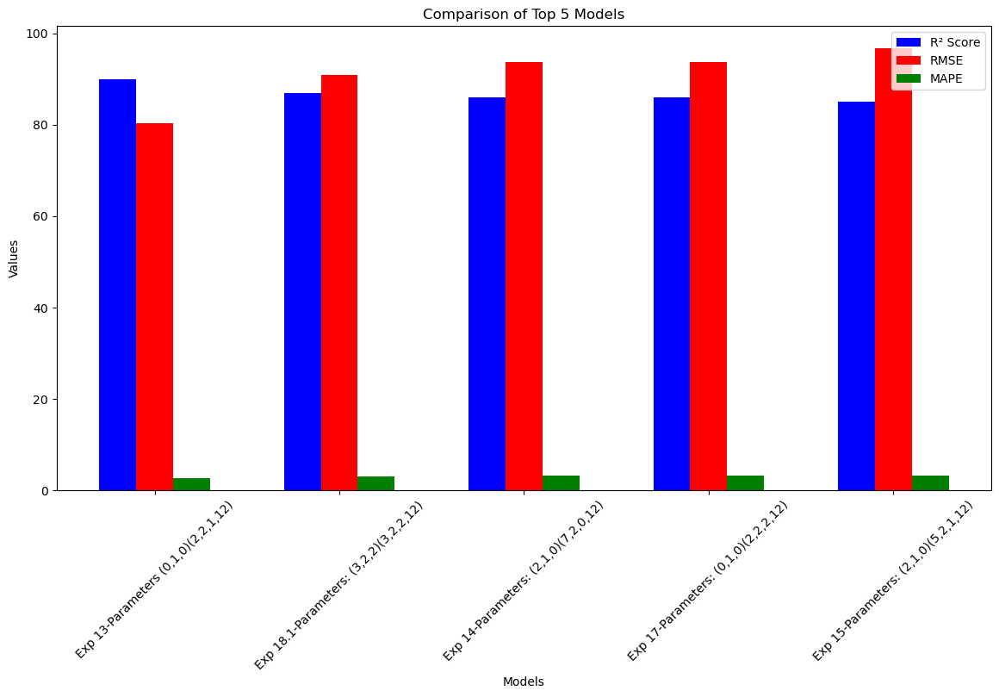

In [356]:
# Model Names
models = ["Exp 13-Parameters (0,1,0)(2,2,1,12)", "Exp 18.1-Parameters: (3,2,2)(3,2,2,12)", "Exp 14-Parameters: (2,1,0)(7,2,0,12)", "Exp 17-Parameters: (0,1,0)(2,2,2,12)", 
          "Exp 15-Parameters: (2,1,0)(5,2,1,12)"]

# Performance Metrics
r2_scores = [90, 87, 86, 86, 85]
rmse = [80.32, 90.87, 93.65, 93.67, 96.72]
mape = [2.78, 3.08, 3.20, 3.24, 3.32]
aic = [1737.415, 1730.796, 1732.761, 1735.299, 1728.700]

# Plot Bar Chart
x = np.arange(len(models))
width = 0.2  

fig, ax = plt.subplots(figsize=(14, 7))
ax.bar(x - width, r2_scores, width, label="R² Score", color="blue")
ax.bar(x, rmse, width, label="RMSE", color="red")
ax.bar(x + width, mape, width, label="MAPE", color="green")

# Labels and Formatting
ax.set_xlabel("Models")
ax.set_ylabel("Values")
ax.set_title("Comparison of Top 5 Models")
ax.set_xticks(x)
ax.set_xticklabels(models, rotation=45)
ax.legend()

plt.show()

# Experiment 21 "Wind":

<Figure size 1400x400 with 0 Axes>

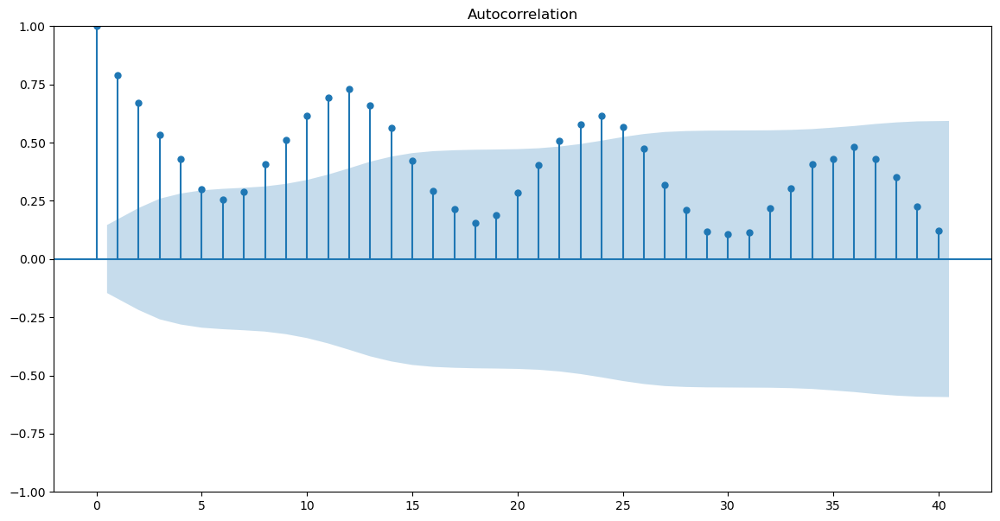

In [358]:
ax = plt.figure(figsize=(14,4))
plot_acf(electricity_df["Wind"], lags=40);

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



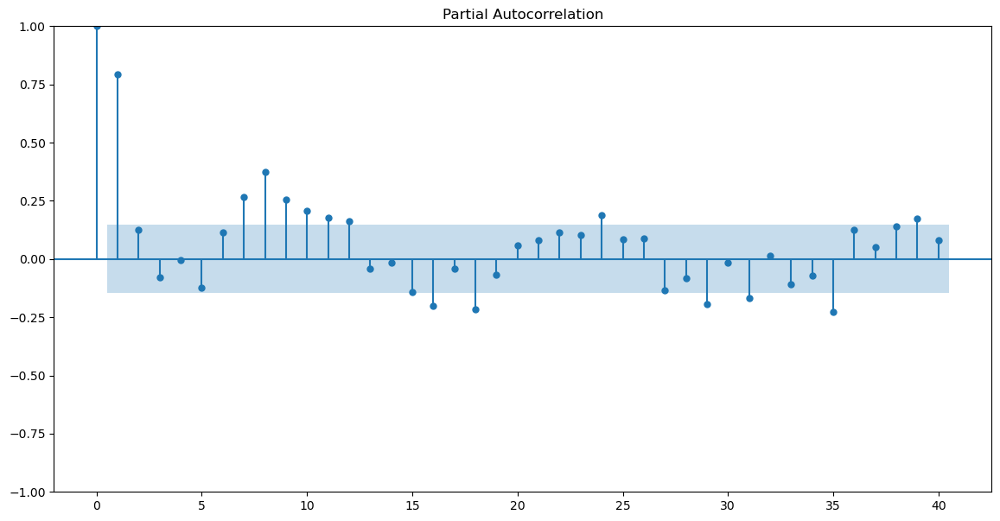

In [359]:
plot_pacf(electricity_df["Wind"], lags=40);

Plot ACF is exponential decay and plot PACF lag 1 is significant, shows AR(1) model.Seasonality present at 12, 24 lags etc..Significant lags are present at other periods in PACF shows that even after removal of the intermediate effects, the past values influence the present values.
So, experimenting AR(1) and MA(0) with seasonality elements and differencing
# Next step: Checking for stationarity

In [361]:
adf_test = adfuller(electricity_df["Wind"].dropna())
print(f"Test Statistic: {adf_test[0]}, p_value : {adf_test[1]}")
if adf_test[1] > 0.05:
    print(f"The p_value is {adf_test[1]} and > 0.05, so the Wind series is not stationary.")
else:
    print(f"The p_value is {adf_test[1]} and < 0.05, so the Wind series is stationary.")

Test Statistic: -1.1085978662881262, p_value : 0.7116310242681545
The p_value is 0.7116310242681545 and > 0.05, so the Wind series is not stationary.


### Diff(1)

In [363]:
adf_test = adfuller(electricity_df["Wind"].diff(1).dropna())
print(f"Test Statistic: {adf_test[0]}, p_value : {adf_test[1]}")
if adf_test[1] > 0.05:
    print(f"The p_value is {adf_test[1]} and > 0.05, so the Wind series is not stationary.")
else:
    print(f"The p_value is {adf_test[1]} and < 0.05, so the Wind series is stationary.")

Test Statistic: -8.896228117090796, p_value : 1.2048935925867329e-14
The p_value is 1.2048935925867329e-14 and < 0.05, so the Wind series is stationary.


#### Diff(12)

In [365]:
adf_test = adfuller(electricity_df["Wind"].diff(12).dropna())
print(f"Test Statistic: {adf_test[0]}, p_value : {adf_test[1]}")
if adf_test[1] > 0.05:
    print(f"The p_value is {adf_test[1]} and > 0.05, so the Wind series is not stationary after diff(12).")
else:
    print(f"The p_value is {adf_test[1]} and < 0.05, so the Wind series is stationary after diff(12).")

Test Statistic: -5.374022324250722, p_value : 3.839783807821441e-06
The p_value is 3.839783807821441e-06 and < 0.05, so the Wind series is stationary after diff(12).


### After Differencing 1 and 12, the Wind is stationary

<Axes: title={'center': 'Wind - Differenced'}, xlabel='Period'>

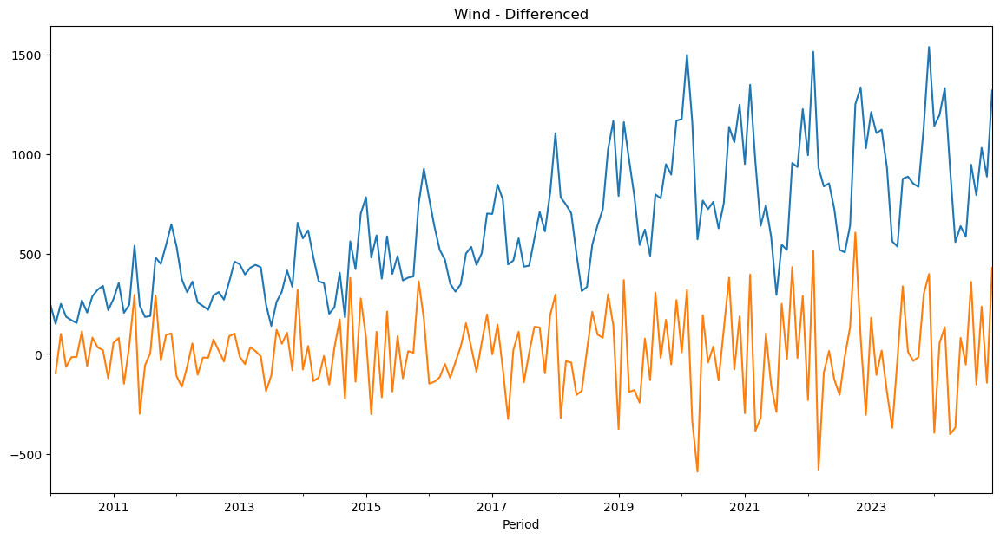

In [367]:
electricity_df["Wind"].plot(title="Wind - Original")
electricity_df["Wind"].diff(1).plot(title="Wind - Differenced")

## Auto_Arima method
To identify the best parameters for the model

In [369]:
import pmdarima as pm

model = pm.auto_arima(
    electricity_df["Wind"],
    start_p=0, start_q=0,
    max_p=3, max_q=3,
    start_P=0, start_Q=0,
    max_P=3, max_Q=3,
    start_d=0, start_D=0,
    max_d=3, max_D=3,
#    d=1,          # from ADF
#    D=1,          # from seasonal ADF
    m=12,         # seasonal period
    seasonal=True,
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True
)


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWa

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2414.886, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2388.604, Time=0.43 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2393.194, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2413.040, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2409.525, Time=0.16 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=2380.272, Time=1.91 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(3,0,0)[12] intercept   : AIC=2376.120, Time=1.84 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(3,0,1)[12] intercept   : AIC=2376.518, Time=4.27 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=2374.728, Time=1.95 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2372.755, Time=0.68 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2396.101, Time=0.29 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=2374.725, Time=1.89 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=2389.791, Time=0.86 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.94 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2393.566, Time=0.56 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=2360.886, Time=1.88 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=2396.545, Time=0.57 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=2384.625, Time=0.53 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=2362.673, Time=3.99 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(1,0,2)[12] intercept   : AIC=2362.649, Time=2.39 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=2411.527, Time=0.08 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(0,0,2)[12] intercept   : AIC=2387.552, Time=0.81 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=2370.099, Time=1.37 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.09 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(1,0,1)[12] intercept   : AIC=2347.295, Time=0.94 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(0,0,1)[12] intercept   : AIC=2396.134, Time=0.89 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=2378.443, Time=0.54 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(2,0,1)[12] intercept   : AIC=2348.829, Time=3.23 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(1,0,2)[12] intercept   : AIC=2348.763, Time=3.31 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=2412.589, Time=0.22 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(0,0,2)[12] intercept   : AIC=2385.537, Time=1.44 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(2,0,0)[12] intercept   : AIC=2357.524, Time=2.04 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.07 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.25 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(1,0,1)[12]             : AIC=2345.331, Time=0.61 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(0,0,1)[12]             : AIC=2394.299, Time=0.28 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(1,0,0)[12]             : AIC=2376.503, Time=0.22 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(2,0,1)[12]             : AIC=2346.865, Time=2.15 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(1,0,2)[12]             : AIC=2346.799, Time=2.04 sec
 ARIMA(3,1,0)(0,0,0)[12]             : AIC=2410.822, Time=0.11 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(0,0,2)[12]             : AIC=2383.701, Time=1.19 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(2,0,0)[12]             : AIC=2355.557, Time=1.18 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(2,0,2)[12]             : AIC=inf, Time=2.61 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(1,0,1)[12]             : AIC=2358.921, Time=0.67 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(1,0,1)[12]             : AIC=2330.490, Time=1.91 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(0,0,1)[12]             : AIC=2371.189, Time=1.17 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(1,0,0)[12]             : AIC=2357.835, Time=1.22 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(2,0,1)[12]             : AIC=2332.252, Time=5.05 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(1,0,2)[12]             : AIC=2332.209, Time=3.19 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(0,0,0)[12]             : AIC=2384.916, Time=0.36 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(0,0,2)[12]             : AIC=2362.978, Time=2.25 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(2,0,0)[12]             : AIC=2341.038, Time=2.11 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(2,0,2)[12]             : AIC=inf, Time=nan sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(1,0,1)[12]             : AIC=2328.527, Time=0.63 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(0,0,1)[12]             : AIC=2371.267, Time=0.58 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(1,0,0)[12]             : AIC=2355.866, Time=0.46 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(2,0,1)[12]             : AIC=2330.285, Time=2.06 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(1,0,2)[12]             : AIC=2330.245, Time=2.22 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(0,0,0)[12]             : AIC=2389.885, Time=0.30 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(0,0,2)[12]             : AIC=2361.435, Time=1.69 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(2,0,0)[12]             : AIC=2339.162, Time=1.75 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(2,0,2)[12]             : AIC=inf, Time=4.03 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(1,0,1)[12]             : AIC=2326.648, Time=0.56 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(0,0,1)[12]             : AIC=2369.650, Time=0.44 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(1,0,0)[12]             : AIC=2354.136, Time=0.31 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(2,0,1)[12]             : AIC=2328.439, Time=2.10 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(1,0,2)[12]             : AIC=2328.407, Time=2.53 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(0,0,0)[12]             : AIC=2409.727, Time=0.29 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(0,0,2)[12]             : AIC=2359.866, Time=1.09 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(2,0,0)[12]             : AIC=2337.166, Time=1.45 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,1)(2,0,2)[12]             : AIC=inf, Time=5.58 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,1)(1,0,1)[12]             : AIC=2330.834, Time=0.57 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(1,0,1)[12]             : AIC=2370.792, Time=0.54 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,2)(1,0,1)[12]             : AIC=inf, Time=1.26 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,0)(1,0,1)[12]             : AIC=2391.600, Time=0.31 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(1,0,1)[12]             : AIC=2326.617, Time=0.55 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(0,0,1)[12]             : AIC=2379.531, Time=0.33 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(1,0,0)[12]             : AIC=2356.021, Time=0.28 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(2,0,1)[12]             : AIC=2328.350, Time=2.28 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(1,0,2)[12]             : AIC=2328.306, Time=1.71 sec
 ARIMA(0,1,2)(0,0,0)[12]             : AIC=2409.764, Time=0.09 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(0,0,2)[12]             : AIC=2365.319, Time=1.24 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(2,0,0)[12]             : AIC=2337.341, Time=0.93 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(2,0,2)[12]             : AIC=inf, Time=4.53 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,3)(1,0,1)[12]             : AIC=2328.506, Time=0.71 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,3)(1,0,1)[12]             : AIC=2330.548, Time=0.78 sec


C:\Users\selvi\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec

Best model:  ARIMA(0,1,2)(1,0,1)[12]          
Total fit time: 127.816 seconds


In [370]:
model_21 = SARIMAX(train["Wind"], order=(0,1,2), seasonal_order=(1,0,1,12)).fit()
model_21.summary()

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                 Wind   No. Observations:                  162
Model:             SARIMAX(0, 1, 2)x(1, 0, [1], 12)   Log Likelihood               -1037.559
Date:                              Sat, 12 Apr 2025   AIC                           2085.117
Time:                                      17:15:56   BIC                           2100.524
Sample:                                  01-01-2010   HQIC                          2091.373
                                       - 06-01-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7172      0.079     -9.055      0.000      -0.872      -0.562
ma.L2         -0.1781      0.077     -2.305      0.021      -0.329      -0.027
ar.S.L12       0.9407      0.056     16.866      0.000       0.831       1.050
ma.S.L12      -0.6126      0.123     -4.987      0.000      -0.853      -0.372
sigma2      2.149e+04   2569.943      8.364      0.000    1.65e+04    2.65e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 0.35
Prob(Q):                              0.90   Prob(JB):                         0.84
Heteroskedasticity (H):               3.09   Skew:                             0.10
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Residual analysis:
1. AIC: 2085.117 : score best obtained using the Auto_Arima method
1. Ljung Box Test - No autocorrelation (>0.05)
2. Jargque Bera : Normality (>0.05)
3. Heteroscedasticity: variance is changing and not constant(0.00)
4. Kurtosis: is present

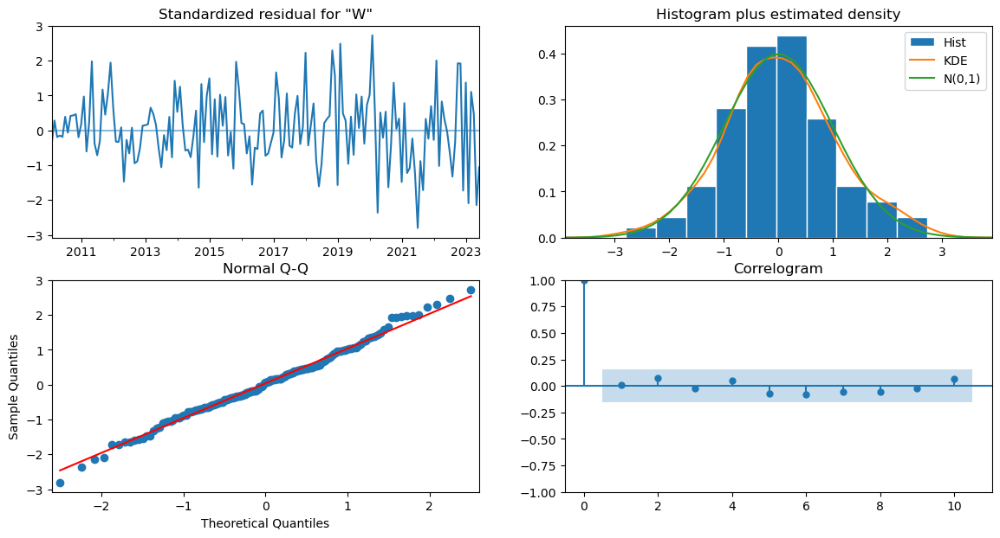

In [372]:
model_21.plot_diagnostics();

#### Forecast for test set

In [374]:

forecast_values_model_21 = model_21.get_forecast(steps=len(test))  
forecast_mean_model_21 = forecast_values_model_21.predicted_mean  # Extract predicted values
forecast_ci_model_21 = forecast_values_model_21.conf_int()  # Extract confidence intervals


#### Forecast for future 24 months


In [376]:
# Forecast for future 24 months
forecast_future_model_21 = model_21.get_forecast(steps=24)  
forecast_future_mean_model_21 = forecast_future_model_21.predicted_mean  # Extract future predicted values
forecast_future_ci_model_21 = forecast_future_model_21.conf_int()  # Extract confidence intervals for future

# Identify the last test forecast date
last_forecast_date = forecast_mean_model_21.index[-1]  

# Create proper future dates that start **right after** last test forecast date
future_dates = pd.date_range(start=last_forecast_date + pd.DateOffset(months=1), periods=24, freq="MS")

# Assign the corrected index
forecast_future_mean_model_21.index = future_dates
forecast_future_ci_model_21.index = future_dates

#### Plot everything


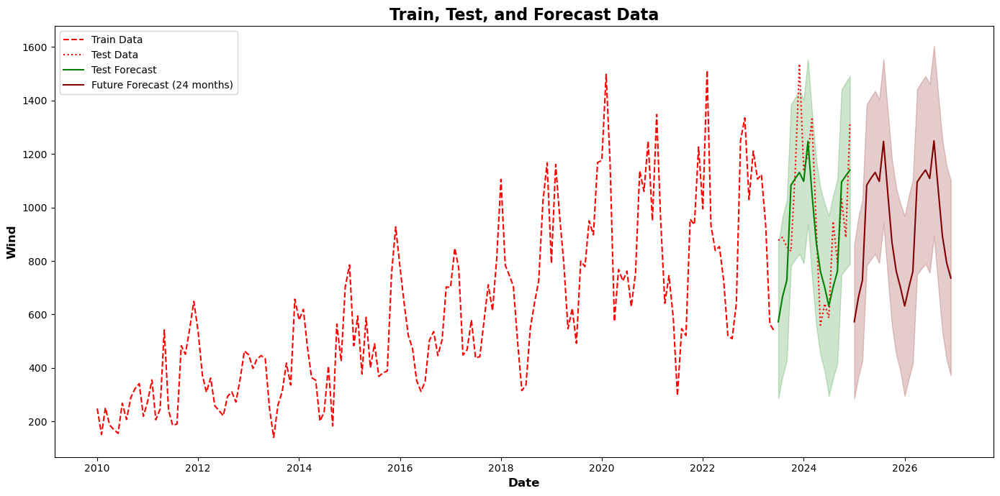

In [378]:

plt.figure(figsize=(14, 7))

# Plot training data
plt.plot(train.index, train["Wind"], label="Train Data", color="red", linestyle="--")

# Plot test data
plt.plot(test.index, test["Wind"], label="Test Data", color="red", linestyle=":")

# Plot test forecast
plt.plot(forecast_mean_model_21.index, forecast_mean_model_21, label="Test Forecast", color="green", linestyle="-")

# Plot future forecast
plt.plot(forecast_future_mean_model_21.index, forecast_future_mean_model_21, label="Future Forecast (24 months)", color="maroon", linestyle="-")

# Add confidence intervals for test forecast
plt.fill_between(forecast_ci_model_21.index, forecast_ci_model_21.iloc[:, 0], forecast_ci_model_21.iloc[:, 1], color="green", alpha=0.2)

# Add confidence intervals for future forecast
plt.fill_between(forecast_future_ci_model_21.index, forecast_future_ci_model_21.iloc[:, 0], forecast_future_ci_model_21.iloc[:, 1], color="maroon", alpha=0.2)

# Labels and title
plt.xlabel("Date", fontsize=12, weight="bold")
plt.ylabel("Wind", fontsize=12, weight="bold")
plt.title("Train, Test, and Forecast Data", fontsize=16, weight="bold")

# Legend
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()

In [379]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

r2 = r2_score(test["Wind"], forecast_values_model_21.predicted_mean)
mae = mean_absolute_error(test["Wind"], forecast_values_model_21.predicted_mean)  # Mean Absolute Error
mse = mean_squared_error(test["Wind"], forecast_values_model_21.predicted_mean)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
mape = np.mean(np.abs((test["Wind"] - forecast_values_model_21.predicted_mean) / test["Wind"])) * 100  # Mean Absolute Percentage Error

# Step 6: Print results
print(f"R2_Score: {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2_Score: 0.44
Mean Absolute Error (MAE): 157.04
Mean Squared Error (MSE): 37063.39
Root Mean Squared Error (RMSE): 192.52
Mean Absolute Percentage Error (MAPE): 16.52%


## Results of the experimented parameters for the feature "Wind"

##### model_21 = SARIMAX( order=(0,1,2), seasonal_order=(1,0,1,12)):  R2_Score 0.44
##### model_21 = SARIMAX( order=(0,1,2), seasonal_order=(0,1,1,12)):  R2_Score 0.39
##### model_21 = SARIMAX( order=(0,1,2), seasonal_order=(1,1,1,12)):  R2_Score 0.25
##### model_21 = SARIMAX( order=(3,1,2), seasonal_order=(2,1,2,12)):  R2_Score 0.25

The Auto_ARIMA model achieved an AIC of 2085.117, with the best score, but only captured 44% of the variance in the data.

#### Residual Analysis:
1. No autocorrelation (Ljung-Box Test p-value > 0.05).

2. Normal distribution of residuals (Jarque-Bera p-value > 0.05).

3. Heteroscedasticity is present (variance is non-constant, p-value = 0.00).

4. Excess kurtosis indicates heavy-tailed distributions and potential outliers.

Model Evaluation:
1. MAPE = 16.52%, indicating significant prediction errors.
2. RMSE = 192.52, confirming high prediction errors.



# Experiment 23: ExponentialSmoothing:
As the growth of the Wind energy generation is growing in exponential form, this method is tried to see the results:

In [382]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


In [383]:

# Fit the model on the training data
model = ExponentialSmoothing(
    train['Wind'], 
    trend='mul', 
    seasonal='mul', 
    seasonal_periods=12
).fit()

# Forecast for the test set
forecast_test = model.forecast(steps=len(test))

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\selvi\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning:

overflow encountered in matmul



In [384]:
# Calculate R2 Score
r2 = r2_score(test['Wind'], forecast_test)

# Calculate MAE (Mean Absolute Error)
mae = mean_absolute_error(test['Wind'], forecast_test)

# Calculate MSE (Mean Squared Error)
mse = mean_squared_error(test['Wind'], forecast_test)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate MAPE (Mean Absolute Percentage Error)
mape = np.mean(np.abs((test['Wind'] - forecast_test) / test['Wind'])) * 100

# Print the results
print(f"R2 Score: {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

R2 Score: 0.50
Mean Absolute Error (MAE): 148.98
Mean Squared Error (MSE): 33386.63
Root Mean Squared Error (RMSE): 182.72
Mean Absolute Percentage Error (MAPE): 15.82%


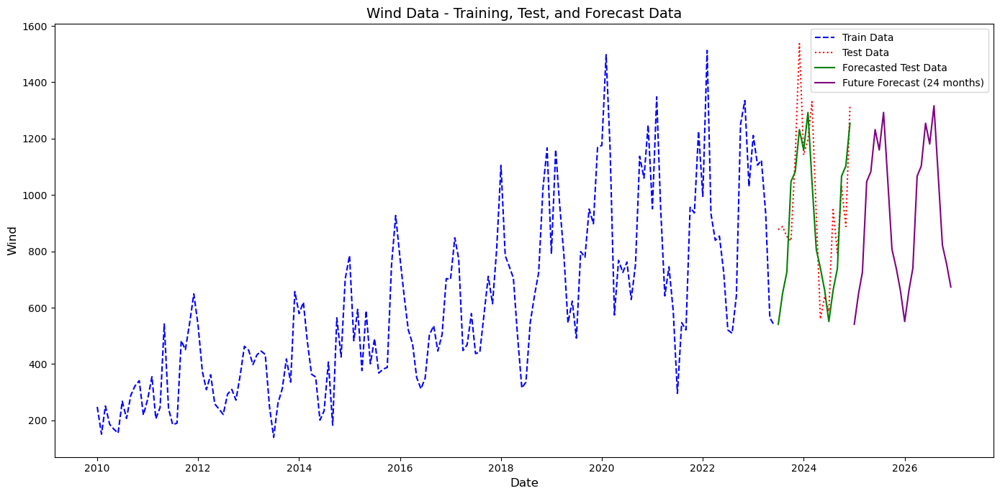

In [388]:
# Plot the training data
plt.figure(figsize=(14, 7))
plt.plot(train.index, train['Wind'], label="Train Data", color="blue", linestyle="--")

# Plot the test data
plt.plot(test.index, test['Wind'], label="Test Data", color="red", linestyle=":")

# Plot the forecasted values for the test set
plt.plot(test.index, forecast_test, label="Forecasted Test Data", color="green", linestyle="-")

# Plot the forecasted values for the next 24 months
forecast_future = model.forecast(steps=24)

future_dates = pd.date_range(start=test.index[-1] + pd.DateOffset(months=1), periods=24, freq="MS")
plt.plot(future_dates, forecast_future, label="Future Forecast (24 months)", color="purple", linestyle="-")

# Add labels and title
plt.xlabel("Date", fontsize=12)
plt.ylabel("Wind", fontsize=12)
plt.title("Wind Data - Training, Test, and Forecast Data", fontsize=14)

# Add a legend to distinguish the series
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

### Residual analysis

In [390]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(model.resid, lags=[12])

,lb_stat,lb_pvalue
12,10.00794,0.615264


##### No significant autocorrelation

In [393]:
from scipy.stats import jarque_bera
jarque_bera(model.resid)

SignificanceResult(statistic=0.6223730998819952, pvalue=0.7325772008877722)

##### Shows normality 

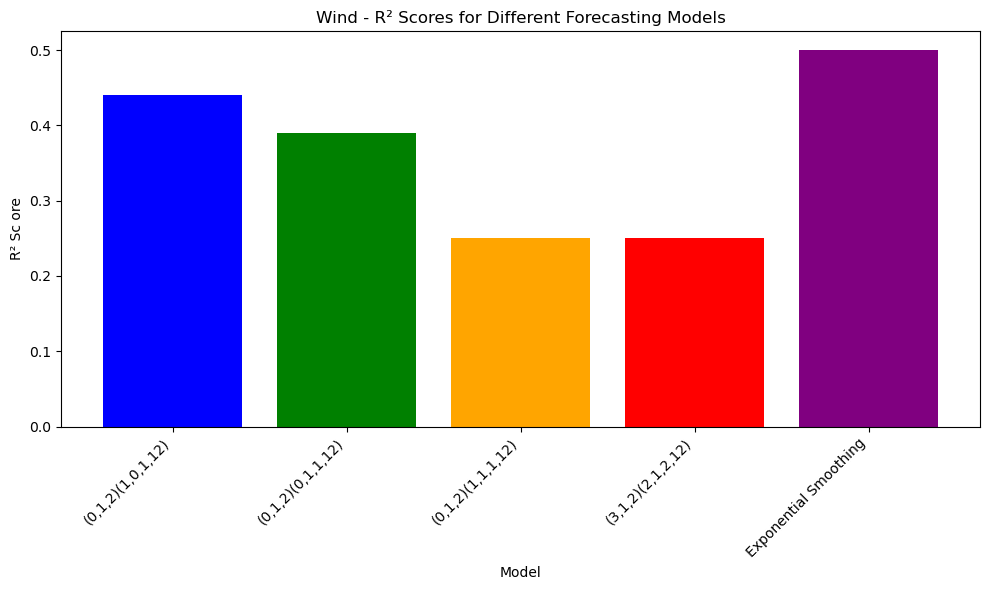

In [396]:
# Model names and their corresponding R² scores
models = [
   "(0,1,2)(1,0,1,12)", "(0,1,2)(0,1,1,12)", "(0,1,2)(1,1,1,12)", "(3,1,2)(2,1,2,12)", "Exponential Smoothing"]

r2_scores = [0.44, 0.39, 0.25, 0.25, 0.50]  # Corresponding R² scores

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(models, r2_scores, color=['blue', 'green', 'orange', 'red', 'purple'])

# Adding labels and title
plt.xlabel('Model')
plt.ylabel('R² Sc ore')
plt.title('Wind - R² Scores for Different Forecasting Models')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()

plt.show()

# Wind Energy Forecasting:

Wind energy was analyzed and forecasted as part of the overall electricity generation in Ireland, driven by its significant growth over recent years, increasing demand, and the global shift towards renewable energy sources. Both Exponential Smoothing and Auto-SARIMA models were tested to determine the most suitable parameters and scores.

Exponential Smoothing yielded a higher R² score of 50%, effectively capturing half of the variance in the data. Meanwhile, Auto-SARIMA, with an AIC value of 2085.117, produced an R² score of 44%. Residual analysis for both models revealed normality and the absence of significant autocorrelation, indicating that the models adequately fit the data. However, both models exhibited heteroscedasticity, as the variance was not constant, and showed kurtosis, with medium-tailed distributions.

Given these findings, there is a need to explore alternative modeling techniques and test new parameters to further enhance the forecasting accuracy and reduce residual issues.

# References:

##### GITHUB Link:   https://github.com/CCT-Dublin/machine-learning-for-business-ca1-Analytics-Selvi 
##### 1. ARMA - 1.ipynb, Mr. Sam Weiss
##### 2. ARMA - 2 and ARIMA.ipynb, Mr. Sam Weiss
##### 3. SARIMA Full.ipynb, Mr. Sam Weiss
##### 4. SARIMA.ipynb, Mr. Sam Weiss
##### 5. TSA-SARIMA-US Air Traffic Part 1.ipynb, Mr. Sam Weiss
##### 6. TSA-SARIMA-US Air Traffic Part 2.ipynb, Mr. Sam Weiss